# One Pixel Attack Tutorial
## Part 1 - Cifar10

### Dan Kondratyuk
### February 3, 2019

![](images/pred2.png "All it takes is one pixel")

This notebook will demonstrate the one pixel attack with a few different convolutional neural network models. By using differential evolution, we find a special pixel that can modify a target image such that the network misclassifies the image (which it previously correctly classified).

In theory, we want models that don't get fooled by such tiny changes. Especially in images, it is undesirable to have a small alteration in the input result in a drastic change in the output. However, even the most accurate neural networks are susceptible to this type of attack.

To read more about it, see [the original paper](https://arxiv.org/abs/1710.08864), or the authors' [official repo](https://github.com/Carina02/One-Pixel-Attack).

Let's get started.

## Imports

Ensure that you have `numpy`, `pandas`, `scipy`, `matplotlib`, `tensorflow-gpu`, and `keras` installed.

Alternatively, you may [run this notebook in Google Colab](https://colab.research.google.com/drive/1Zq1kGP9C7i-70-SXyuEEaqYngtyQZMn7). Note: colab allows you to run this notebook on GPU, free of charge. Simply select "GPU" in the Accelerator drop-down in Notebook Settings (either through the Edit menu or the command palette at cmd/ctrl-shift-P).

In [1]:
# If running in Google Colab, import files
try:
    import google.colab
    in_colab = True
except:
    in_colab = False

if in_colab:
    !git clone https://github.com/Hyperparticle/one-pixel-attack-keras.git
    !mv -v one-pixel-attack-keras/* .
    !rm -rf one-pixel-attack-keras

# Python Libraries
%matplotlib inline
import pickle
import csv
import numpy as np
import pandas as pd
import re
import os
import matplotlib
from keras.datasets import cifar10
from keras import backend as K
from PIL import Image

# Custom Networks
from networks.lenet import LeNet
from networks.pure_cnn import PureCnn
from networks.network_in_network import NetworkInNetwork
from networks.resnet import ResNet
from networks.densenet import DenseNet
from networks.wide_resnet import WideResNet
from networks.capsnet import CapsNet

# Helper functions
from differential_evolution import differential_evolution
import helper

matplotlib.style.use('ggplot')
np.random.seed(100)

Using TensorFlow backend.


## Load Dataset

For this attack, we will use the [Cifar10 dataset](https://www.cs.toronto.edu/~kriz/cifar.html) packaged by Keras. The task of the dataset is to correctly classify a 32x32 pixel image in 1 of 10 categories (e.g., bird, deer, truck).

The code below will load the Cifar10 dataset. Keras will need to download the dataset if it is not cached locally already.

In [2]:
(x_train, y_train), (x_test, y_test) = cifar10.load_data()

In [3]:
class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']

We can access and display any image in the dataset by its index. For instance, here is a horse.

In [60]:
# image = 99 # Image index in the test set
# helper.plot_image(x_test[image])

## Image Perturbation

To begin, we need a function to modify one or more pixels in an image. 

We can define the perturbation of a pixel as a 5-tuple 

$$\textbf{x} = (x, y, r, g, b)$$

where $x, y$ are the coordinates of the pixel from 0 to 31, and $r,g,b$ are the red, green, and blue values from 0 to 255. Then multiple perturbations can simply be a concatenation of these tuples:

$$X = (x_1, y_1, r_1, g_1, b_1, x_2, y_2, r_2, g_2, b_2, ...)$$

We could instead use an array of tuples, but the optimization algorithm we will use requires it to be a flat 1-d vector.

Then the function to perturb an image can take as an input the image and $X$, and output a copy of the image with each pixel at $x_i, y_i$ modified to have the color $r_i, g_i, b_i$. To speed up computation, we will batch together an array of $X$ perturbations, denoted $X_S$.

In [23]:
def perturb_image(xs, img):
    # If this function is passed just one perturbation vector,
    # pack it in a list to keep the computation the same
    if xs.ndim < 2:
        xs = np.array([xs])
    
    # Copy the image n == len(xs) times so that we can 
    # create n new perturbed images
    tile = [len(xs)] + [1]*(xs.ndim+1)
    imgs = np.tile(img, tile)
    
    # Make sure to floor the members of xs as int types
    xs = xs.astype(int)
    
    for x,img in zip(xs, imgs):
        # Split x into an array of 5-tuples (perturbation pixels)
        # i.e., [[x,y,r,g,b], ...]
        pixels = np.split(x, len(x) // 5)
        for pixel in pixels:
            # At each pixel's x,y position, assign its rgb value
            x_pos, y_pos, *rgb = pixel
            img[x_pos, y_pos] = rgb
    
    return imgs

Now we can modify the pixels of any image we want.

Let's modify our horse image by making pixel (16,16) yellow.

In [62]:
# image = 99 # Image index in the test set
# pixel = np.array([16, 16, 255, 255, 0]) # pixel = x,y,r,g,b
# image_perturbed = perturb_image(pixel, x_test[image])[0]

# helper.plot_image(image_perturbed)

## Load Models

To demonstrate the attack, we need some neural network models trained on the Cifar10 dataset. We will now load some pretrained models, which can be found in the `networks/models` directory.

It is recommended to use Keras with a GPU enabled. If you're [running in Google Colab](https://colab.research.google.com/drive/1Zq1kGP9C7i-70-SXyuEEaqYngtyQZMn7), you can enable a GPU instance by selecting `Runtime > Change runtime type > Hardware accelerator > GPU` (you will need to re-run all cells). The code below can be used to check (if using TensorFlow).

In [63]:
# Should output /device:GPU:0
K.tensorflow_backend._get_available_gpus()

[]

There are two models included in this repository, `lenet` and `resnet` which will be loaded from disk automatically.

Optionally, you may [download the larger, more accurate models](https://www.dropbox.com/sh/dvatkpjl0sn79kn/AAC9L4puJ_sdFUkDZfr5SFkLa?dl=0) (e.g., Capsule Network, DenseNet, etc.). Make sure to copy the models into the `networks/models/` directory. Then uncomment the lines below and run the cell to load the models of your choosing.

In [33]:
lenet = LeNet()
resnet = ResNet()
densenet = DenseNet()
pure_cnn = PureCnn()
models = [lenet, resnet, densenet, pure_cnn]

## Uncomment below to load more models to play with. Make sure the model files exist by training or downloading them.

# lenet = LeNet()
# pure_cnn = PureCnn()
# net_in_net = NetworkInNetwork()
# resnet = ResNet()
# densenet = DenseNet()
# wide_resnet = WideResNet()
# capsnet = CapsNet()

# models = [lenet, pure_cnn, net_in_net, resnet, densenet, wide_resnet, capsnet]

Successfully loaded lenet
Successfully loaded resnet
Successfully loaded densenet
Successfully loaded pure_cnn


Note that there are even more networks available in the `networks` directory, but must be trained before loading them here.

### Calculate Model Accuracies

After loading the models, we would like to evaluate all test images with each model to ensure that we only attack the images which have been classified correctly. The code below will also display the accuracy and number of parameters of each model.

In [ ]:
network_stats, correct_imgs = helper.evaluate_models(models, x_test, y_test)
correct_imgs = pd.DataFrame(correct_imgs, columns=['name', 'img', 'label', 'confidence', 'pred'])
network_stats = pd.DataFrame(network_stats, columns=['name', 'accuracy', 'param_count'])

network_stats

Evaluating lenet
Evaluating resnet


### Prediction Function

For the black-box attack, all we should care about is the inputs to the model (the images), and the outputs of the model (the prediction probabilities). No special information about the model is required; we could even swap it with a model that is not a neural network.

Define a function that runs several perturbed images on a given model and returns the model's confidence (probability output) in the target class, one confidence value per image. If the target class is the correct class, this will be the function that we want to minimize so that the model will be most confident in another class (which is incorrect). Otherwise, the target is an incorrect class and we will want to maximize it.

In [9]:
def predict_classes(xs, img, target_class, model, minimize=True):
    # Perturb the image with the given pixel(s) x and get the prediction of the model
    imgs_perturbed = perturb_image(xs, img)
    predictions = model.predict(imgs_perturbed)[:,target_class]
    # This function should always be minimized, so return its complement if needed
    return predictions if minimize else 1 - predictions

Below we can modify a pixel in an image and see how the confidence of the model changes. In almost all cases, the confidence will not change. However, for very special cases it will change drastically.

In [67]:
# image = 384
# pixel = np.array([16, 13,  25, 48, 156])
# model = resnet

# true_class = y_test[image,0]
# prior_confidence = model.predict_one(x_test[image])[true_class]
# confidence = predict_classes(pixel, x_test[image], true_class, model)[0]

# print('Confidence in true class', class_names[true_class], 'is', confidence)
# print('Prior confidence was', prior_confidence)
# helper.plot_image(perturb_image(pixel, x_test[image])[0])

## The Attack

Here we will demonstrate two variants of the one pixel attack: untargeted and targeted.

### Targeted vs. Untargeted Attacks

The objective of an untargeted attack is to cause a model to misclassify an image. This means we want to perturb an image as to minimize the confidence probability of the correct classification category and maximize the sum of the probabilities of all other categories.

The objective of a targeted attack is to cause a model to classify an image as a given  target class. We want to perturb an image as to maximize the probability of a class of our own choosing.

### Success Criterion

Define a function so that whenever a given perturbation is sufficient to fool a model, it returns `True`. This will be called the success criterion. The `targeted_attack` boolean flag will indicate whether success means maximization of the target class or minimization of the correct (target) class.

In [10]:
def attack_success(x, img, target_class, model, targeted_attack=False, verbose=False):
    # Perturb the image with the given pixel(s) and get the prediction of the model
    attack_image = perturb_image(x, x_test[img])

    confidence = model.predict(attack_image)[0]
    predicted_class = np.argmax(confidence)
    
    # If the prediction is what we want (misclassification or 
    # targeted classification), return True
    if (verbose):
        print('Confidence:', confidence[target_class])
    if ((targeted_attack and predicted_class == target_class) or
        (not targeted_attack and predicted_class != target_class)):
        return True
    # NOTE: return None otherwise (not False), due to how Scipy handles its callback function

Here we demonstrate the usage of the success criterion function. It's nearly identical to `predict_class()` as before, but also decides the success of the attack. For purposes of demonstration we assume an untargeted attack.

In [69]:
# image = 541
# pixel = np.array([17, 18, 185, 36, 215])
# model = resnet

# true_class = y_test[image,0]
# prior_confidence = model.predict_one(x_test[image])[true_class]
# success = attack_success(pixel, image, true_class, model, verbose=True)

# print('Prior confidence', prior_confidence)
# print('Attack success:', success == True)
# helper.plot_image(perturb_image(pixel, x_test[image])[0])

### Attack Function

Finally, we arrive at the attack itself: how do we find the pixels that will result in a successful attack? First, formulate it as an optimization problem: in an untargeted attack, minimize the confidence of the correct class, and in a targeted attack, maximize the confidence of a target class. This is precisely our `predict_class` function.

When performing black-box optimizations such as the one pixel attack, it can be very difficult to find an efficient gradient-based optimization that will work for the problem. It would be nice to use an optimization algorithm that can find good solutions without relying on the smoothness of the function. In our case, we have discrete integer positions ranging from 0 to 31 and color intensities from 0 to 255, so the function is expected to be jagged.

For that, we use an algorithm called [differential evolution](https://en.wikipedia.org/wiki/Differential_evolution). Here's an example of differential evolution optimizing the [Ackley function](https://en.wikipedia.org/wiki/Ackley_function) (if you're using Google Colab, run the code cell below):

<br>

![Ackley GIF](images/Ackley.gif)

<br>

Differential evolution is a type of evolutionary algorithm where a population of candidate solutions generate offspring which compete with the rest of the population each generation according to their fitness. Each candidate solution is represented by a vector of real numbers which are the inputs to the function we would like to minimize. The lower the output of this function, the better the fitness. The algorithm works by initializing a (usually random) population of vectors, generating new offspring vectors by combining (mutating) individuals in the population, and replacing worse-performing individuals with better candidates.

In the context of the one pixel attack, our input will be a flat vector of pixel values:

$$X = (x_1, y_1, r_1, g_1, b_1, x_2, y_2, r_2, g_2, b_2, ...)$$

These will be encoded as floating-point values, but will be floored back into integers to calculate image perturbations. First we generate a random population of $n$ perturbations

$$\textbf{P} = (X_1, X_2, \dots, X_n)$$

Then, on each iteration we calculate $n$ new mutant children using the formula

$$X_i = X_{r1} + F (X_{r2} - X_{r3})$$

such that

$$r1 \neq r2 \neq r3$$

where $r1,r2,r3$ are random indices into our population $\textbf{P}$, and $F = 0.5$ is a mutation parameter. Basically, we pick 3 random individuals from the previous generation and recombine them to make a new candidate solution. If this candidate $X_i$ gives a lower minimum at position $i$ (i.e., the attack is closer to success), replace the old $X_i$ with this new one. This process repeats for several iterations until our stopping criterion, `attack_success`, which is when we find an image that successfully completes the attack.

<br>

See [this excellent tutorial post](https://pablormier.github.io/2017/09/05/a-tutorial-on-differential-evolution-with-python/) on how differential evolution works in greater detail. 

We will use a [slight modification](differential_evolution.py) of [Scipy's implementation of differential evolution](https://docs.scipy.org/doc/scipy-0.17.0/reference/generated/scipy.optimize.differential_evolution.html) to utilize GPU parallelism by batching predictions together.

In [70]:
# Run this cell if you are using Google Colab to see the Ackley GIF
# if in_colab:
#     from IPython.display import Image
#     with open('images/Ackley.gif','rb') as file:
#         display(Image(file.read()))

In [11]:
def attack(img, model, target=None, pixel_count=1, 
           maxiter=75, popsize=400, verbose=False):
    # Change the target class based on whether this is a targeted attack or not
    targeted_attack = target is not None
    target_class = target if targeted_attack else y_test[img,0]
    
    # Define bounds for a flat vector of x,y,r,g,b values
    # For more pixels, repeat this layout
    bounds = [(0,32), (0,32), (0,256), (0,256), (0,256)] * pixel_count
    
    # Population multiplier, in terms of the size of the perturbation vector x
    popmul = max(1, popsize // len(bounds))
    
    # Format the predict/callback functions for the differential evolution algorithm
    predict_fn = lambda xs: predict_classes(
        xs, x_test[img], target_class, model, target is None)
    callback_fn = lambda x, convergence: attack_success(
        x, img, target_class, model, targeted_attack, verbose)
    
    # Call Scipy's Implementation of Differential Evolution
    attack_result = differential_evolution(
        predict_fn, bounds, maxiter=maxiter, popsize=popmul,
        recombination=1, atol=-1, callback=callback_fn, polish=False)

    # Calculate some useful statistics to return from this function
    attack_image = perturb_image(attack_result.x, x_test[img])[0]
    prior_probs = model.predict_one(x_test[img])
    predicted_probs = model.predict_one(attack_image)
    predicted_class = np.argmax(predicted_probs)
    actual_class = y_test[img,0]
    success = predicted_class != actual_class
    cdiff = prior_probs[actual_class] - predicted_probs[actual_class]
    
    #Save attacked images
    attack_image_save = Image.fromarray(attack_image)
    attack_image_save.save(model.name + '_attack/' + class_names[actual_class] + '_' + str(img) + '.bmp')
    #attack_image_save.save(model.name + '_test/' + class_names[actual_class] + '_' + str(img) + '.bmp')
    #Save attacked images stats
    #file = open(model.name + '_test.csv', 'a')
    file = open(model.name + '_attack_prediction.csv', 'a')
    with file:
        writer = csv.writer(file)
        writer.writerow([img, model.name, prior_probs, predicted_probs, class_names[predicted_class], class_names[actual_class], pixel_count])

    # Show the best attempt at a solution (successful or not)
    helper.plot_image(attack_image, actual_class, class_names, predicted_class)

    return [model.name, pixel_count, img, actual_class, predicted_class, success, cdiff, prior_probs, predicted_probs, attack_result.x]

#### Untargeted Attack

Let's look at one iteration of the untargeted attack. Here we will demonstrate a successful attack an image of a frog with the `resnet` model. We should see the confidence in the true class drop after several iterations.

Try to see if you can successfully attack other images/models. The more pixels we are allowed to modify, the more likely it is we are to find a solution for any given image.

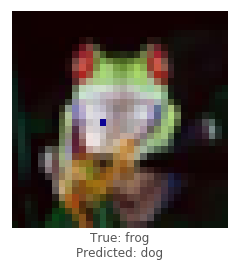

In [72]:
# image = 102
# pixels = 1 # Number of pixels to attack
# model = resnet

# _ = attack(image, model, pixel_count=pixels, verbose=False)

#### Targeted Attack

In the targeted attack, we can choose which class we want a model to classify an image as. The task is much harder for the targeted attack, as we constrain the misclassification to a given class rather than any class that's not the correct one. We should see the confidence in the target class rise after several iterations.

Below we try to cause the `lenet` to classify an image of a `ship` as an `automobile`. Try to change the parameters and see what happens.

Attacking with target automobile
Confidence: 0.029963315
Confidence: 0.029963315
Confidence: 0.029963315
Confidence: 0.029963315
Confidence: 0.029963315
Confidence: 0.029963315
Confidence: 0.029963315
Confidence: 0.044293065
Confidence: 0.044293065
Confidence: 0.044293065
Confidence: 0.044321228
Confidence: 0.044321228
Confidence: 0.044321228
Confidence: 0.05548797
Confidence: 0.05548797
Confidence: 0.05548797
Confidence: 0.05548797
Confidence: 0.05548797
Confidence: 0.05548797
Confidence: 0.05548797
Confidence: 0.09439217
Confidence: 0.09439217
Confidence: 0.09439217
Confidence: 0.09439217
Confidence: 0.09439217
Confidence: 0.09439217
Confidence: 0.09439217
Confidence: 0.09439217
Confidence: 0.09439217
Confidence: 0.09439217
Confidence: 0.09439217
Confidence: 0.11531388
Confidence: 0.11531388
Confidence: 0.11531388
Confidence: 0.11531388
Confidence: 0.11531388
Confidence: 0.11531388
Confidence: 0.11531388
Confidence: 0.11531388
Confidence: 0.11531388
Confidence: 0.43446165
Confidence:

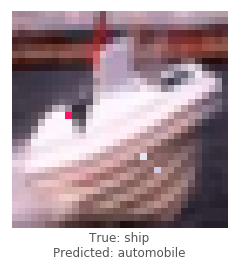

In [73]:
# image = 108
# target_class = 1 # Integer in range 0-9
# pixels = 3
# model = lenet

# print('Attacking with target', class_names[target_class])
# _ = attack(image, model, target_class, pixel_count=pixels, verbose=True)

### Collect Results

Armed with all the necessary tools to conduct a one pixel attack, the final step is to collect relevant statistics on the targeted and untargeted attack. The relevant data points are what percentage of images were we able to successfully attack for a given model, and how the number of pixels affect this percentage.

We will loop through every combination of all models, perturbations of 1,3,5 pixels, images, and target classes (for the targeted attack). This will take a lot of computational resources and time, so [skip to the statistics section](#Attack-Statistics) if that's not your idea of fun.

In [26]:
def attack_all(models, samples=500, pixels=(1,3,5), targeted=False, 
               maxiter=75, popsize=400, verbose=False):
    results = []
    for model in models:
        model_results = []
        valid_imgs = correct_imgs[correct_imgs.name == model.name].img
        print(len(valid_imgs))
        img_samples = np.random.choice(valid_imgs, samples, replace=False)
        print(len(img_samples))
        print(len(img_samples) == len(set(img_samples)))
        
        for pixel_count in pixels:
            for i,img in enumerate(img_samples):
                print(model.name, '- image', img, '-', i+1, '/', len(img_samples))
                targets = [None] if not targeted else range(10)
                
                for target in targets:
                    if (targeted):
                        print('Attacking with target', class_names[target])
                        if (target == y_test[img,0]):
                            continue
                    result = attack(img, model, target, pixel_count, 
                                    maxiter=maxiter, popsize=popsize, 
                                    verbose=verbose)
                    model_results.append(result)
                    
        results += model_results
        helper.checkpoint(results, targeted)
    return results

7488
1000
True
lenet - image 4489 - 1 / 1000


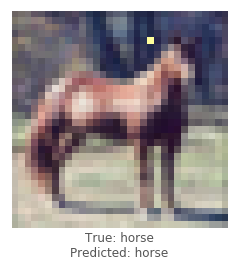

lenet - image 1985 - 2 / 1000


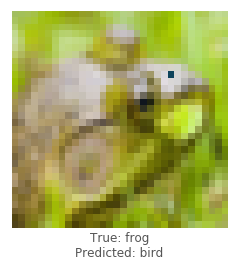

lenet - image 8765 - 3 / 1000


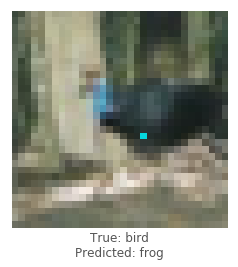

lenet - image 9949 - 4 / 1000


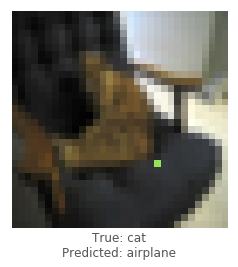

lenet - image 195 - 5 / 1000


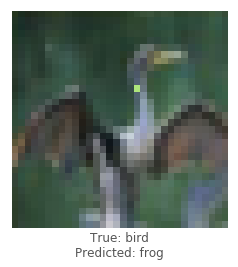

lenet - image 7092 - 6 / 1000


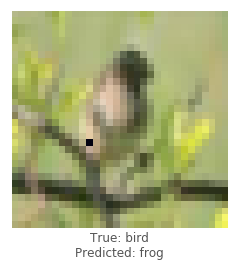

lenet - image 8430 - 7 / 1000


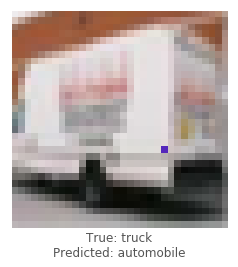

lenet - image 7226 - 8 / 1000


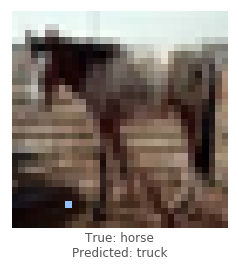

lenet - image 8247 - 9 / 1000


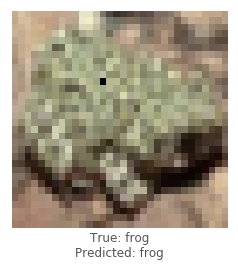

lenet - image 9519 - 10 / 1000


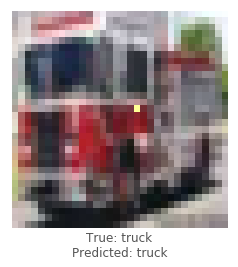

lenet - image 1762 - 11 / 1000


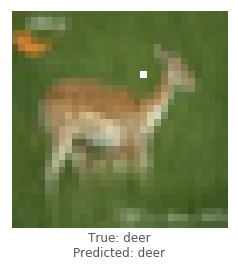

lenet - image 6908 - 12 / 1000


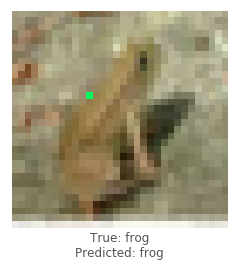

lenet - image 2365 - 13 / 1000


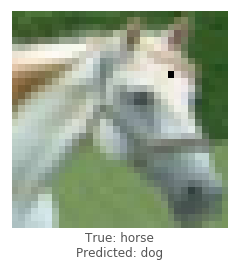

lenet - image 9364 - 14 / 1000


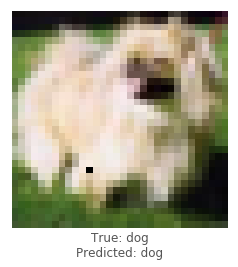

lenet - image 6603 - 15 / 1000


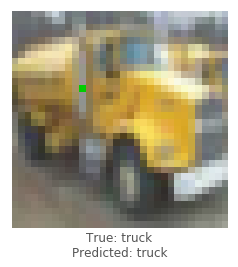

lenet - image 3223 - 16 / 1000


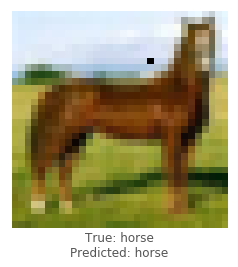

lenet - image 3001 - 17 / 1000


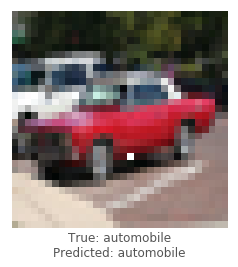

lenet - image 3198 - 18 / 1000


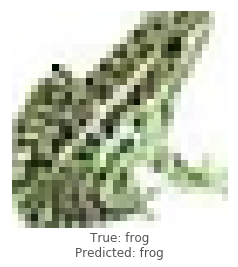

lenet - image 6501 - 19 / 1000


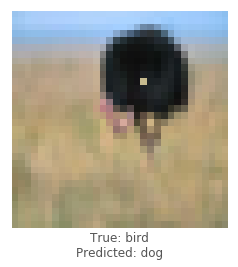

lenet - image 857 - 20 / 1000


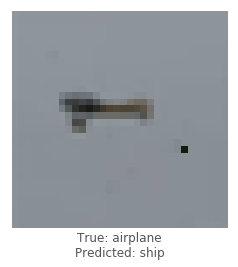

lenet - image 6799 - 21 / 1000


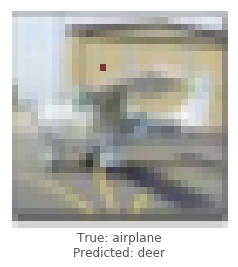

lenet - image 7476 - 22 / 1000


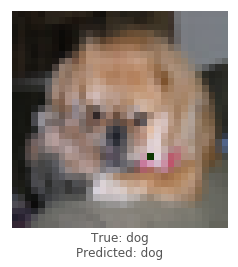

lenet - image 6327 - 23 / 1000


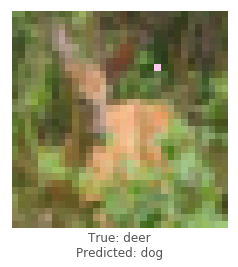

lenet - image 339 - 24 / 1000


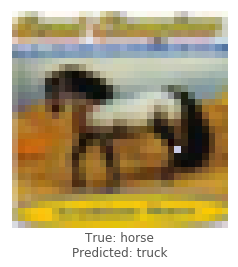

lenet - image 4856 - 25 / 1000


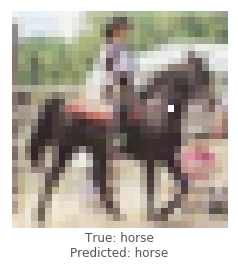

lenet - image 9335 - 26 / 1000


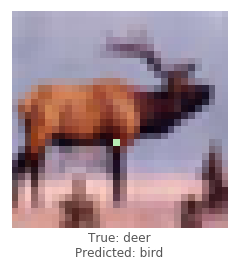

lenet - image 8301 - 27 / 1000


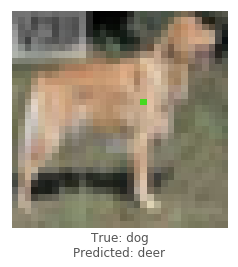

lenet - image 1493 - 28 / 1000


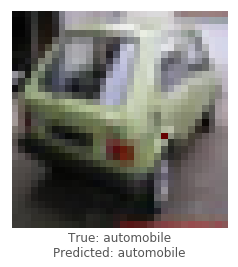

lenet - image 8327 - 29 / 1000


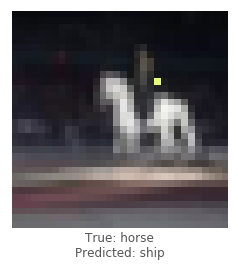

lenet - image 8917 - 30 / 1000


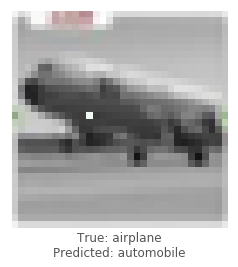

lenet - image 3057 - 31 / 1000


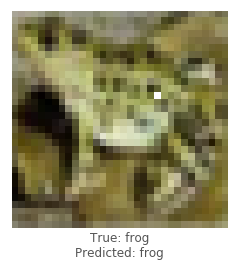

lenet - image 1697 - 32 / 1000


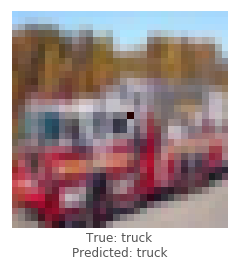

lenet - image 9758 - 33 / 1000


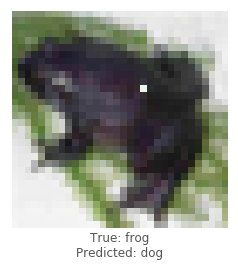

lenet - image 8081 - 34 / 1000


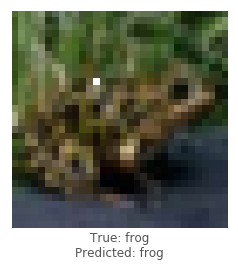

lenet - image 6241 - 35 / 1000


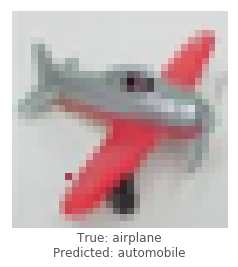

lenet - image 9179 - 36 / 1000


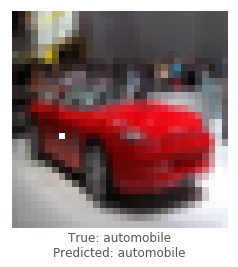

lenet - image 6923 - 37 / 1000


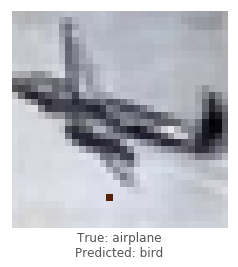

lenet - image 5649 - 38 / 1000


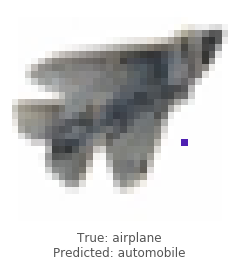

lenet - image 2693 - 39 / 1000


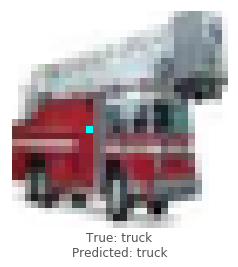

lenet - image 3875 - 40 / 1000


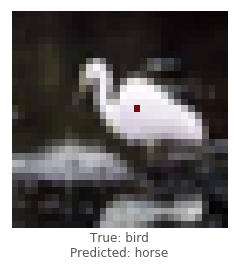

lenet - image 2908 - 41 / 1000


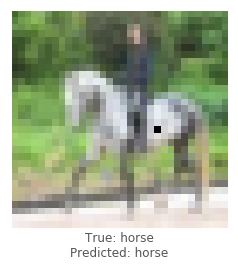

lenet - image 8374 - 42 / 1000


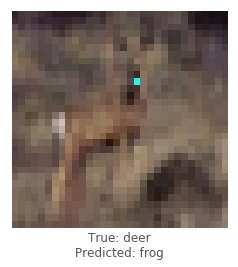

lenet - image 3483 - 43 / 1000


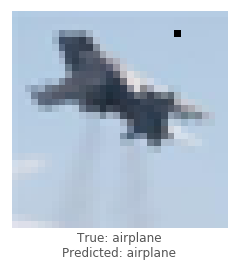

lenet - image 1435 - 44 / 1000


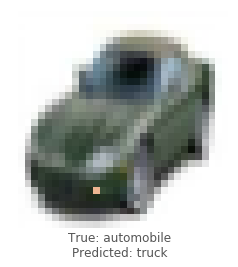

lenet - image 1819 - 45 / 1000


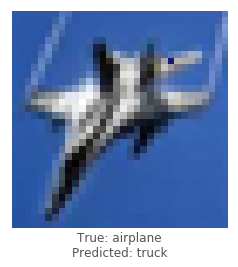

lenet - image 5131 - 46 / 1000


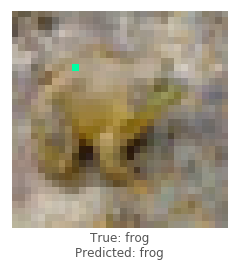

lenet - image 8524 - 47 / 1000


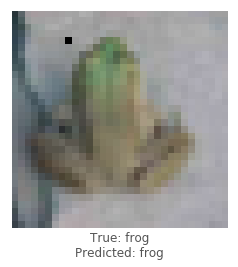

lenet - image 3566 - 48 / 1000


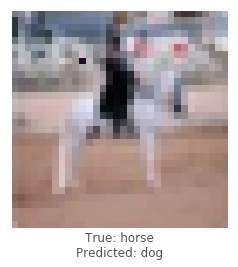

lenet - image 1092 - 49 / 1000


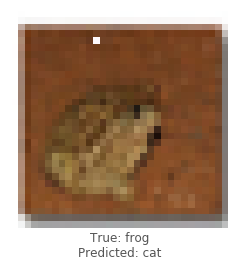

lenet - image 5141 - 50 / 1000


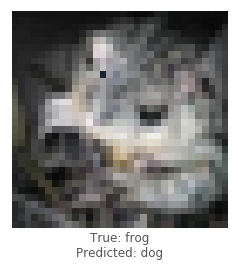

lenet - image 5899 - 51 / 1000


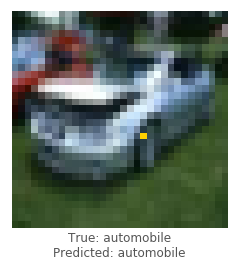

lenet - image 7823 - 52 / 1000


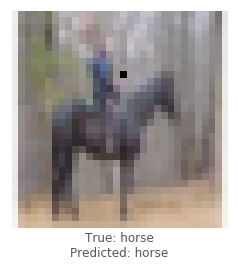

lenet - image 5587 - 53 / 1000


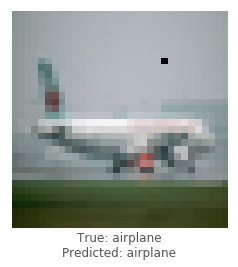

lenet - image 7560 - 54 / 1000


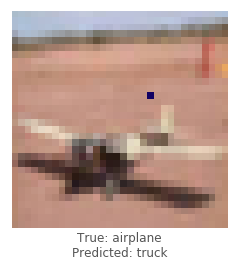

lenet - image 9620 - 55 / 1000


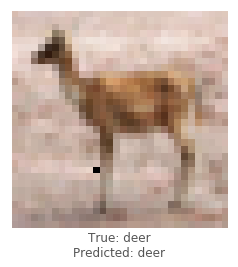

lenet - image 8124 - 56 / 1000


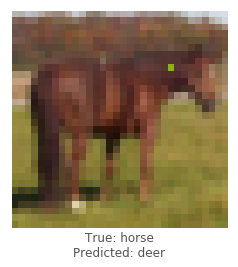

lenet - image 2429 - 57 / 1000


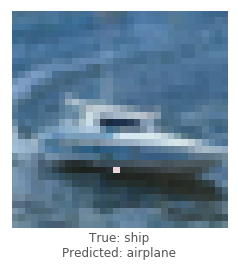

lenet - image 311 - 58 / 1000


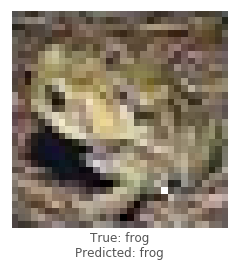

lenet - image 8243 - 59 / 1000


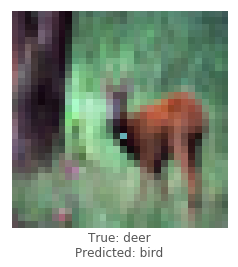

lenet - image 7392 - 60 / 1000


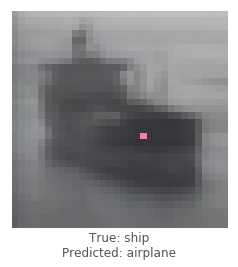

lenet - image 2666 - 61 / 1000


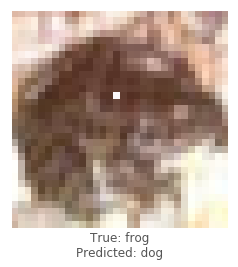

lenet - image 5516 - 62 / 1000


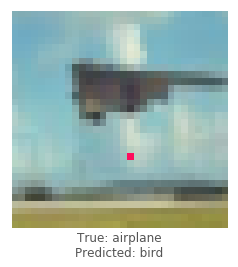

lenet - image 7248 - 63 / 1000


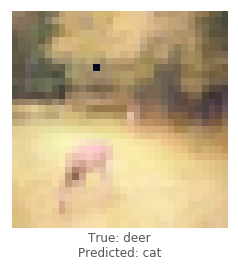

lenet - image 4835 - 64 / 1000


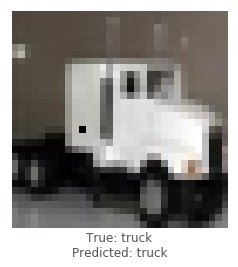

lenet - image 4033 - 65 / 1000


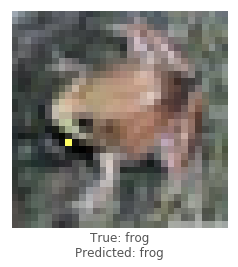

lenet - image 9181 - 66 / 1000


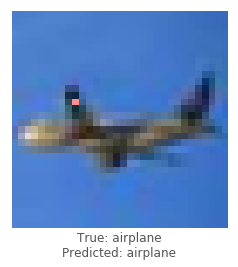

lenet - image 3453 - 67 / 1000


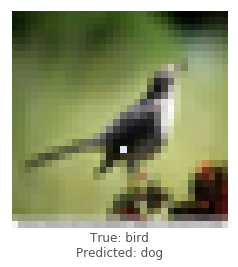

lenet - image 674 - 68 / 1000


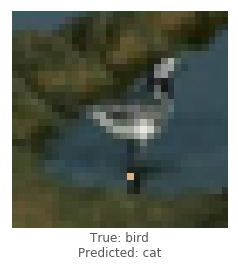

lenet - image 7151 - 69 / 1000


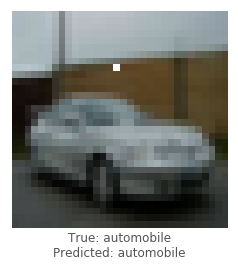

lenet - image 3041 - 70 / 1000


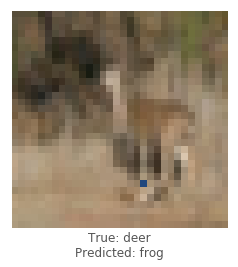

lenet - image 6086 - 71 / 1000


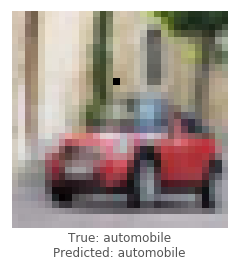

lenet - image 452 - 72 / 1000


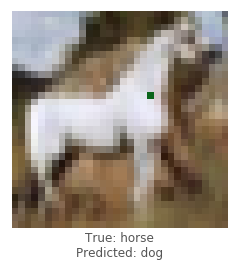

lenet - image 5225 - 73 / 1000


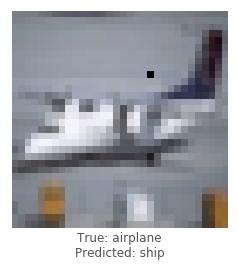

lenet - image 4361 - 74 / 1000


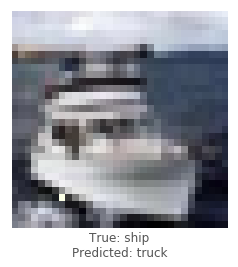

lenet - image 458 - 75 / 1000


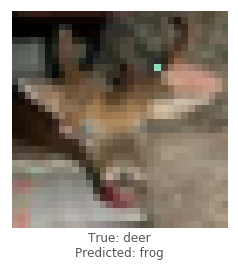

lenet - image 9083 - 76 / 1000


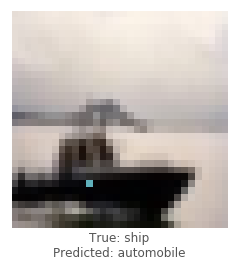

lenet - image 7819 - 77 / 1000


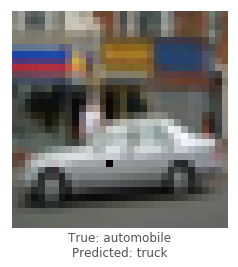

lenet - image 2097 - 78 / 1000


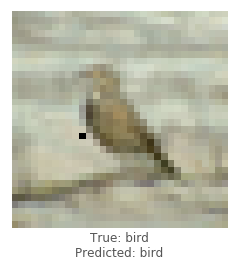

lenet - image 686 - 79 / 1000


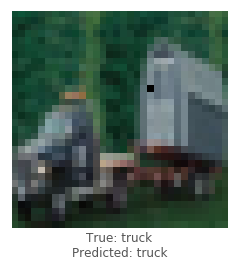

lenet - image 3224 - 80 / 1000


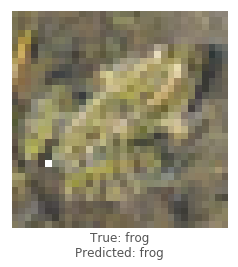

lenet - image 7672 - 81 / 1000


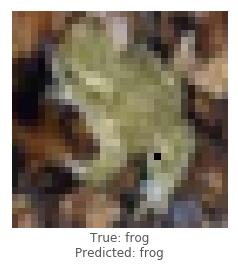

lenet - image 4854 - 82 / 1000


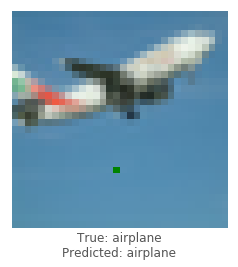

lenet - image 6227 - 83 / 1000


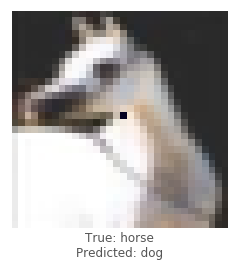

lenet - image 4502 - 84 / 1000


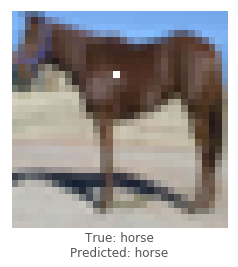

lenet - image 8299 - 85 / 1000


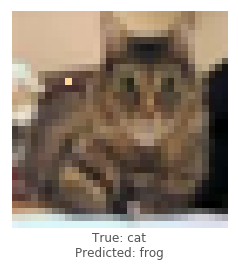

lenet - image 2913 - 86 / 1000


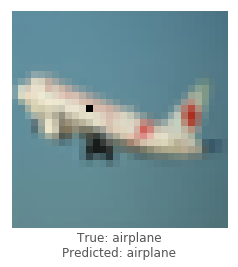

lenet - image 236 - 87 / 1000


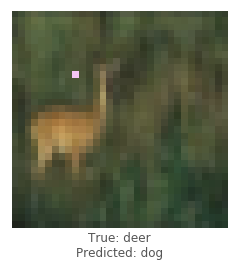

lenet - image 6159 - 88 / 1000


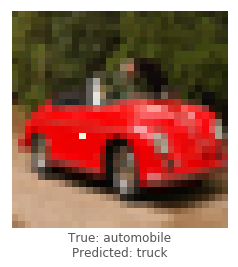

lenet - image 8509 - 89 / 1000


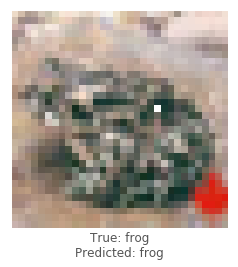

lenet - image 3332 - 90 / 1000


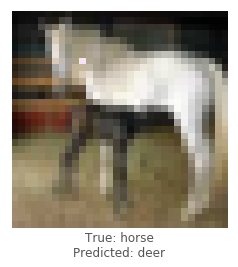

lenet - image 2108 - 91 / 1000


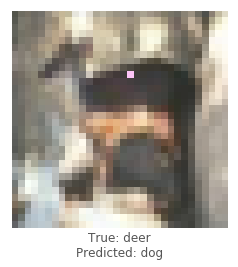

lenet - image 2341 - 92 / 1000


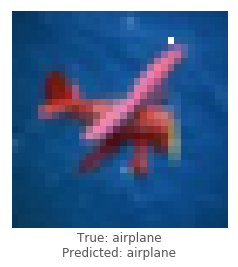

lenet - image 7954 - 93 / 1000


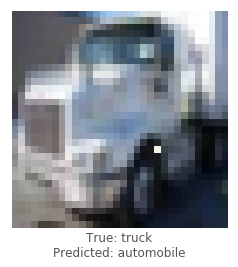

lenet - image 7631 - 94 / 1000


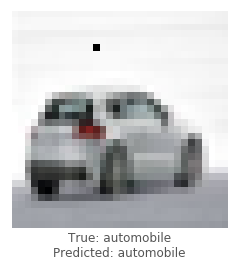

lenet - image 7883 - 95 / 1000


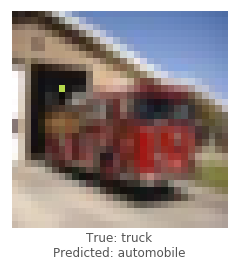

lenet - image 3402 - 96 / 1000


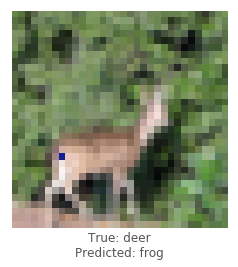

lenet - image 6129 - 97 / 1000


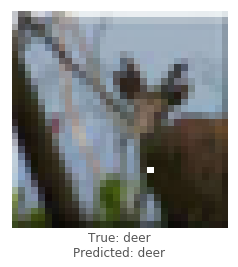

lenet - image 1454 - 98 / 1000


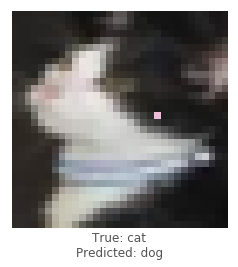

lenet - image 7941 - 99 / 1000


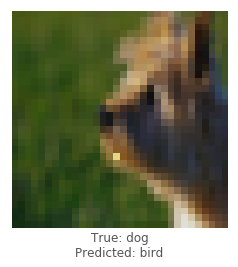

lenet - image 3886 - 100 / 1000


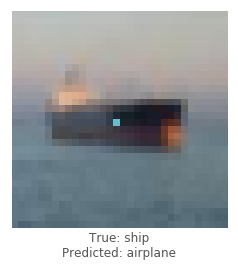

lenet - image 805 - 101 / 1000


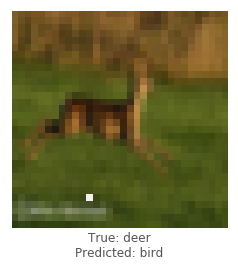

lenet - image 1257 - 102 / 1000


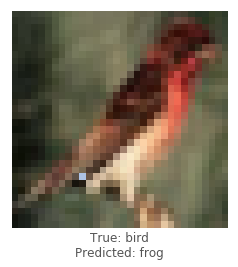

lenet - image 6886 - 103 / 1000


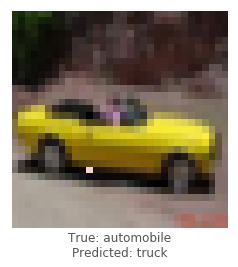

lenet - image 6381 - 104 / 1000


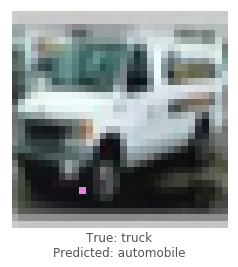

lenet - image 4583 - 105 / 1000


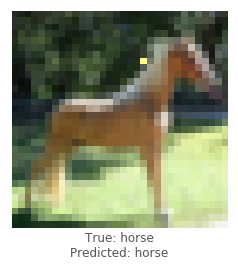

lenet - image 2970 - 106 / 1000


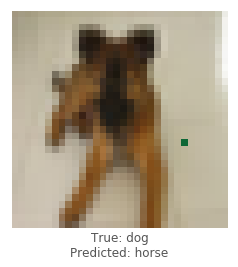

lenet - image 2057 - 107 / 1000


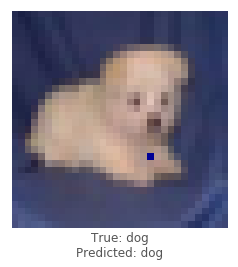

lenet - image 826 - 108 / 1000


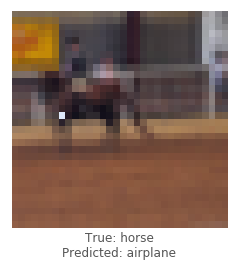

lenet - image 4569 - 109 / 1000


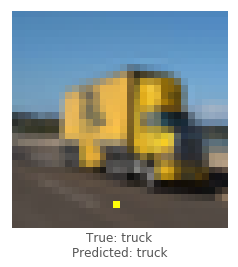

lenet - image 4649 - 110 / 1000


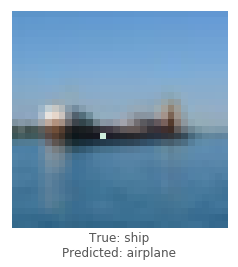

lenet - image 2545 - 111 / 1000


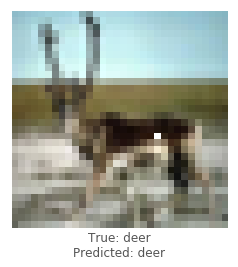

lenet - image 5581 - 112 / 1000


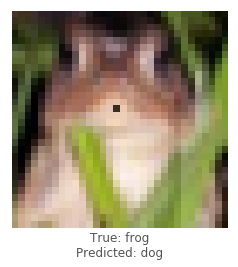

lenet - image 5332 - 113 / 1000


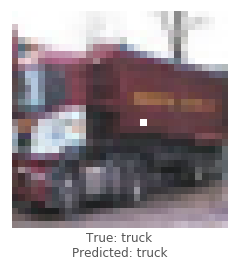

lenet - image 5317 - 114 / 1000


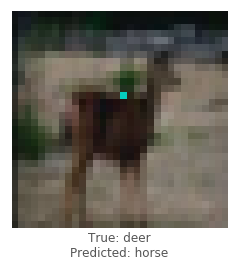

lenet - image 1917 - 115 / 1000


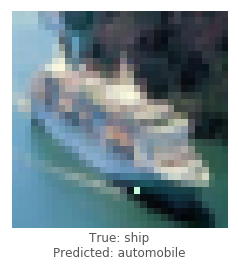

lenet - image 1995 - 116 / 1000


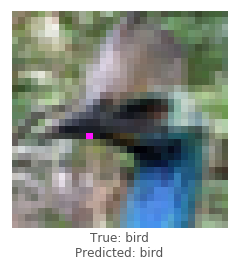

lenet - image 1305 - 117 / 1000


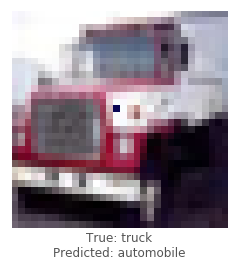

lenet - image 8825 - 118 / 1000


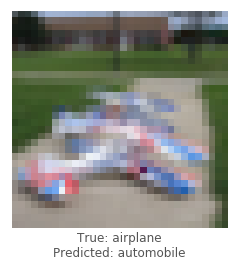

lenet - image 7001 - 119 / 1000


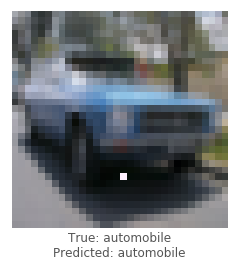

lenet - image 3470 - 120 / 1000


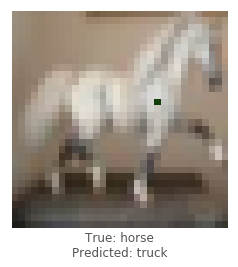

lenet - image 2410 - 121 / 1000


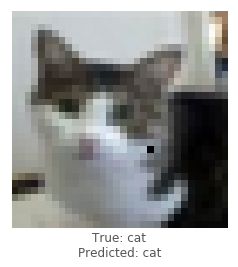

lenet - image 1134 - 122 / 1000


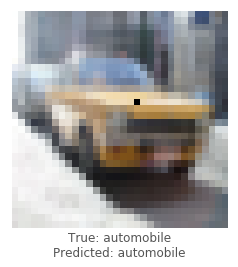

lenet - image 186 - 123 / 1000


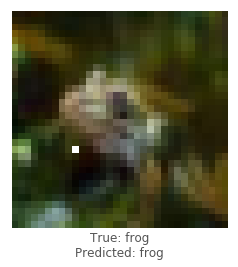

lenet - image 9053 - 124 / 1000


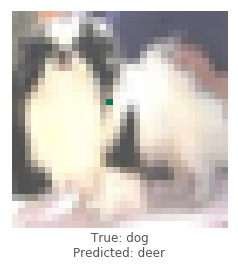

lenet - image 961 - 125 / 1000


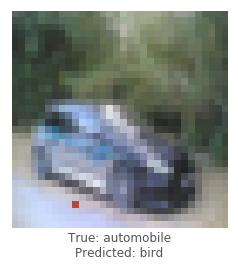

lenet - image 7276 - 126 / 1000


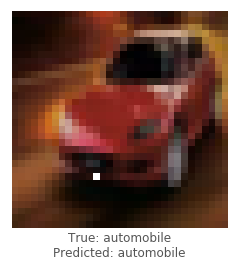

lenet - image 2891 - 127 / 1000


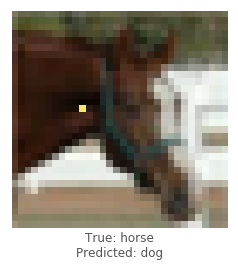

lenet - image 6789 - 128 / 1000


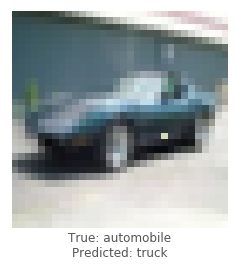

lenet - image 2549 - 129 / 1000


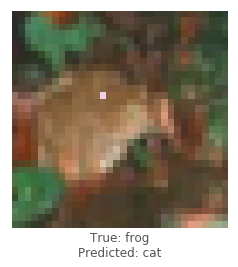

lenet - image 1722 - 130 / 1000


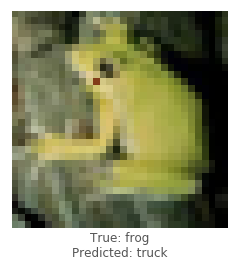

lenet - image 8001 - 131 / 1000


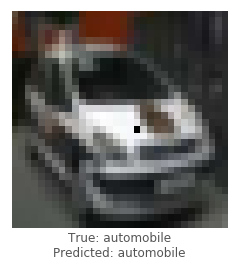

lenet - image 9478 - 132 / 1000


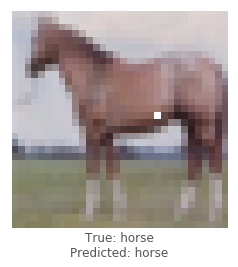

lenet - image 2794 - 133 / 1000


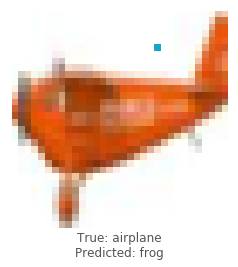

lenet - image 5688 - 134 / 1000


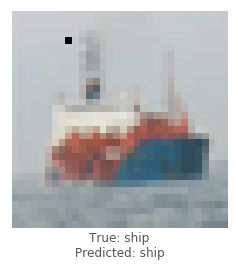

lenet - image 5133 - 135 / 1000


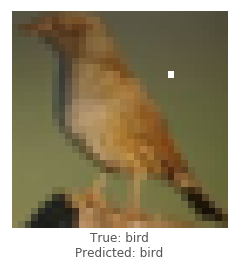

lenet - image 9100 - 136 / 1000


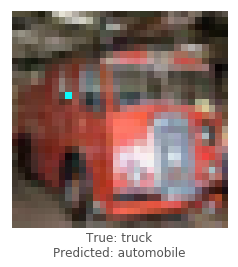

lenet - image 5686 - 137 / 1000


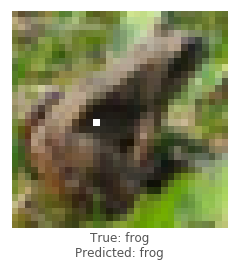

lenet - image 6055 - 138 / 1000


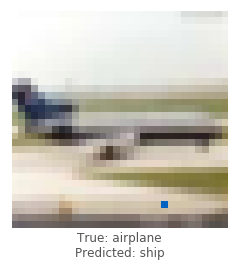

lenet - image 8639 - 139 / 1000


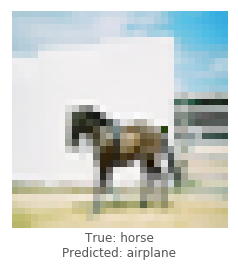

lenet - image 8953 - 140 / 1000


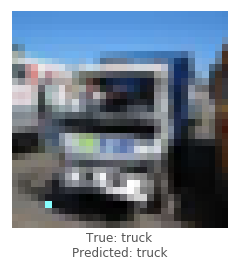

lenet - image 858 - 141 / 1000


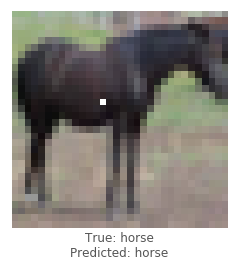

lenet - image 5491 - 142 / 1000


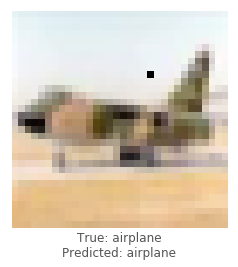

lenet - image 4678 - 143 / 1000


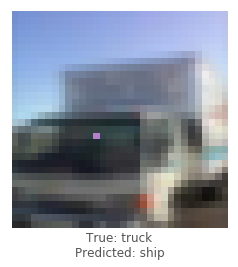

lenet - image 2484 - 144 / 1000


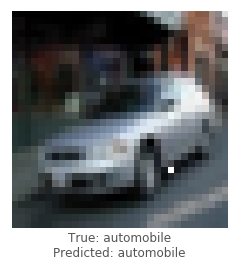

lenet - image 9636 - 145 / 1000


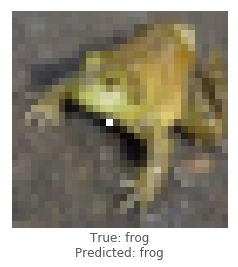

lenet - image 5237 - 146 / 1000


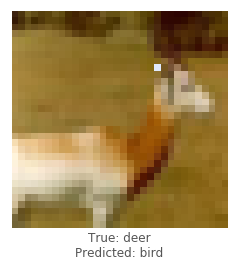

lenet - image 8049 - 147 / 1000


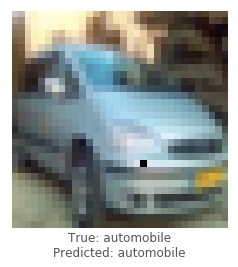

lenet - image 9638 - 148 / 1000


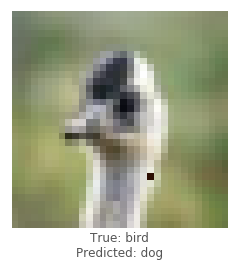

lenet - image 6884 - 149 / 1000


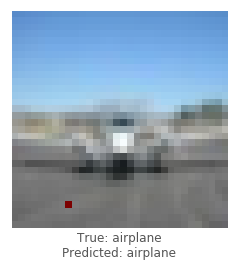

lenet - image 3786 - 150 / 1000


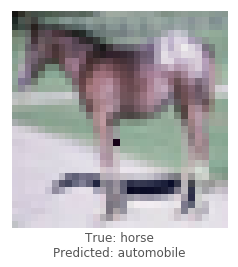

lenet - image 7345 - 151 / 1000


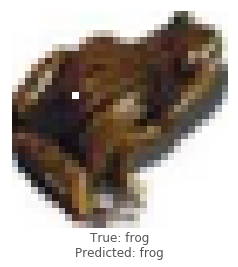

lenet - image 3590 - 152 / 1000


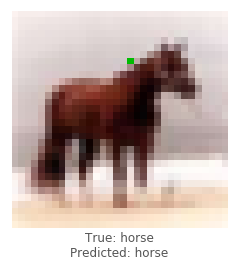

lenet - image 2357 - 153 / 1000


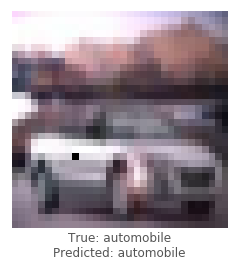

lenet - image 475 - 154 / 1000


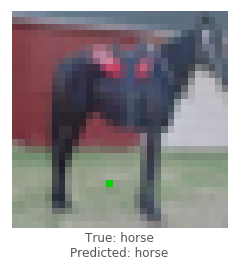

lenet - image 1316 - 155 / 1000


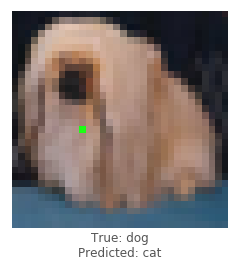

lenet - image 7121 - 156 / 1000


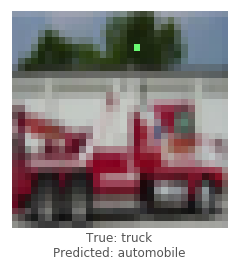

lenet - image 4690 - 157 / 1000


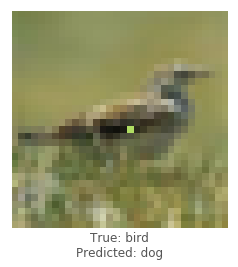

lenet - image 8688 - 158 / 1000


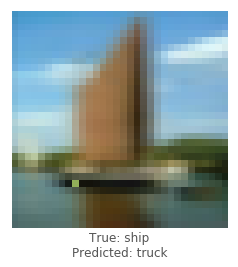

lenet - image 6862 - 159 / 1000


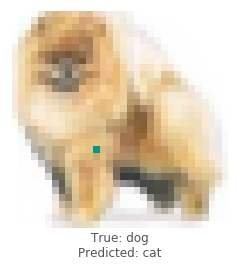

lenet - image 3809 - 160 / 1000


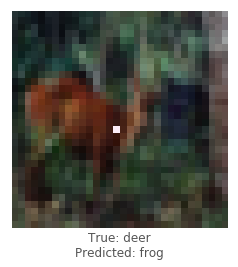

lenet - image 3360 - 161 / 1000


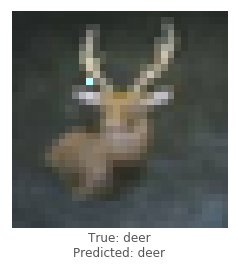

lenet - image 1192 - 162 / 1000


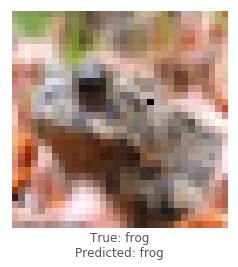

lenet - image 5732 - 163 / 1000


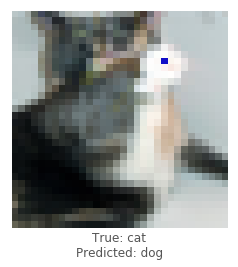

lenet - image 6619 - 164 / 1000


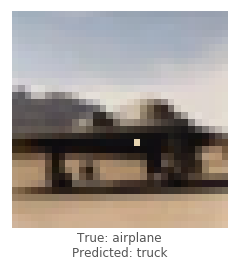

lenet - image 959 - 165 / 1000


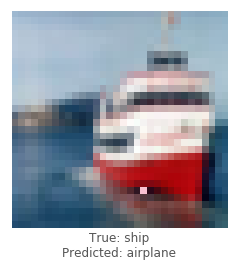

lenet - image 5478 - 166 / 1000


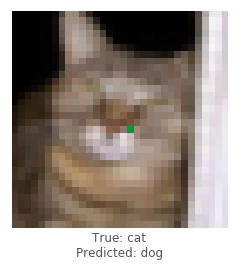

lenet - image 8727 - 167 / 1000


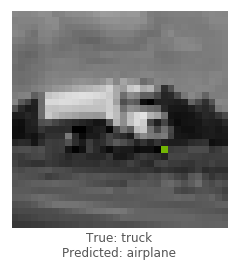

lenet - image 4989 - 168 / 1000


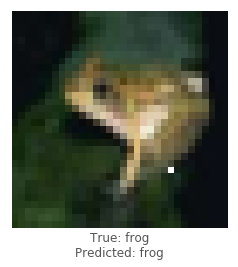

lenet - image 3536 - 169 / 1000


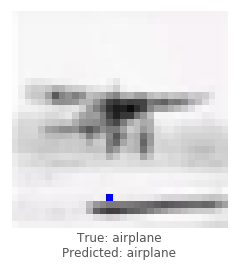

lenet - image 2698 - 170 / 1000


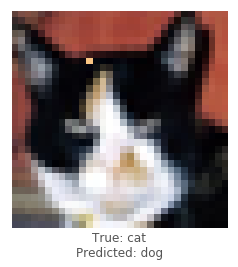

lenet - image 3353 - 171 / 1000


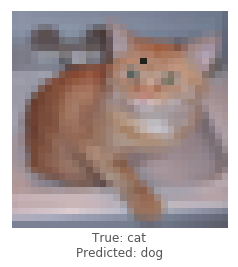

lenet - image 433 - 172 / 1000


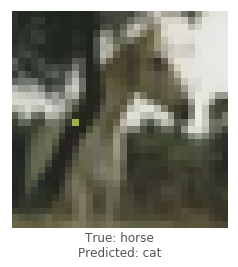

lenet - image 6233 - 173 / 1000


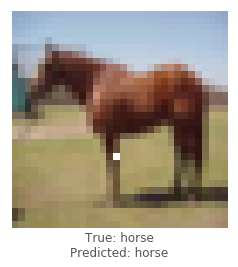

lenet - image 4263 - 174 / 1000


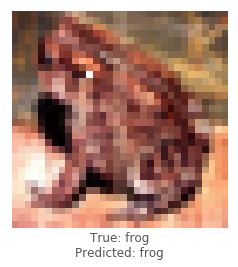

lenet - image 9152 - 175 / 1000


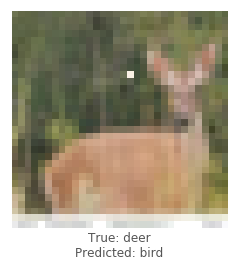

lenet - image 3990 - 176 / 1000


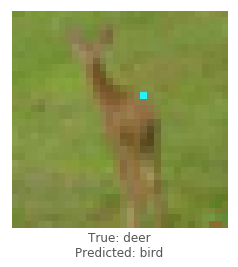

lenet - image 9932 - 177 / 1000


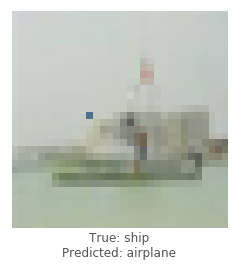

lenet - image 8980 - 178 / 1000


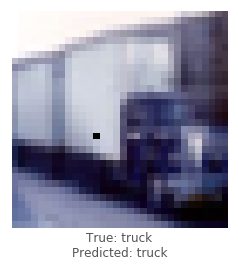

lenet - image 6155 - 179 / 1000


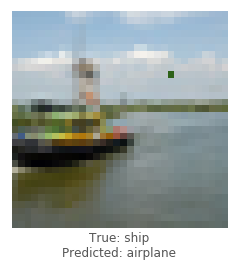

lenet - image 3953 - 180 / 1000


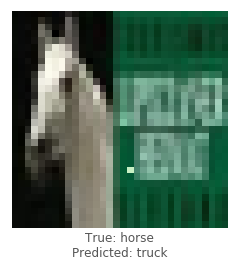

lenet - image 4216 - 181 / 1000


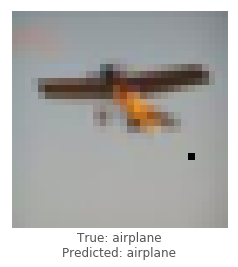

lenet - image 3731 - 182 / 1000


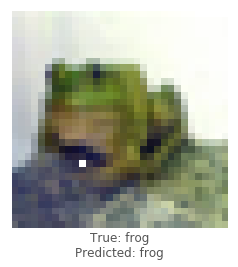

lenet - image 3493 - 183 / 1000


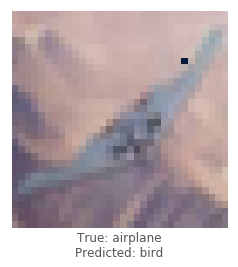

lenet - image 1354 - 184 / 1000


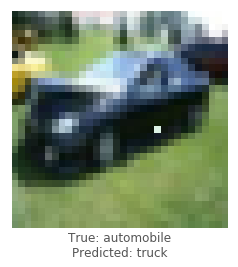

lenet - image 5089 - 185 / 1000


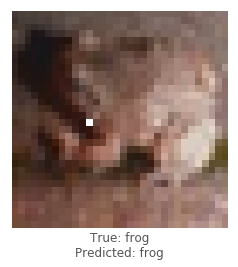

lenet - image 9285 - 186 / 1000


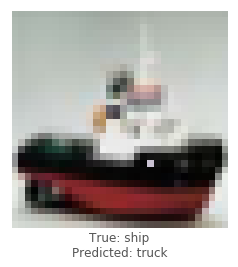

lenet - image 1312 - 187 / 1000


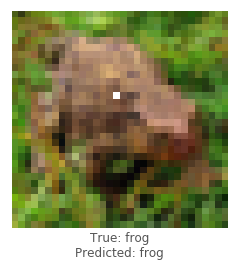

lenet - image 1473 - 188 / 1000


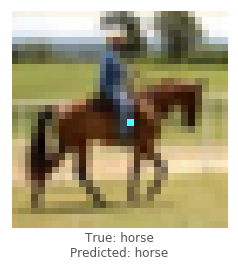

lenet - image 818 - 189 / 1000


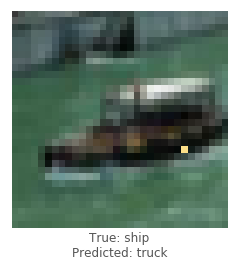

lenet - image 7992 - 190 / 1000


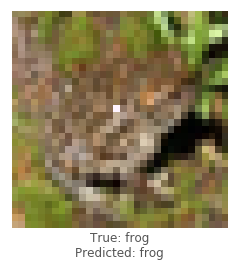

lenet - image 5852 - 191 / 1000


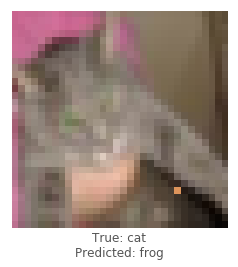

lenet - image 6988 - 192 / 1000


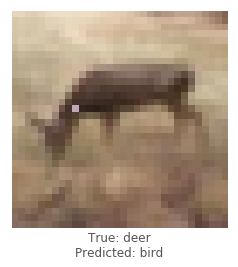

lenet - image 5319 - 193 / 1000


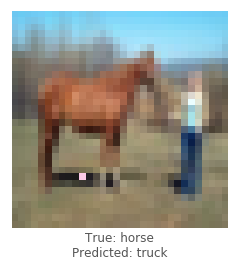

lenet - image 6367 - 194 / 1000


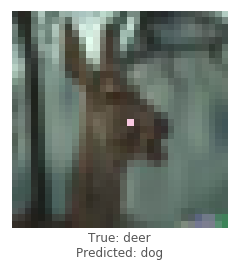

lenet - image 984 - 195 / 1000


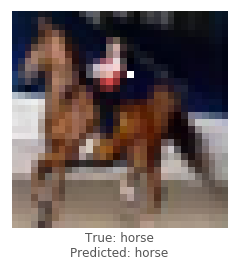

lenet - image 4902 - 196 / 1000


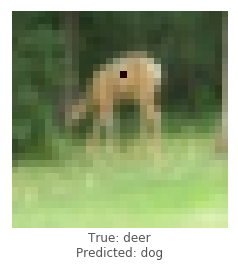

lenet - image 5012 - 197 / 1000


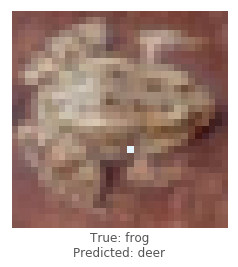

lenet - image 5759 - 198 / 1000


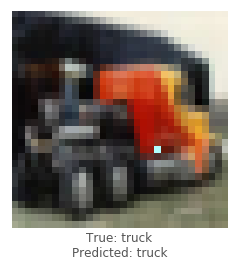

lenet - image 2789 - 199 / 1000


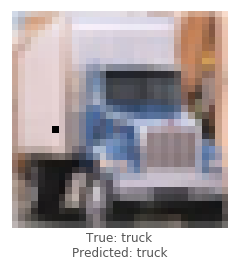

lenet - image 6787 - 200 / 1000


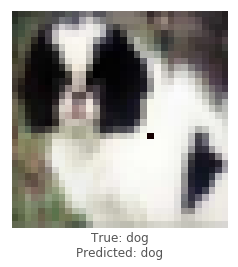

lenet - image 4722 - 201 / 1000


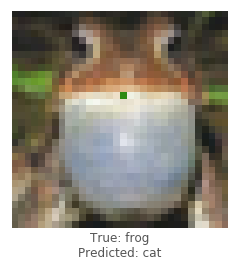

lenet - image 5499 - 202 / 1000


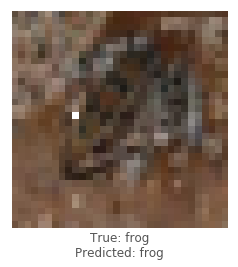

lenet - image 1616 - 203 / 1000


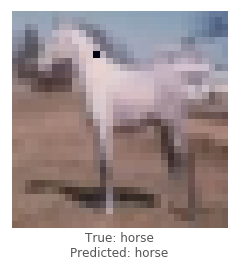

lenet - image 941 - 204 / 1000


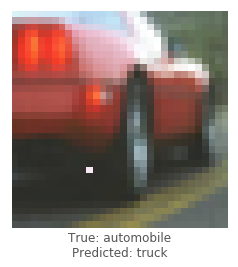

lenet - image 575 - 205 / 1000


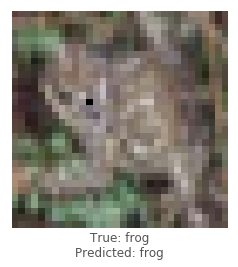

lenet - image 6358 - 206 / 1000


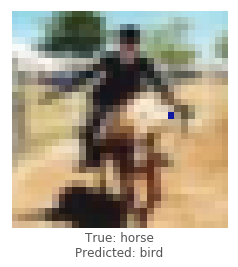

lenet - image 2208 - 207 / 1000


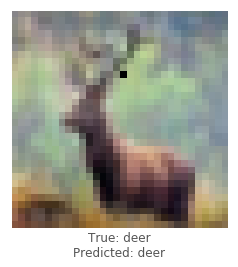

lenet - image 9473 - 208 / 1000


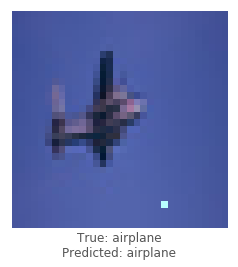

lenet - image 2899 - 209 / 1000


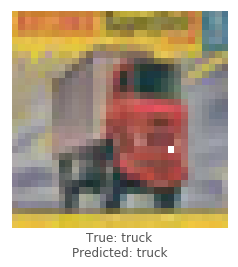

lenet - image 281 - 210 / 1000


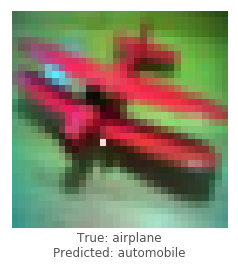

lenet - image 6281 - 211 / 1000


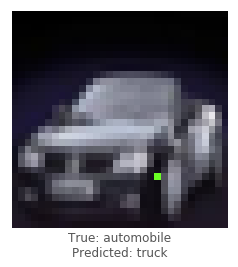

lenet - image 507 - 212 / 1000


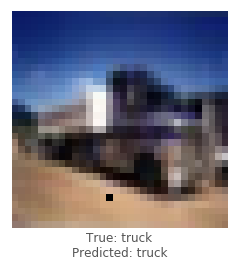

lenet - image 7856 - 213 / 1000


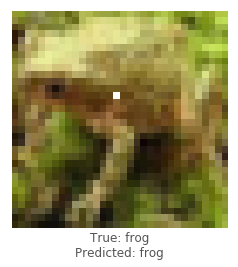

lenet - image 9664 - 214 / 1000


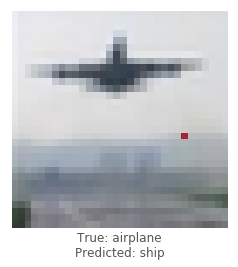

lenet - image 9455 - 215 / 1000


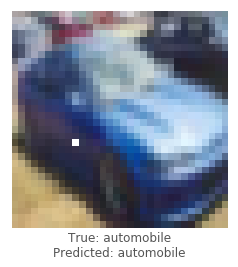

lenet - image 1920 - 216 / 1000


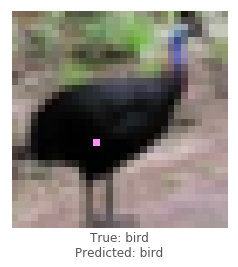

lenet - image 5292 - 217 / 1000


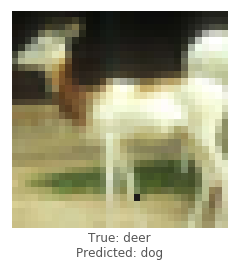

lenet - image 3892 - 218 / 1000


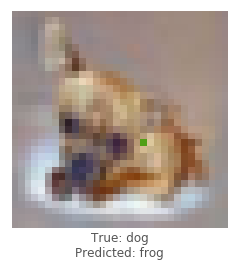

lenet - image 3283 - 219 / 1000


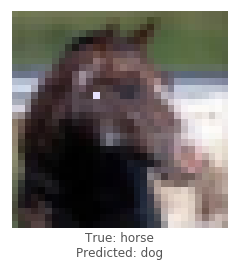

lenet - image 6038 - 220 / 1000


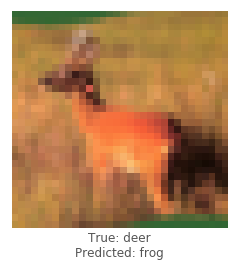

lenet - image 5125 - 221 / 1000


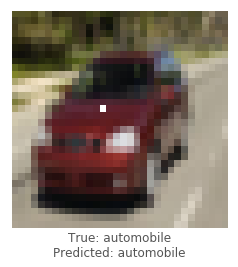

lenet - image 2732 - 222 / 1000


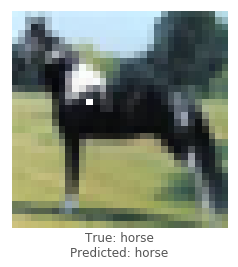

lenet - image 7448 - 223 / 1000


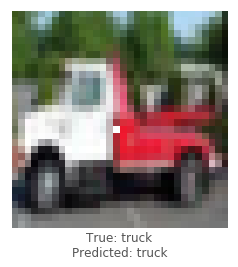

lenet - image 5076 - 224 / 1000


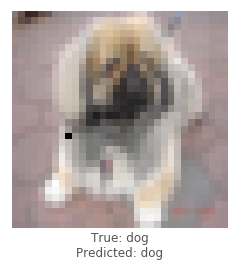

lenet - image 9523 - 225 / 1000


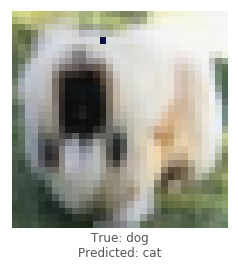

lenet - image 7774 - 226 / 1000


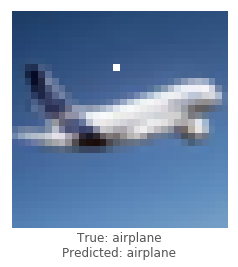

lenet - image 7381 - 227 / 1000


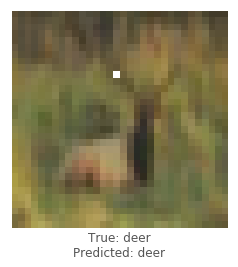

lenet - image 1497 - 228 / 1000


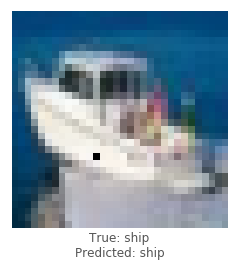

lenet - image 284 - 229 / 1000


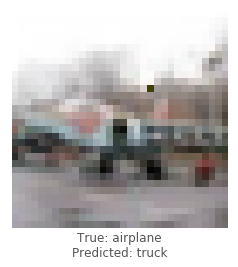

lenet - image 2101 - 230 / 1000


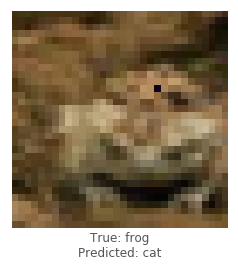

lenet - image 979 - 231 / 1000


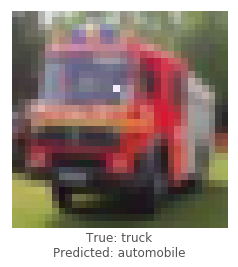

lenet - image 2911 - 232 / 1000


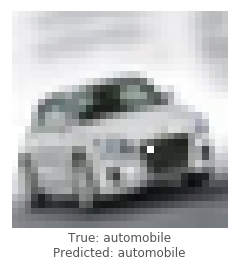

lenet - image 8905 - 233 / 1000


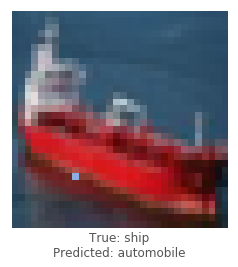

lenet - image 1980 - 234 / 1000


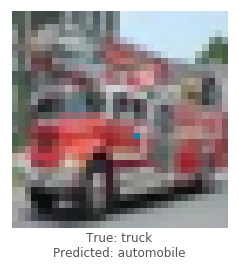

lenet - image 2751 - 235 / 1000


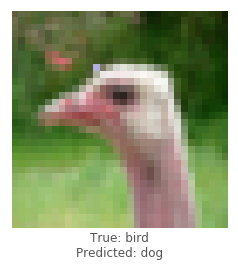

lenet - image 5958 - 236 / 1000


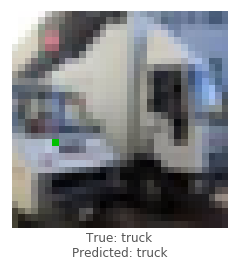

lenet - image 658 - 237 / 1000


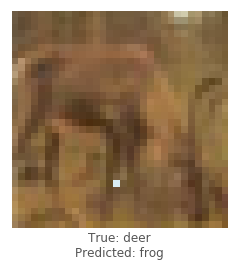

lenet - image 8834 - 238 / 1000


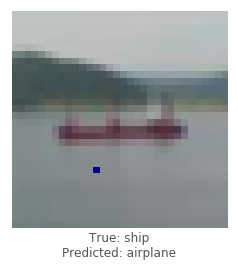

lenet - image 7791 - 239 / 1000


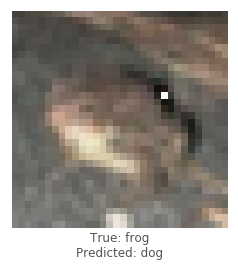

lenet - image 6889 - 240 / 1000


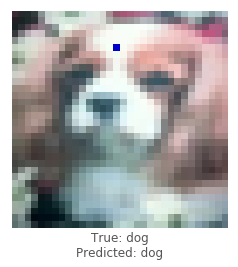

lenet - image 1990 - 241 / 1000


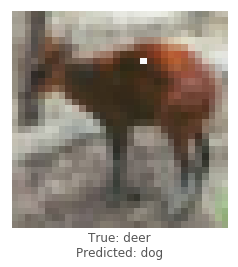

lenet - image 6642 - 242 / 1000


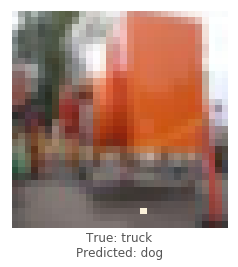

lenet - image 9551 - 243 / 1000


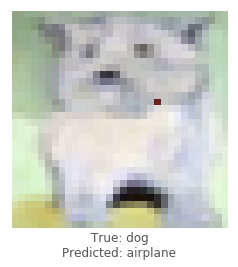

lenet - image 4785 - 244 / 1000


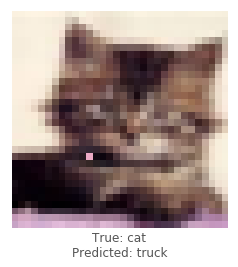

lenet - image 1153 - 245 / 1000


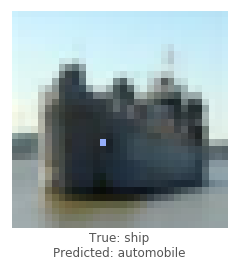

lenet - image 2609 - 246 / 1000


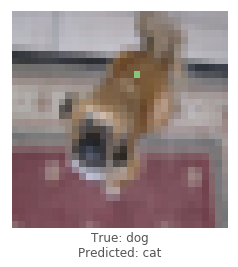

lenet - image 1661 - 247 / 1000


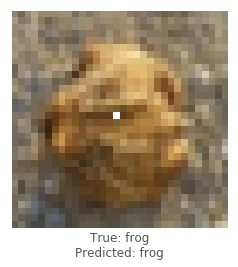

lenet - image 2677 - 248 / 1000


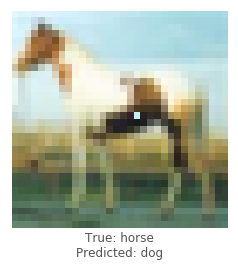

lenet - image 744 - 249 / 1000


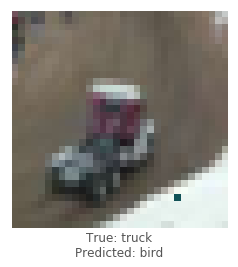

lenet - image 9202 - 250 / 1000


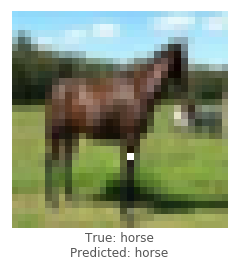

lenet - image 1261 - 251 / 1000


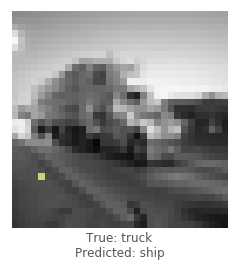

lenet - image 3938 - 252 / 1000


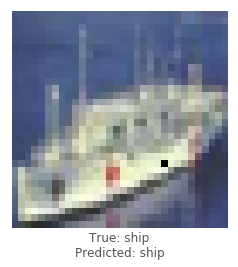

lenet - image 1514 - 253 / 1000


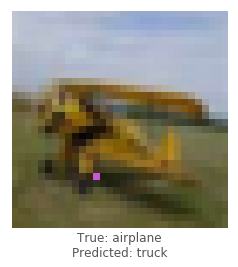

lenet - image 8853 - 254 / 1000


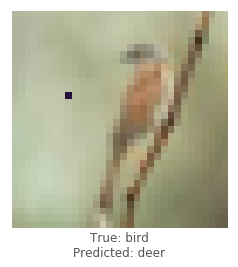

lenet - image 2206 - 255 / 1000


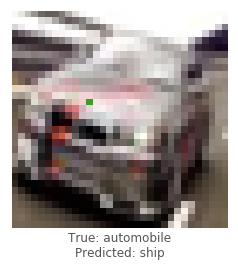

lenet - image 3066 - 256 / 1000


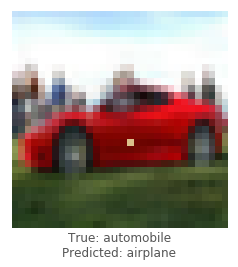

lenet - image 2951 - 257 / 1000


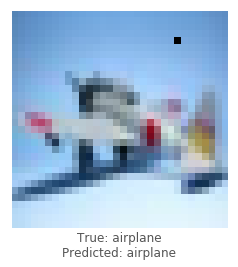

lenet - image 6285 - 258 / 1000


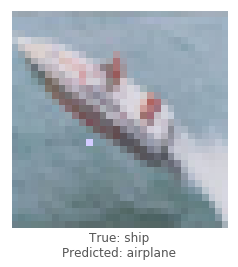

lenet - image 7045 - 259 / 1000


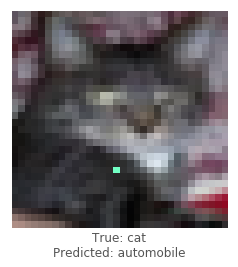

lenet - image 8552 - 260 / 1000


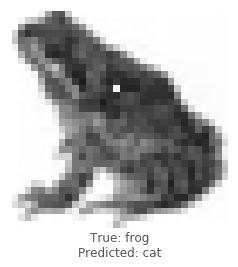

lenet - image 1375 - 261 / 1000


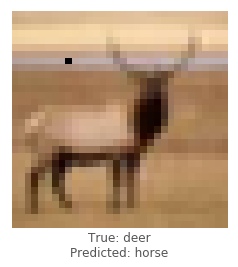

lenet - image 7289 - 262 / 1000


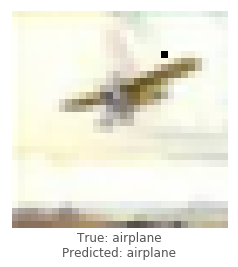

lenet - image 5713 - 263 / 1000


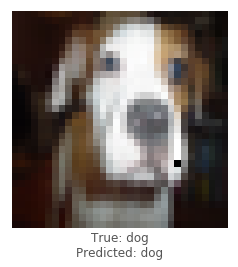

lenet - image 8149 - 264 / 1000


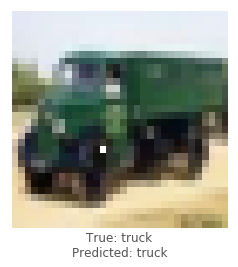

lenet - image 8818 - 265 / 1000


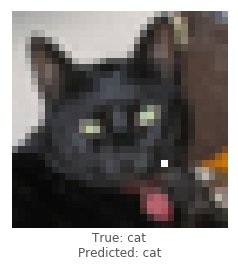

lenet - image 6013 - 266 / 1000


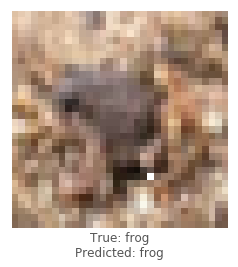

lenet - image 3742 - 267 / 1000


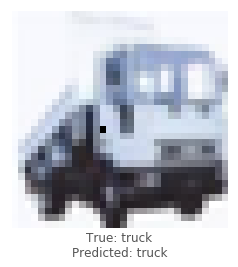

lenet - image 6238 - 268 / 1000


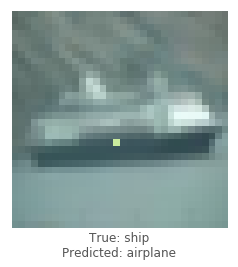

lenet - image 4325 - 269 / 1000


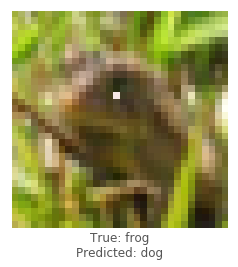

lenet - image 9144 - 270 / 1000


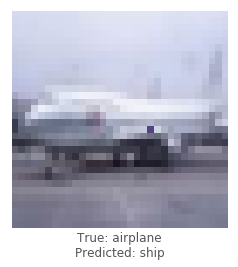

lenet - image 347 - 271 / 1000


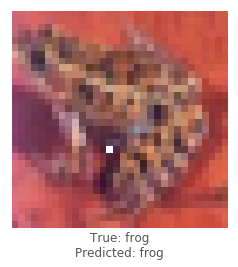

lenet - image 402 - 272 / 1000


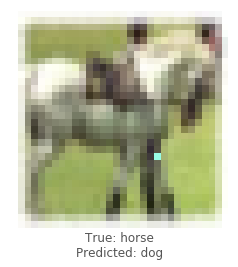

lenet - image 4789 - 273 / 1000


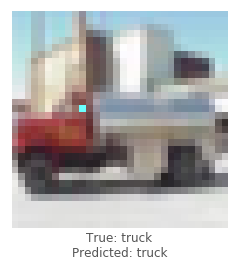

lenet - image 86 - 274 / 1000


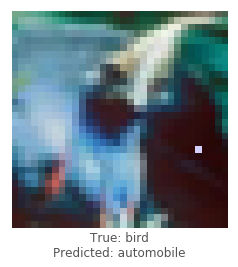

lenet - image 1903 - 275 / 1000


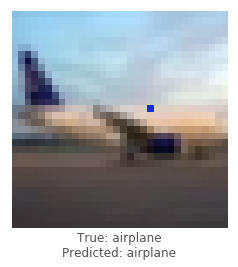

lenet - image 759 - 276 / 1000


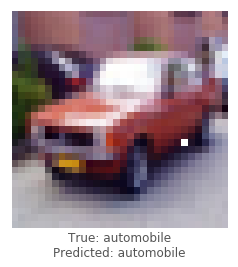

lenet - image 79 - 277 / 1000


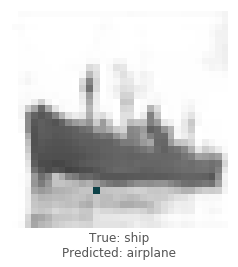

lenet - image 1314 - 278 / 1000


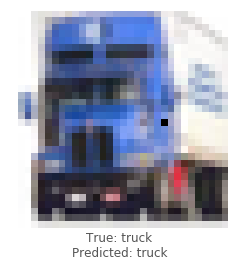

lenet - image 749 - 279 / 1000


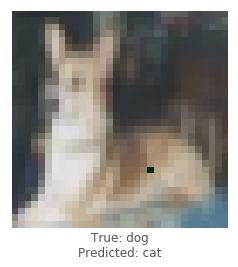

lenet - image 8890 - 280 / 1000


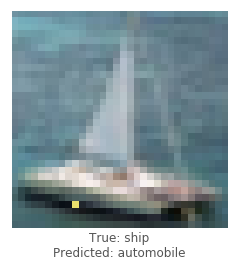

lenet - image 7251 - 281 / 1000


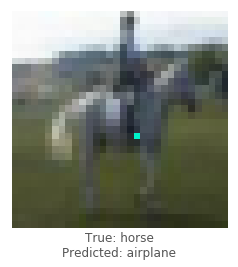

lenet - image 6541 - 282 / 1000


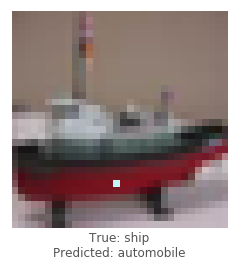

lenet - image 5720 - 283 / 1000


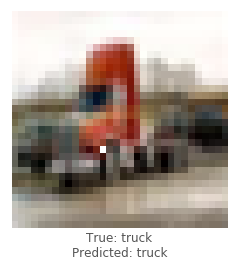

lenet - image 4257 - 284 / 1000


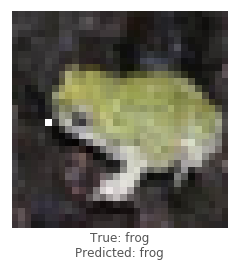

lenet - image 361 - 285 / 1000


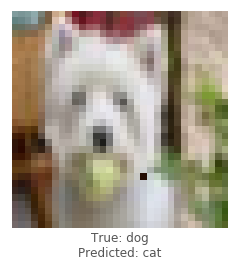

lenet - image 9306 - 286 / 1000


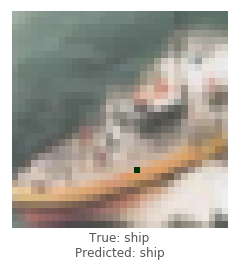

lenet - image 5566 - 287 / 1000


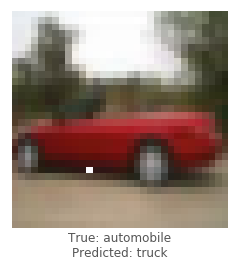

lenet - image 9396 - 288 / 1000


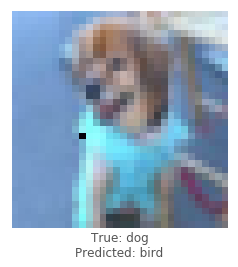

lenet - image 2920 - 289 / 1000


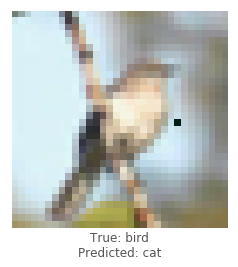

lenet - image 7362 - 290 / 1000


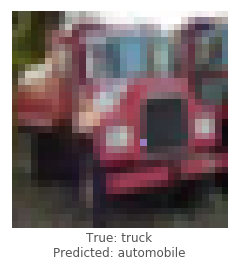

lenet - image 9078 - 291 / 1000


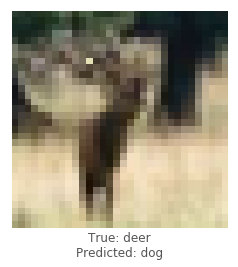

lenet - image 390 - 292 / 1000


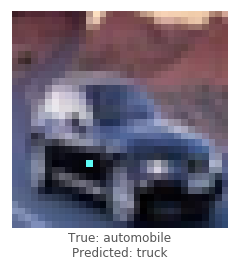

lenet - image 9672 - 293 / 1000


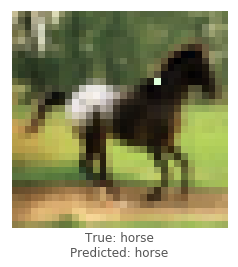

lenet - image 3337 - 294 / 1000


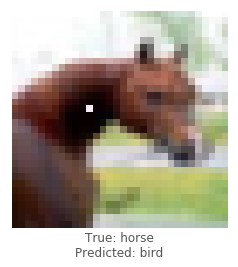

lenet - image 996 - 295 / 1000


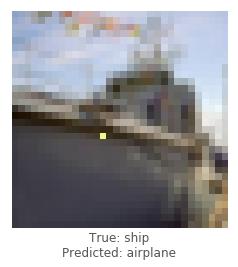

lenet - image 3047 - 296 / 1000


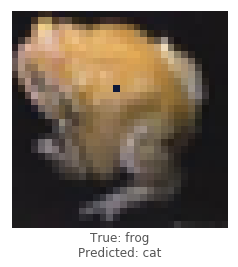

lenet - image 1928 - 297 / 1000


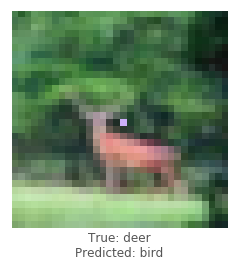

lenet - image 7432 - 298 / 1000


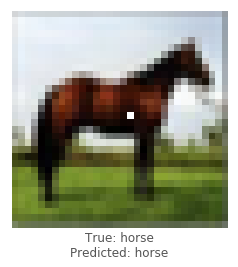

lenet - image 762 - 299 / 1000


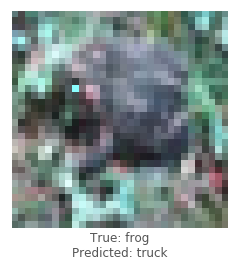

lenet - image 9560 - 300 / 1000


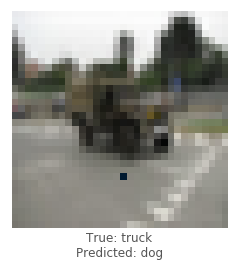

lenet - image 7752 - 301 / 1000


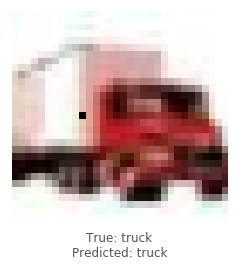

lenet - image 798 - 302 / 1000


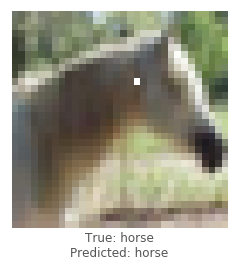

lenet - image 4075 - 303 / 1000


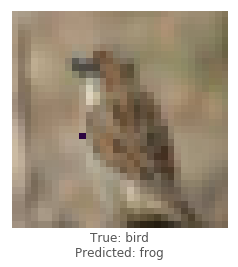

lenet - image 502 - 304 / 1000


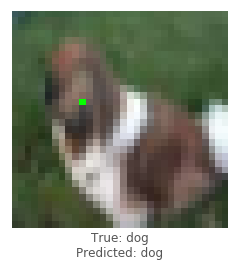

lenet - image 3551 - 305 / 1000


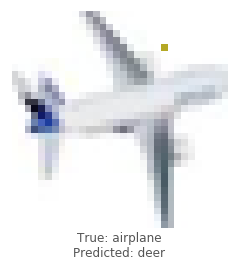

lenet - image 8608 - 306 / 1000


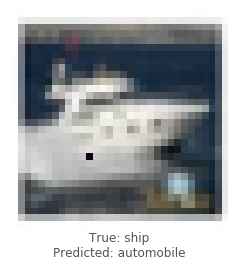

lenet - image 7936 - 307 / 1000


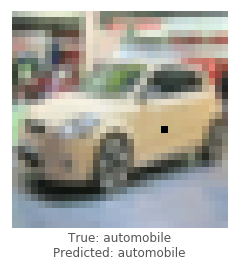

lenet - image 2658 - 308 / 1000


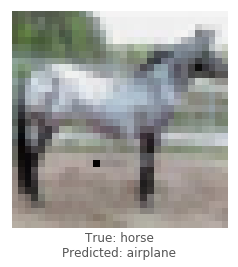

lenet - image 2861 - 309 / 1000


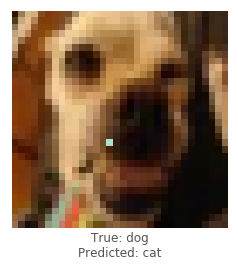

lenet - image 1534 - 310 / 1000


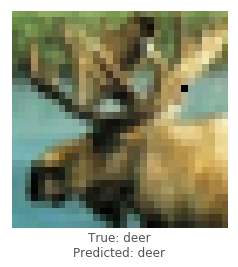

lenet - image 636 - 311 / 1000


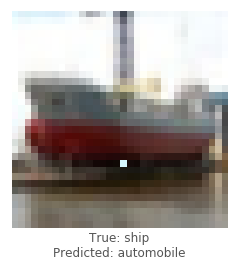

lenet - image 3507 - 312 / 1000


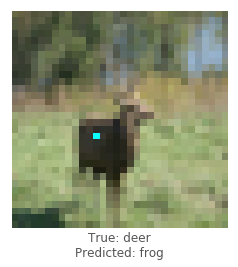

lenet - image 1243 - 313 / 1000


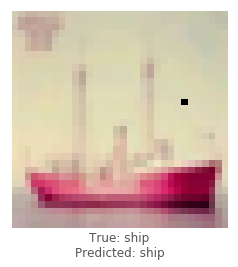

lenet - image 1643 - 314 / 1000


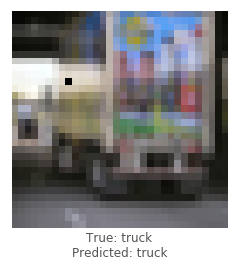

lenet - image 559 - 315 / 1000


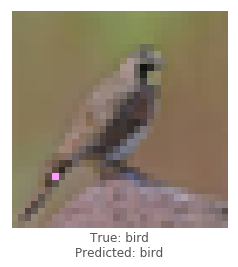

lenet - image 8312 - 316 / 1000


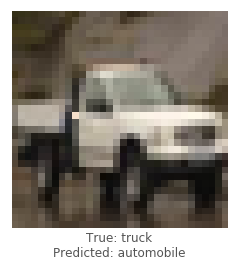

lenet - image 6342 - 317 / 1000


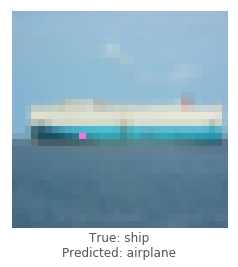

lenet - image 345 - 318 / 1000


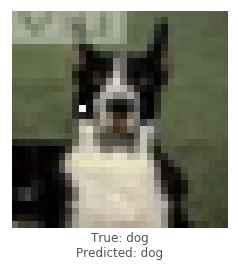

lenet - image 2160 - 319 / 1000


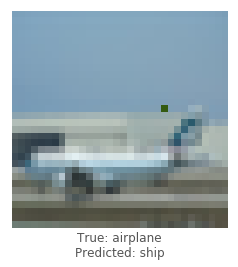

lenet - image 6034 - 320 / 1000


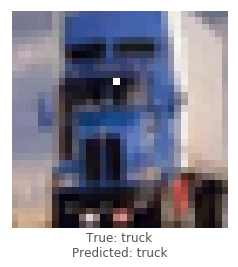

lenet - image 3214 - 321 / 1000


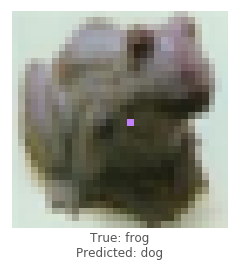

lenet - image 5415 - 322 / 1000


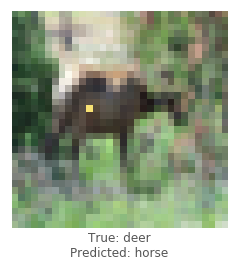

lenet - image 906 - 323 / 1000


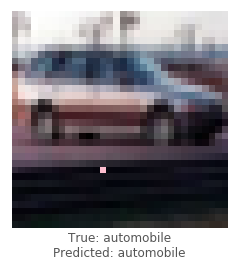

lenet - image 3857 - 324 / 1000


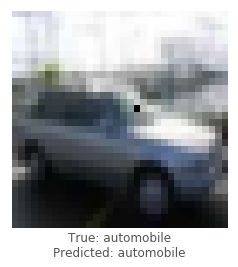

lenet - image 8590 - 325 / 1000


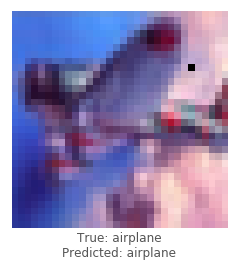

lenet - image 1217 - 326 / 1000


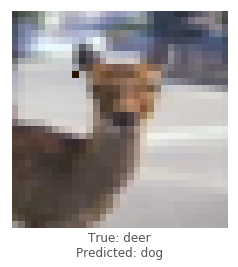

lenet - image 6432 - 327 / 1000


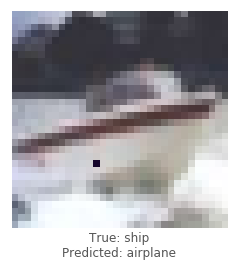

lenet - image 8173 - 328 / 1000


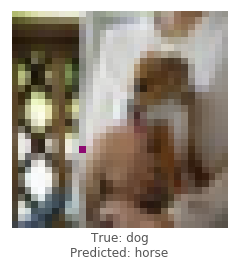

lenet - image 2106 - 329 / 1000


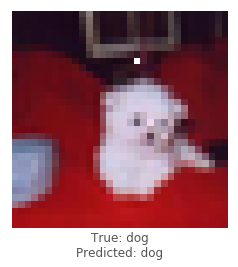

lenet - image 8973 - 330 / 1000


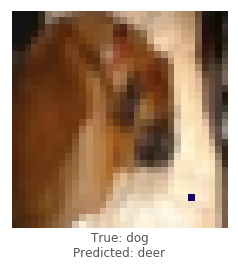

lenet - image 2919 - 331 / 1000


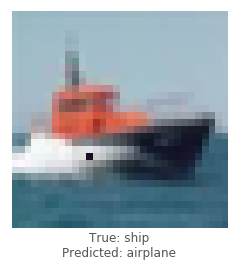

lenet - image 7921 - 332 / 1000


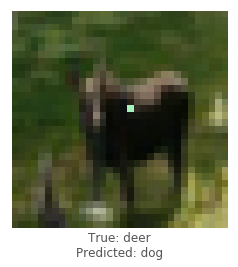

lenet - image 176 - 333 / 1000


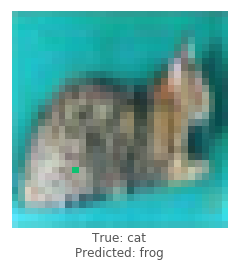

lenet - image 8824 - 334 / 1000


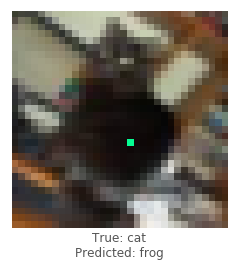

lenet - image 67 - 335 / 1000


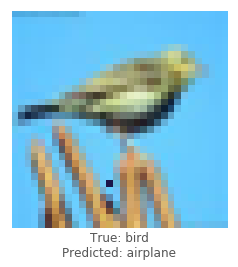

lenet - image 610 - 336 / 1000


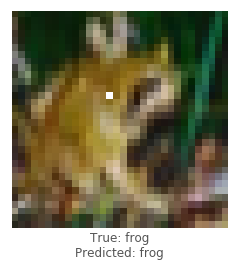

lenet - image 6250 - 337 / 1000


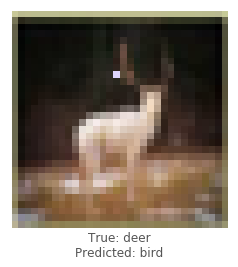

lenet - image 871 - 338 / 1000


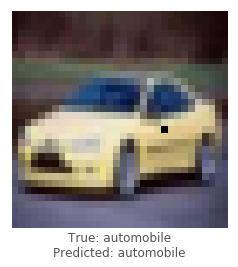

lenet - image 2519 - 339 / 1000


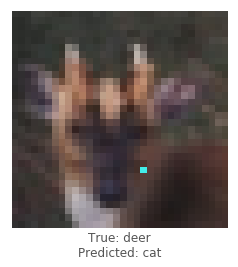

lenet - image 9018 - 340 / 1000


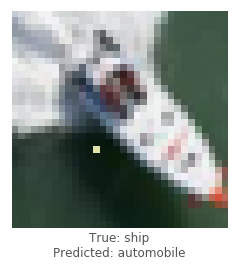

lenet - image 9580 - 341 / 1000


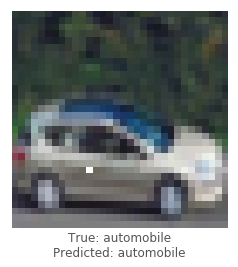

lenet - image 1829 - 342 / 1000


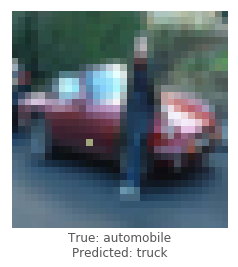

lenet - image 4617 - 343 / 1000


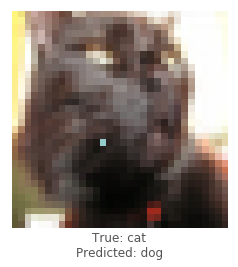

lenet - image 816 - 344 / 1000


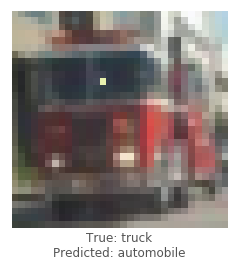

lenet - image 3490 - 345 / 1000


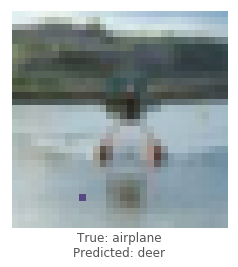

lenet - image 9962 - 346 / 1000


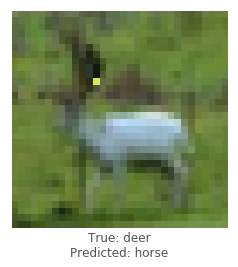

lenet - image 6583 - 347 / 1000


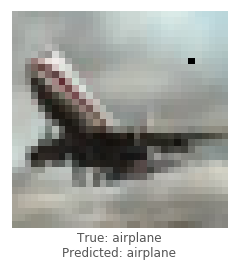

lenet - image 2882 - 348 / 1000


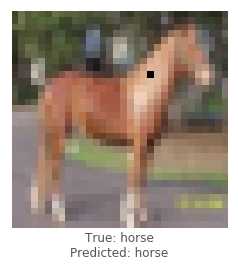

lenet - image 7375 - 349 / 1000


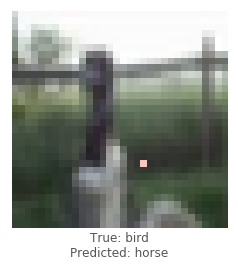

lenet - image 6411 - 350 / 1000


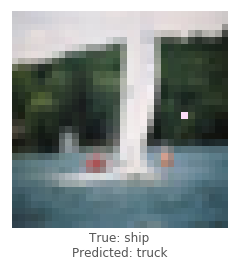

lenet - image 593 - 351 / 1000


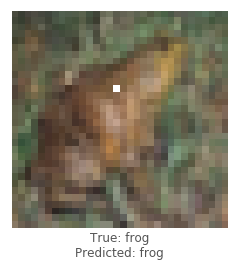

lenet - image 8316 - 352 / 1000


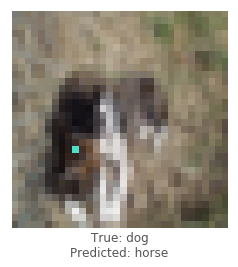

lenet - image 4598 - 353 / 1000


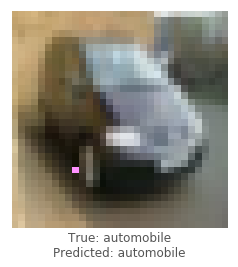

lenet - image 7718 - 354 / 1000


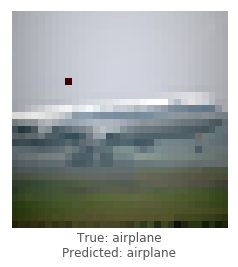

lenet - image 1018 - 355 / 1000


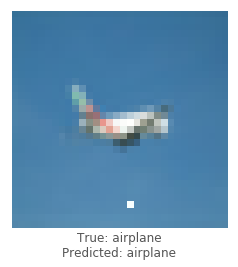

lenet - image 8977 - 356 / 1000


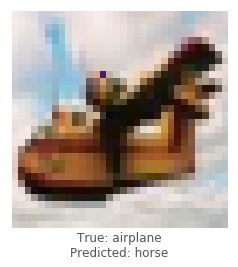

lenet - image 1843 - 357 / 1000


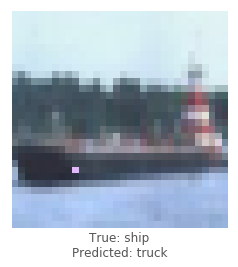

lenet - image 8870 - 358 / 1000


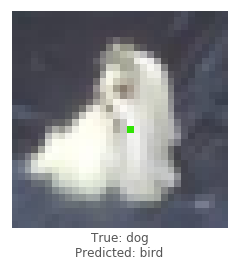

lenet - image 1169 - 359 / 1000


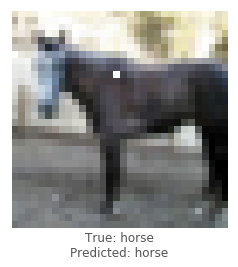

lenet - image 4658 - 360 / 1000


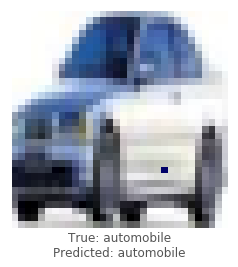

lenet - image 4742 - 361 / 1000


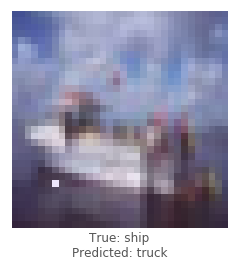

lenet - image 4624 - 362 / 1000


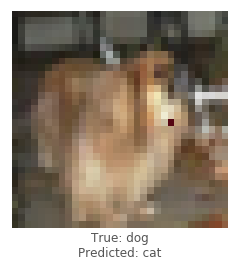

lenet - image 6149 - 363 / 1000


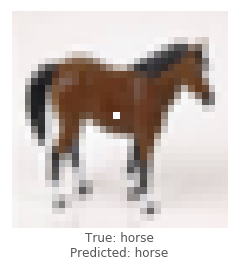

lenet - image 4702 - 364 / 1000


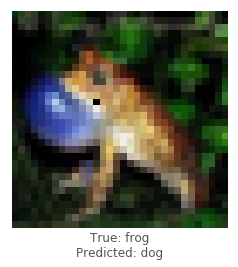

lenet - image 226 - 365 / 1000


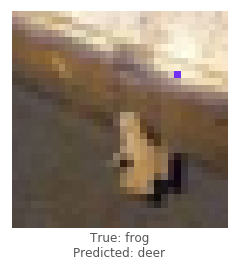

lenet - image 4695 - 366 / 1000


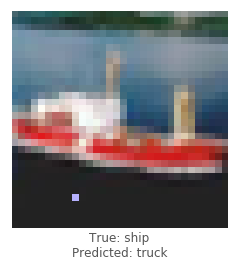

lenet - image 1904 - 367 / 1000


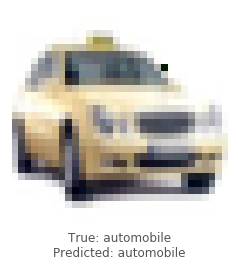

lenet - image 1464 - 368 / 1000


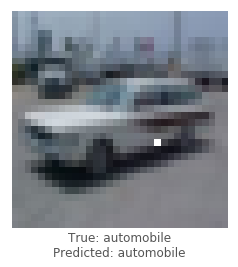

lenet - image 3307 - 369 / 1000


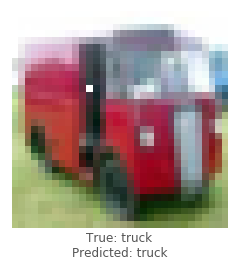

lenet - image 5236 - 370 / 1000


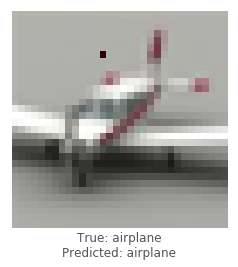

lenet - image 9517 - 371 / 1000


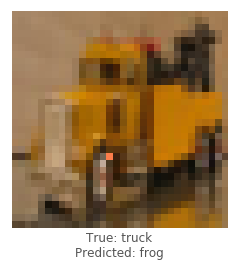

lenet - image 2451 - 372 / 1000


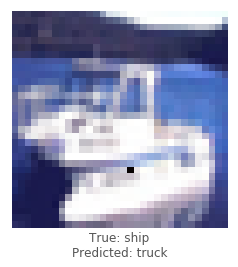

lenet - image 6179 - 373 / 1000


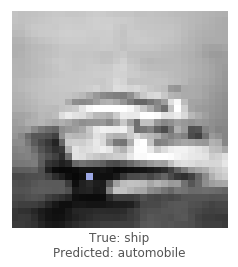

lenet - image 7344 - 374 / 1000


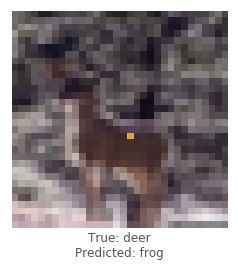

lenet - image 5707 - 375 / 1000


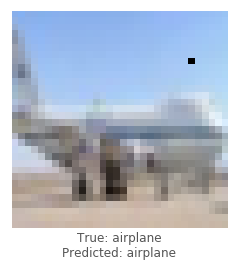

lenet - image 7459 - 376 / 1000


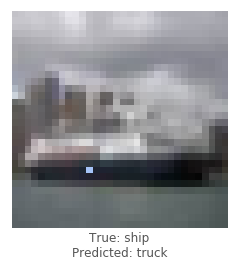

lenet - image 9927 - 377 / 1000


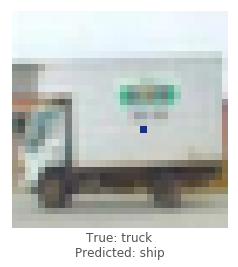

lenet - image 2874 - 378 / 1000


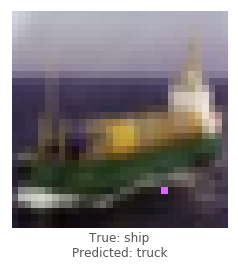

lenet - image 119 - 379 / 1000


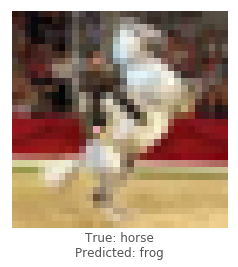

lenet - image 3832 - 380 / 1000


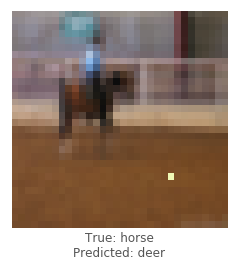

lenet - image 7256 - 381 / 1000


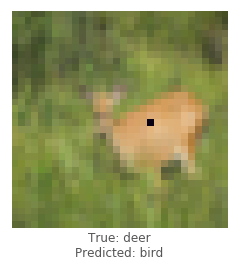

lenet - image 8944 - 382 / 1000


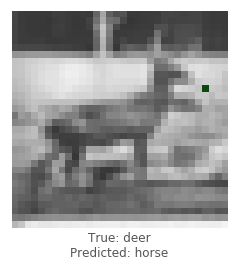

lenet - image 4313 - 383 / 1000


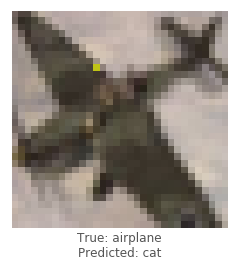

lenet - image 7100 - 384 / 1000


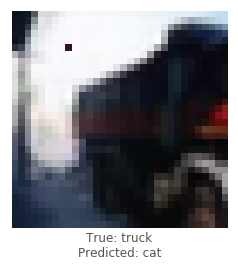

lenet - image 7363 - 385 / 1000


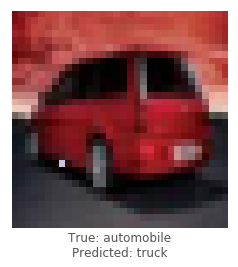

lenet - image 9153 - 386 / 1000


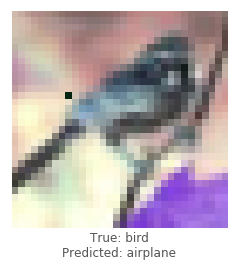

lenet - image 1976 - 387 / 1000


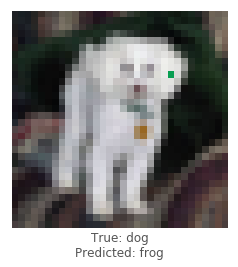

lenet - image 4535 - 388 / 1000


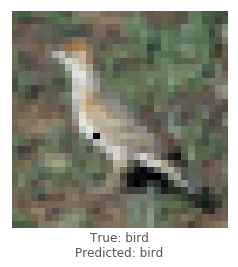

lenet - image 4255 - 389 / 1000


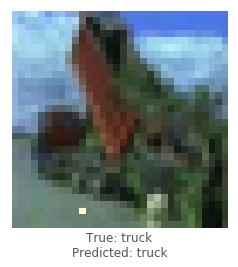

lenet - image 5819 - 390 / 1000


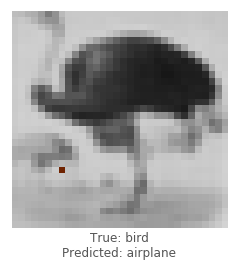

lenet - image 7591 - 391 / 1000


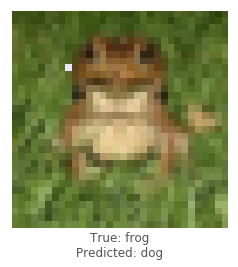

lenet - image 8314 - 392 / 1000


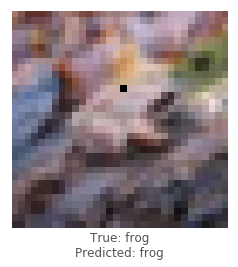

lenet - image 2008 - 393 / 1000


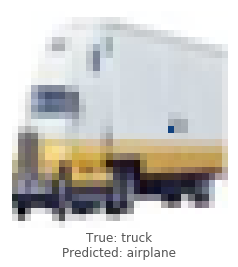

lenet - image 9952 - 394 / 1000


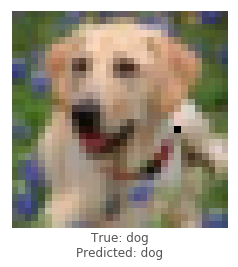

lenet - image 141 - 395 / 1000


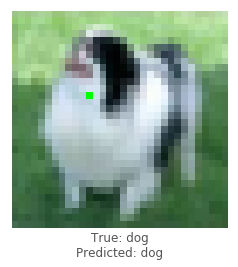

lenet - image 7 - 396 / 1000


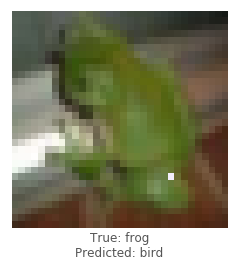

lenet - image 822 - 397 / 1000


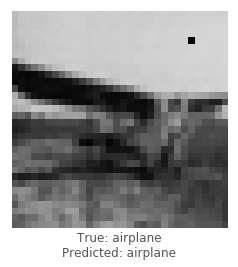

lenet - image 9756 - 398 / 1000


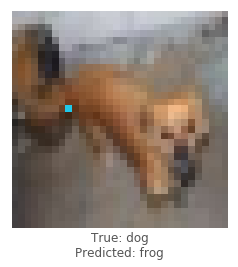

lenet - image 6948 - 399 / 1000


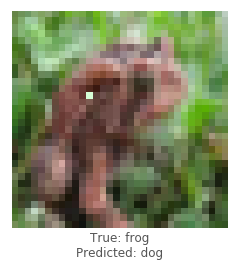

lenet - image 9071 - 400 / 1000


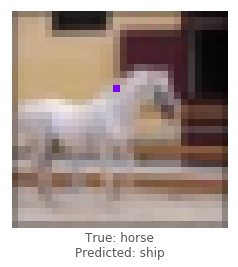

lenet - image 5583 - 401 / 1000


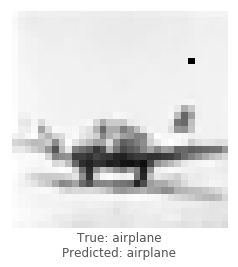

lenet - image 9157 - 402 / 1000


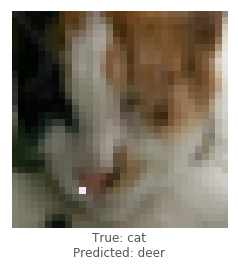

lenet - image 2771 - 403 / 1000


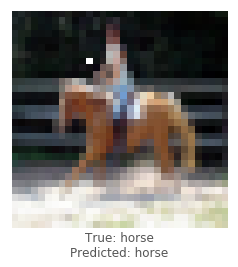

lenet - image 7425 - 404 / 1000


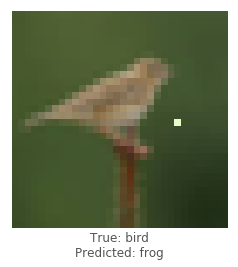

lenet - image 3881 - 405 / 1000


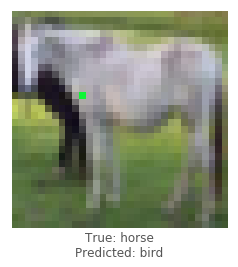

lenet - image 5219 - 406 / 1000


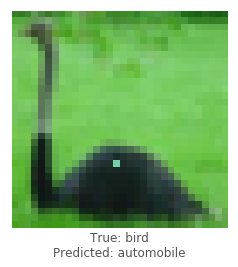

lenet - image 3111 - 407 / 1000


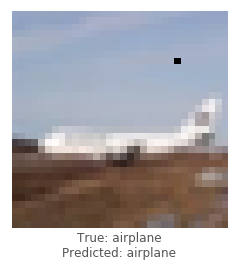

lenet - image 1447 - 408 / 1000


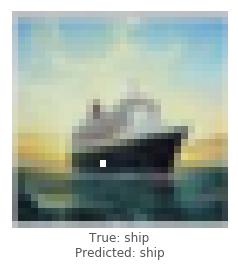

lenet - image 7814 - 409 / 1000


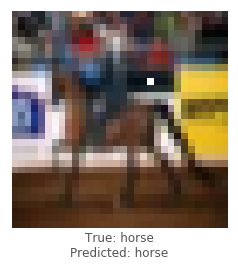

lenet - image 8369 - 410 / 1000


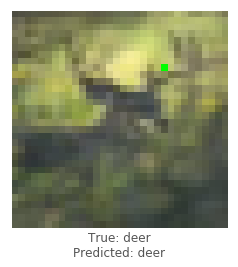

lenet - image 8208 - 411 / 1000


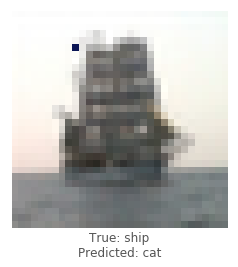

lenet - image 999 - 412 / 1000


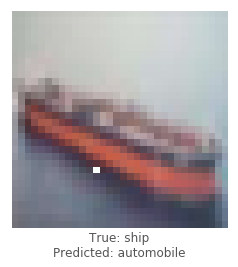

lenet - image 4206 - 413 / 1000


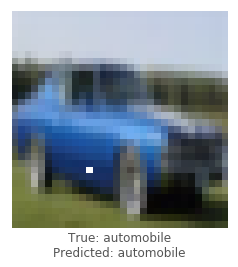

lenet - image 9957 - 414 / 1000


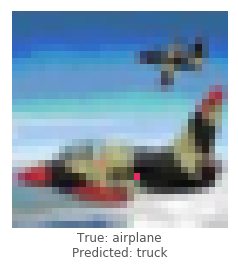

lenet - image 5879 - 415 / 1000


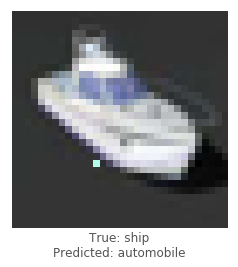

lenet - image 8984 - 416 / 1000


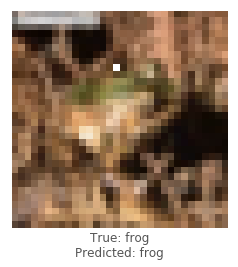

lenet - image 8801 - 417 / 1000


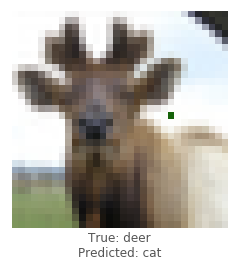

lenet - image 5346 - 418 / 1000


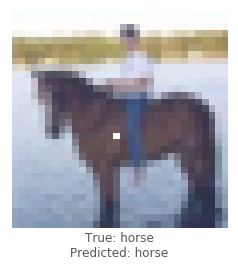

lenet - image 4022 - 419 / 1000


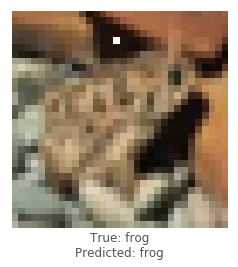

lenet - image 1524 - 420 / 1000


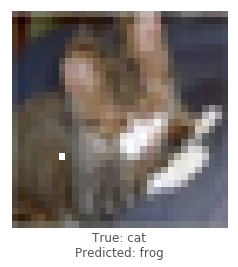

lenet - image 4666 - 421 / 1000


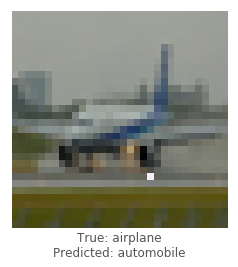

lenet - image 7787 - 422 / 1000


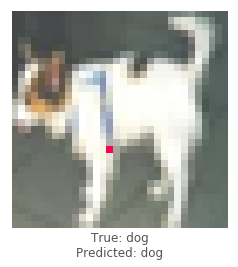

lenet - image 1383 - 423 / 1000


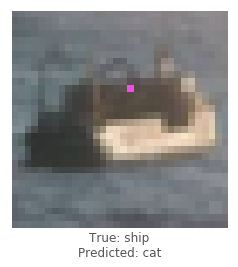

lenet - image 6246 - 424 / 1000


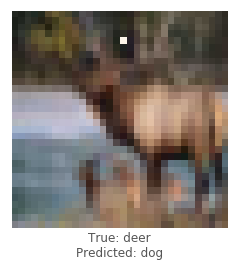

lenet - image 8909 - 425 / 1000


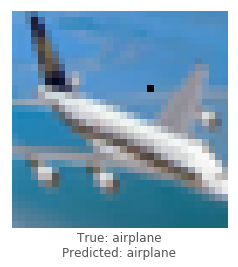

lenet - image 314 - 426 / 1000


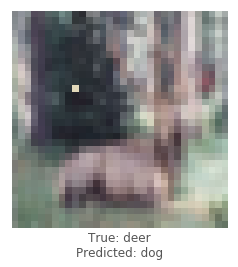

lenet - image 5427 - 427 / 1000


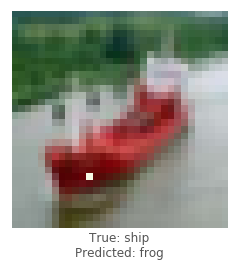

lenet - image 3984 - 428 / 1000


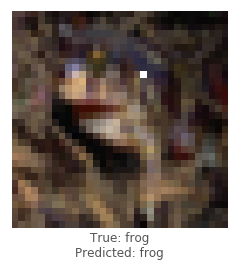

lenet - image 2196 - 429 / 1000


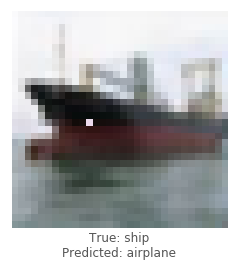

lenet - image 5159 - 430 / 1000


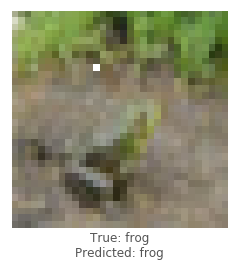

lenet - image 142 - 431 / 1000


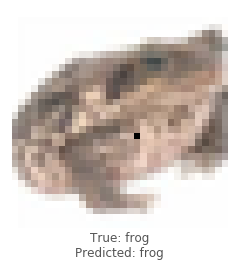

lenet - image 6630 - 432 / 1000


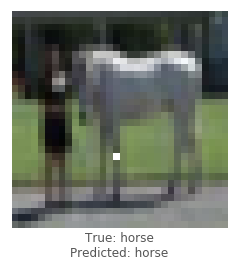

lenet - image 7950 - 433 / 1000


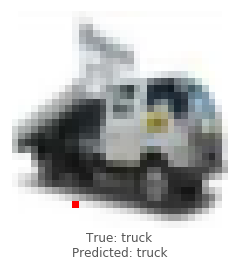

lenet - image 5249 - 434 / 1000


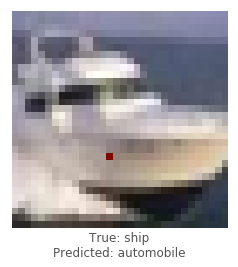

lenet - image 7788 - 435 / 1000


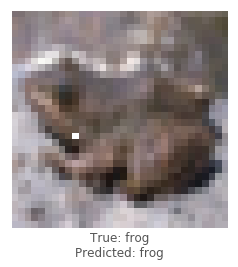

lenet - image 6334 - 436 / 1000


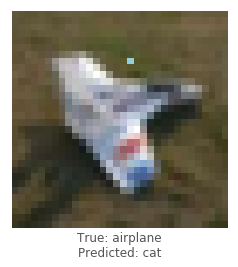

lenet - image 4086 - 437 / 1000


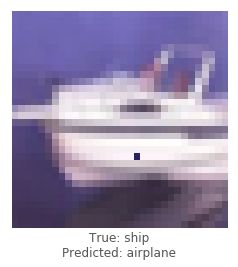

lenet - image 3298 - 438 / 1000


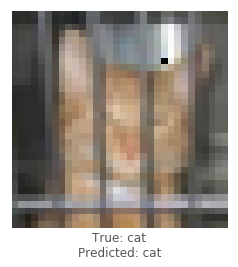

lenet - image 180 - 439 / 1000


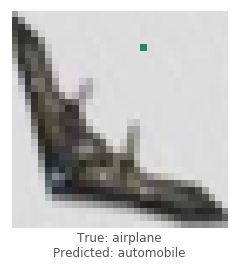

lenet - image 5546 - 440 / 1000


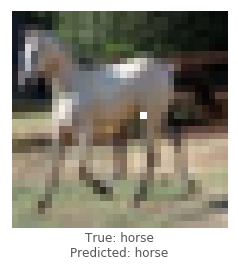

lenet - image 6091 - 441 / 1000


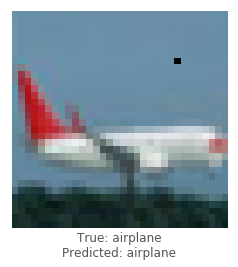

lenet - image 2901 - 442 / 1000


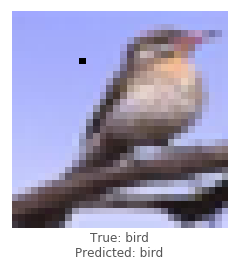

lenet - image 8645 - 443 / 1000


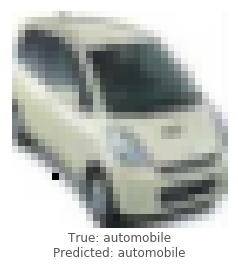

lenet - image 2035 - 444 / 1000


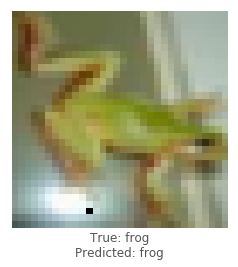

lenet - image 9441 - 445 / 1000


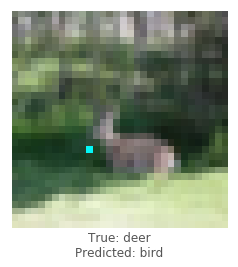

lenet - image 243 - 446 / 1000


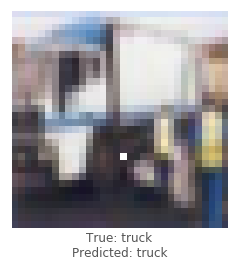

lenet - image 2369 - 447 / 1000


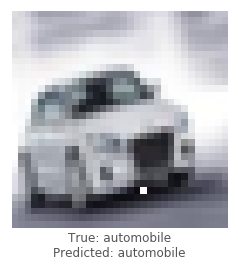

lenet - image 2638 - 448 / 1000


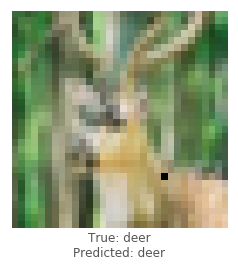

lenet - image 6373 - 449 / 1000


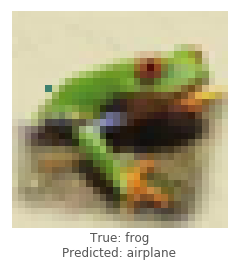

lenet - image 7776 - 450 / 1000


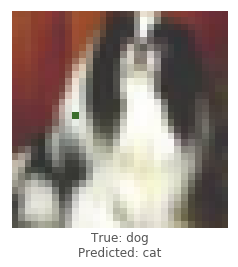

lenet - image 5106 - 451 / 1000


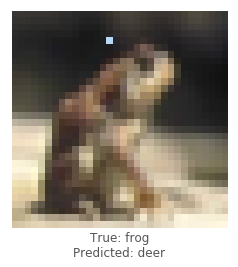

lenet - image 448 - 452 / 1000


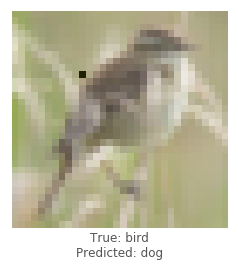

lenet - image 9788 - 453 / 1000


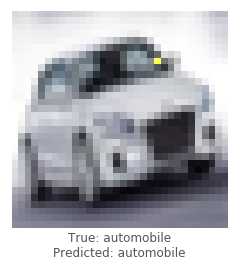

lenet - image 8154 - 454 / 1000


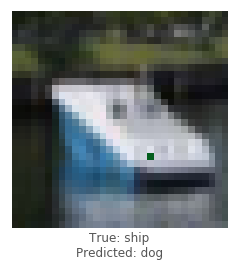

lenet - image 4961 - 455 / 1000


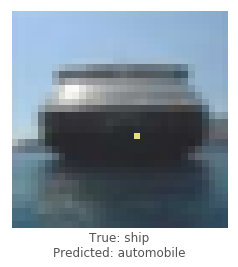

lenet - image 8098 - 456 / 1000


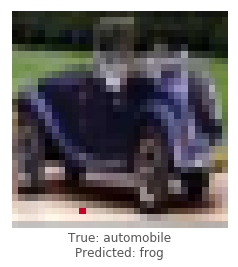

lenet - image 6499 - 457 / 1000


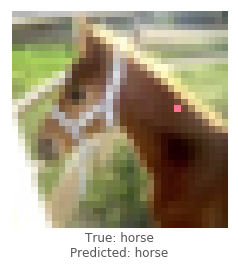

lenet - image 4345 - 458 / 1000


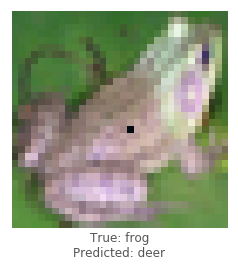

lenet - image 679 - 459 / 1000


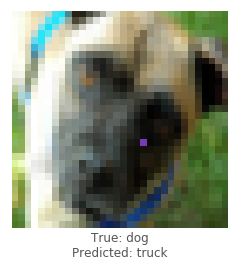

lenet - image 865 - 460 / 1000


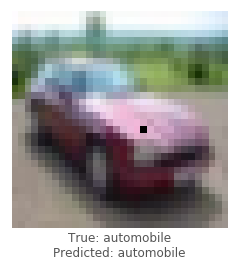

lenet - image 8603 - 461 / 1000


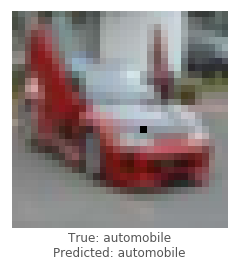

lenet - image 9710 - 462 / 1000


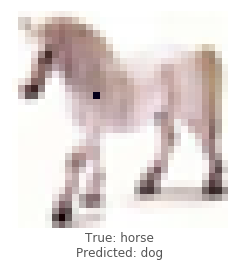

lenet - image 5182 - 463 / 1000


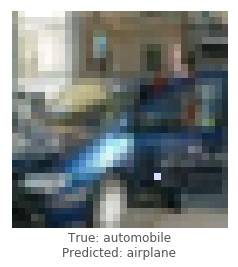

lenet - image 4716 - 464 / 1000


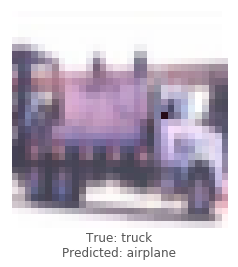

lenet - image 2935 - 465 / 1000


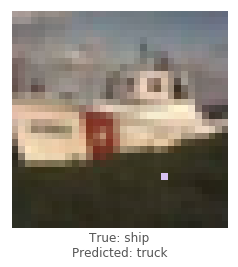

lenet - image 4078 - 466 / 1000


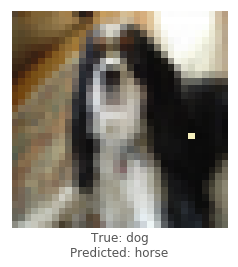

lenet - image 7351 - 467 / 1000


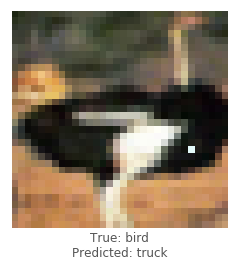

lenet - image 9115 - 468 / 1000


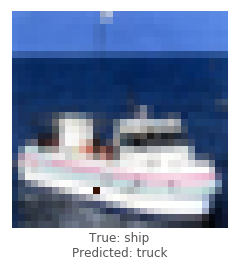

lenet - image 7730 - 469 / 1000


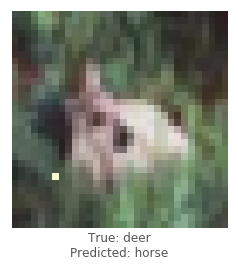

lenet - image 5860 - 470 / 1000


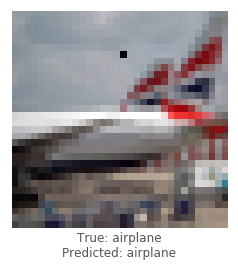

lenet - image 6635 - 471 / 1000


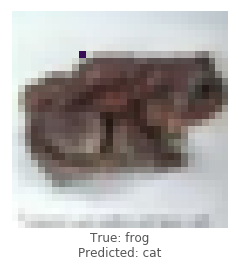

lenet - image 9015 - 472 / 1000


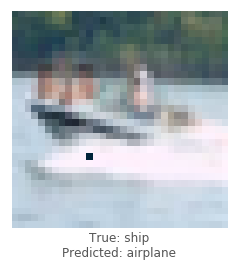

lenet - image 7717 - 473 / 1000


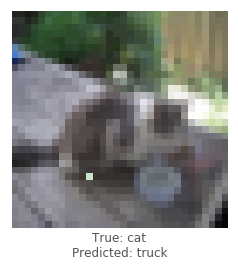

lenet - image 6173 - 474 / 1000


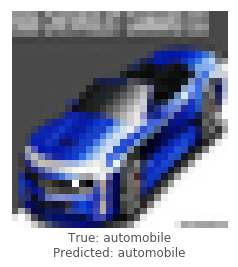

lenet - image 2696 - 475 / 1000


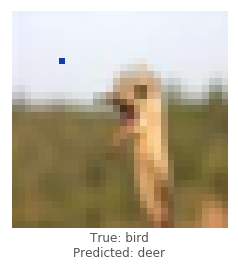

lenet - image 9055 - 476 / 1000


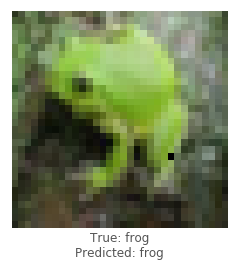

lenet - image 8194 - 477 / 1000


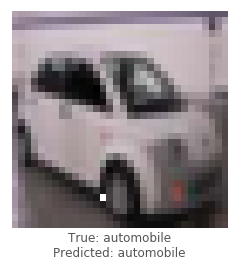

lenet - image 9577 - 478 / 1000


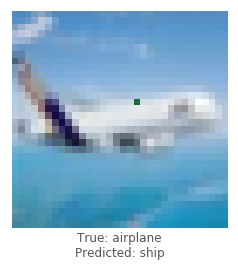

lenet - image 8421 - 479 / 1000


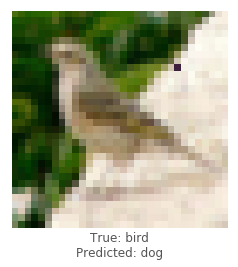

lenet - image 123 - 480 / 1000


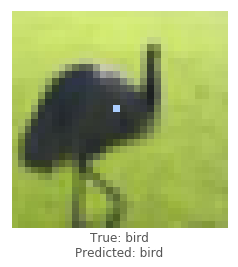

lenet - image 5455 - 481 / 1000


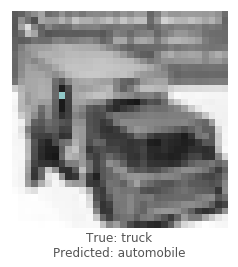

lenet - image 9975 - 482 / 1000


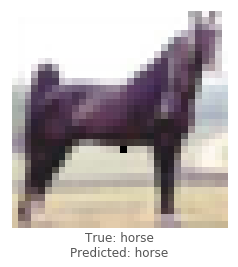

lenet - image 1925 - 483 / 1000


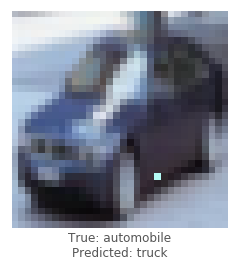

lenet - image 2947 - 484 / 1000


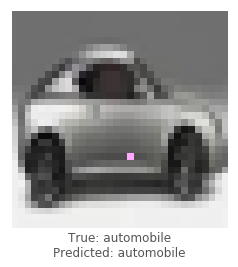

lenet - image 7291 - 485 / 1000


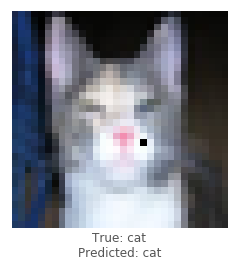

lenet - image 7869 - 486 / 1000


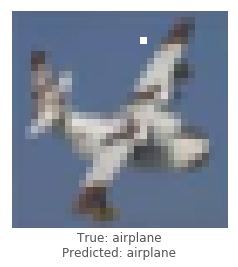

lenet - image 8383 - 487 / 1000


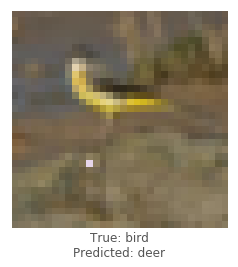

lenet - image 4079 - 488 / 1000


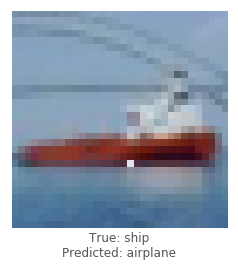

lenet - image 991 - 489 / 1000


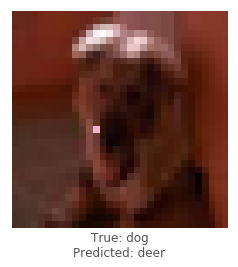

lenet - image 6087 - 490 / 1000


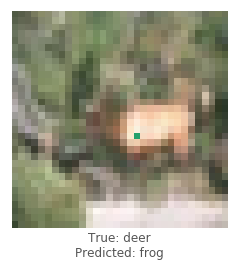

lenet - image 5462 - 491 / 1000


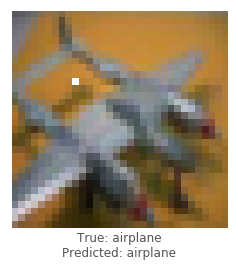

lenet - image 9753 - 492 / 1000


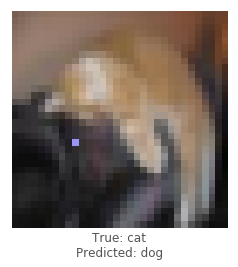

lenet - image 4937 - 493 / 1000


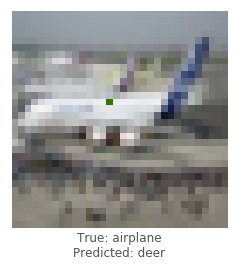

lenet - image 698 - 494 / 1000


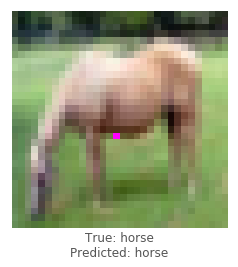

lenet - image 8395 - 495 / 1000


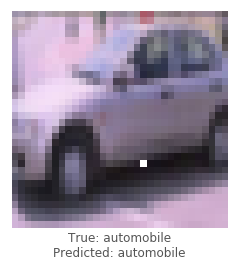

lenet - image 60 - 496 / 1000


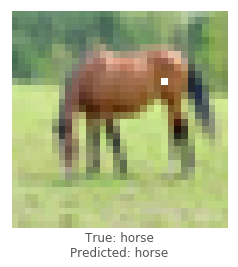

lenet - image 6949 - 497 / 1000


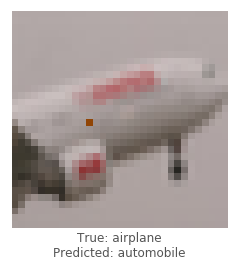

lenet - image 7110 - 498 / 1000


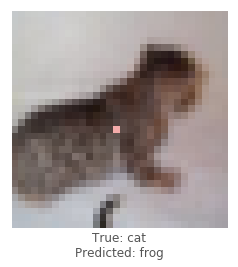

lenet - image 5929 - 499 / 1000


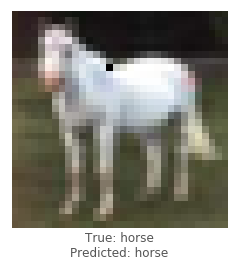

lenet - image 2904 - 500 / 1000


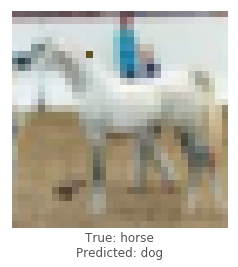

lenet - image 209 - 501 / 1000


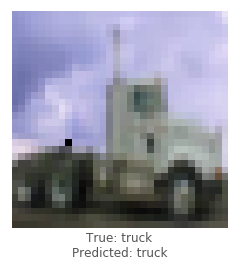

lenet - image 8998 - 502 / 1000


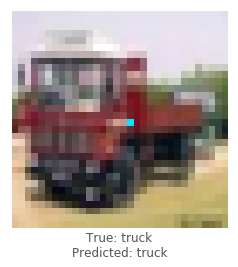

lenet - image 4192 - 503 / 1000


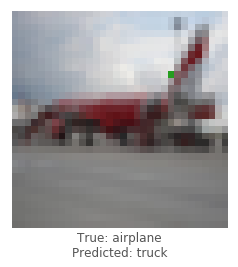

lenet - image 5622 - 504 / 1000


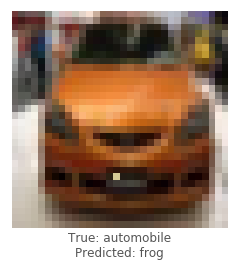

lenet - image 6186 - 505 / 1000


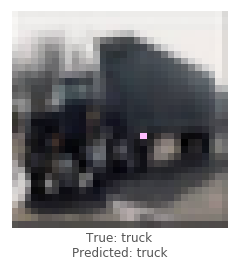

lenet - image 2921 - 506 / 1000


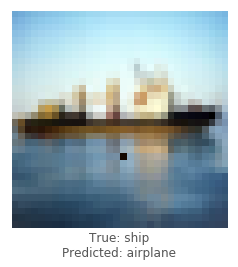

lenet - image 2311 - 507 / 1000


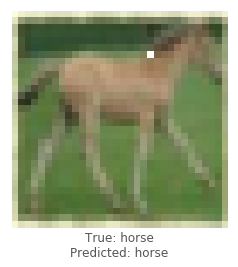

lenet - image 5875 - 508 / 1000


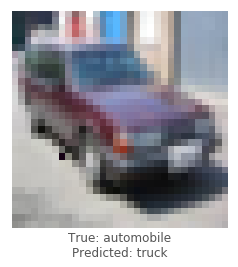

lenet - image 3362 - 509 / 1000


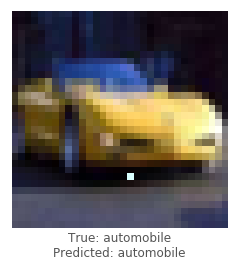

lenet - image 1317 - 510 / 1000


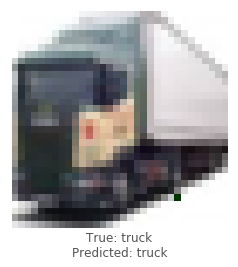

lenet - image 6967 - 511 / 1000


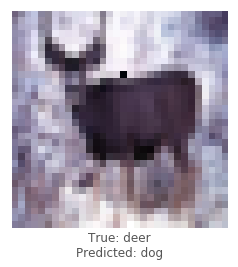

lenet - image 2765 - 512 / 1000


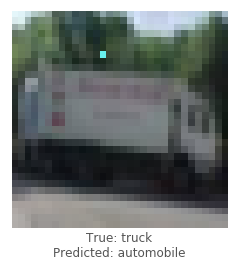

lenet - image 2016 - 513 / 1000


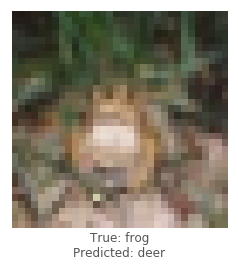

lenet - image 1927 - 514 / 1000


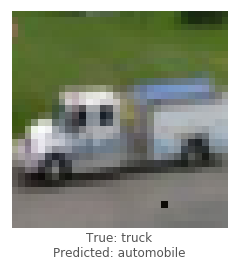

lenet - image 545 - 515 / 1000


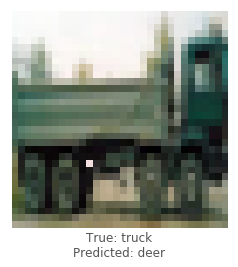

lenet - image 9087 - 516 / 1000


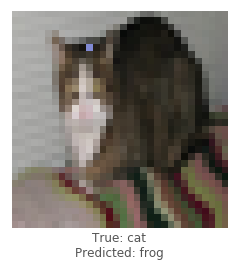

lenet - image 4380 - 517 / 1000


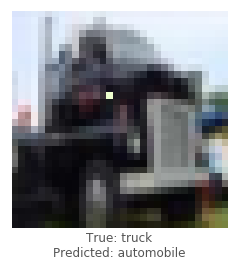

lenet - image 3785 - 518 / 1000


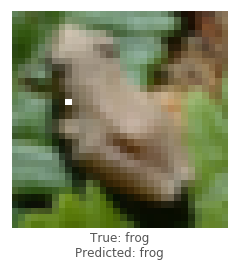

lenet - image 6662 - 519 / 1000


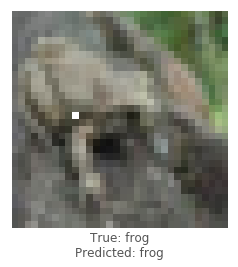

lenet - image 6417 - 520 / 1000


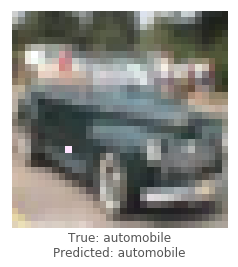

lenet - image 7547 - 521 / 1000


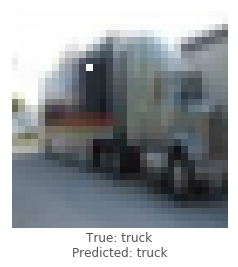

lenet - image 478 - 522 / 1000


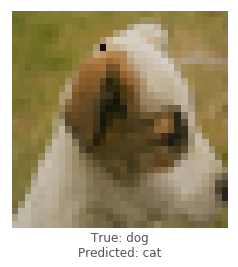

lenet - image 9112 - 523 / 1000


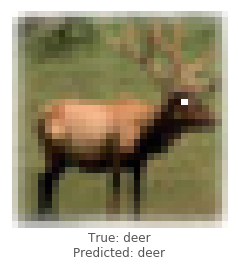

lenet - image 3838 - 524 / 1000


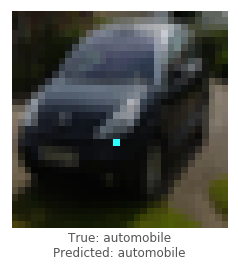

lenet - image 460 - 525 / 1000


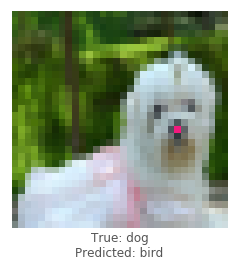

lenet - image 2373 - 526 / 1000


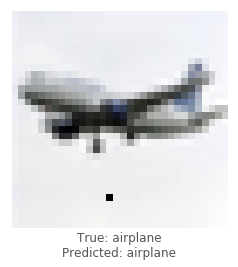

lenet - image 6382 - 527 / 1000


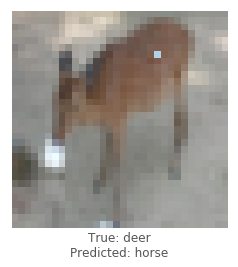

lenet - image 1358 - 528 / 1000


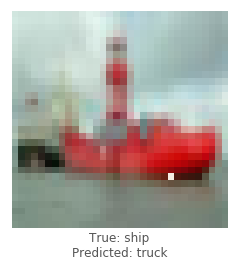

lenet - image 1003 - 529 / 1000


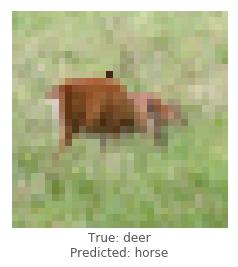

lenet - image 3530 - 530 / 1000


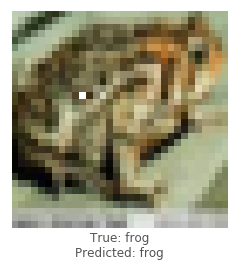

lenet - image 1735 - 531 / 1000


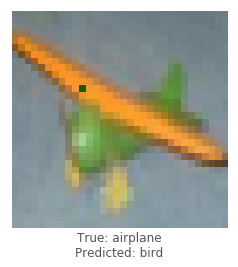

lenet - image 8660 - 532 / 1000


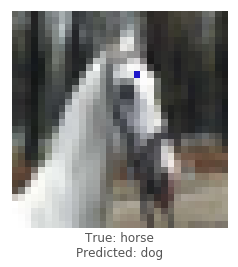

lenet - image 8486 - 533 / 1000


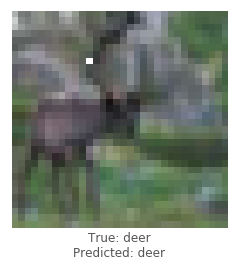

lenet - image 6174 - 534 / 1000


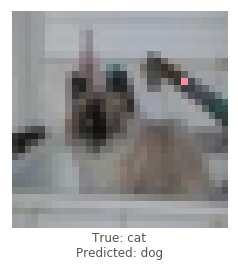

lenet - image 9154 - 535 / 1000


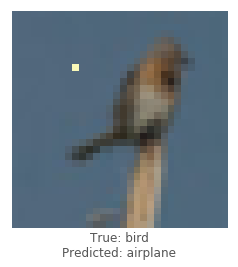

lenet - image 8085 - 536 / 1000


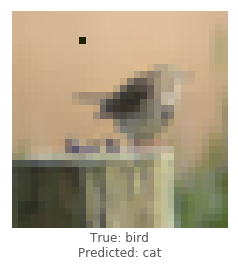

lenet - image 7764 - 537 / 1000


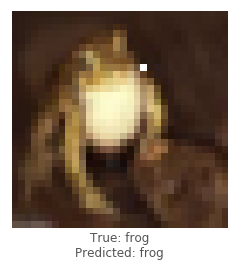

lenet - image 3724 - 538 / 1000


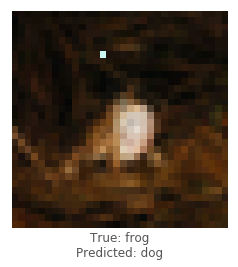

lenet - image 1287 - 539 / 1000


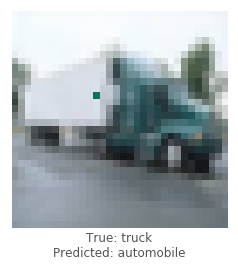

lenet - image 9829 - 540 / 1000


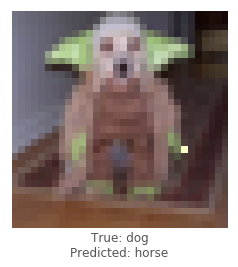

lenet - image 8792 - 541 / 1000


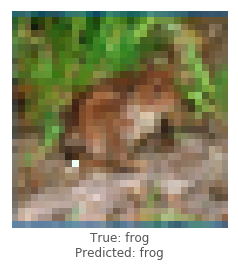

lenet - image 376 - 542 / 1000


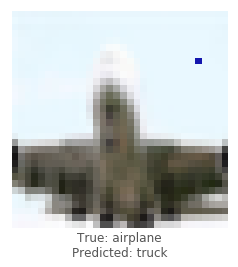

lenet - image 5186 - 543 / 1000


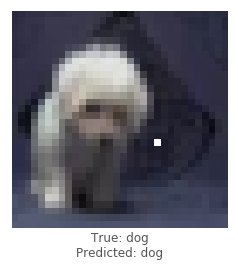

lenet - image 9766 - 544 / 1000


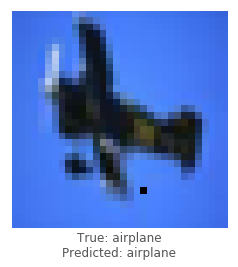

lenet - image 9425 - 545 / 1000


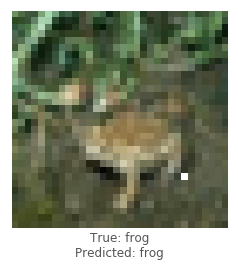

lenet - image 5220 - 546 / 1000


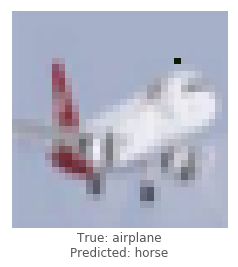

lenet - image 4777 - 547 / 1000


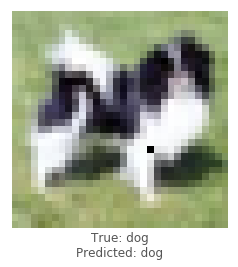

lenet - image 1340 - 548 / 1000


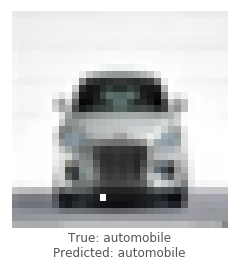

lenet - image 5522 - 549 / 1000


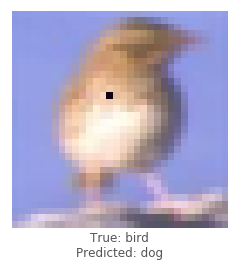

lenet - image 1093 - 550 / 1000


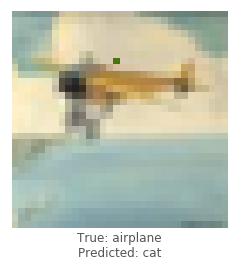

lenet - image 9438 - 551 / 1000


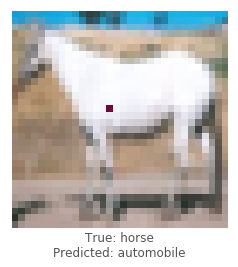

lenet - image 5485 - 552 / 1000


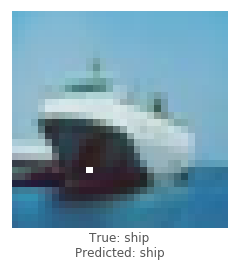

lenet - image 3978 - 553 / 1000


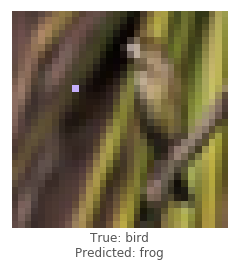

lenet - image 4701 - 554 / 1000


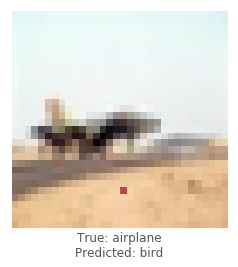

lenet - image 3601 - 555 / 1000


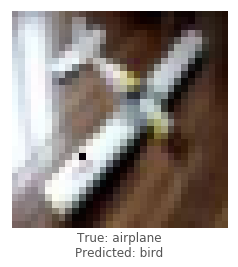

lenet - image 1513 - 556 / 1000


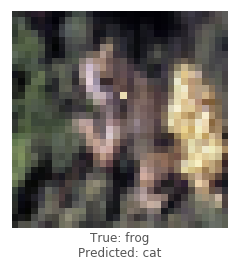

lenet - image 546 - 557 / 1000


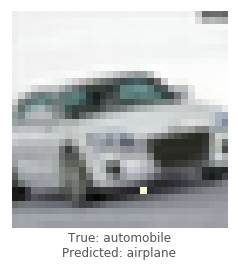

lenet - image 9598 - 558 / 1000


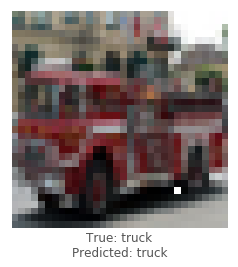

lenet - image 969 - 559 / 1000


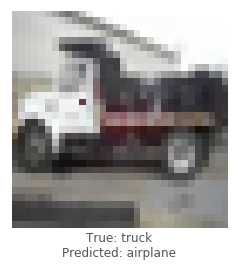

lenet - image 8544 - 560 / 1000


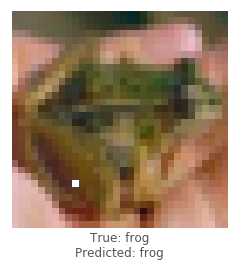

lenet - image 6911 - 561 / 1000


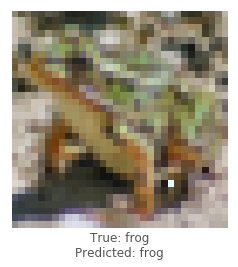

lenet - image 7438 - 562 / 1000


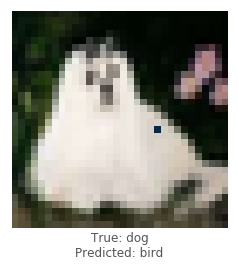

lenet - image 5276 - 563 / 1000


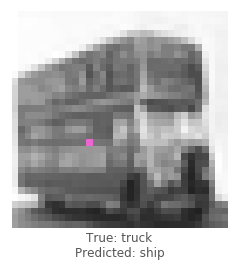

lenet - image 7664 - 564 / 1000


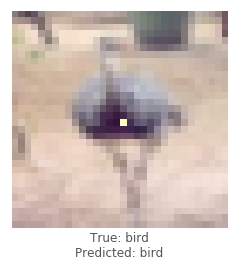

lenet - image 4126 - 565 / 1000


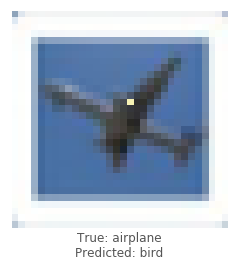

lenet - image 9198 - 566 / 1000


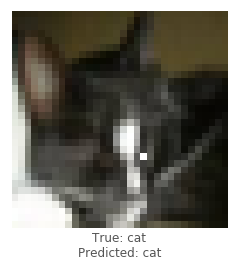

lenet - image 2457 - 567 / 1000


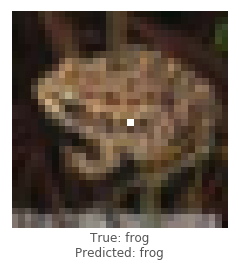

lenet - image 6154 - 568 / 1000


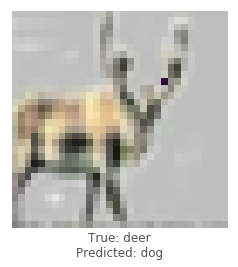

lenet - image 3736 - 569 / 1000


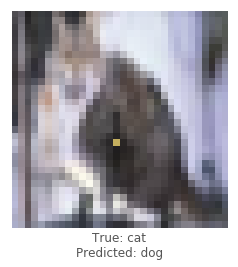

lenet - image 9265 - 570 / 1000


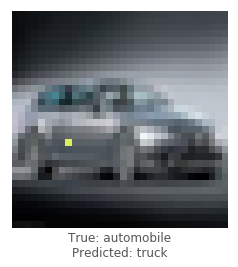

lenet - image 115 - 571 / 1000


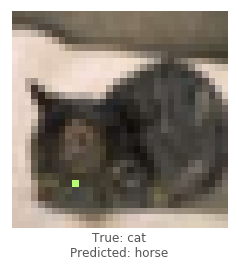

lenet - image 3807 - 572 / 1000


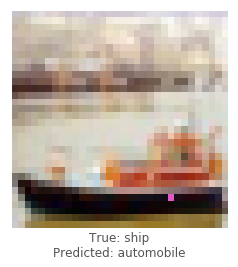

lenet - image 7469 - 573 / 1000


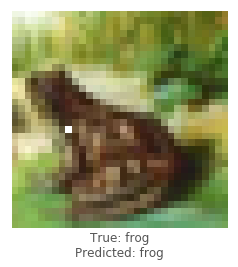

lenet - image 2582 - 574 / 1000


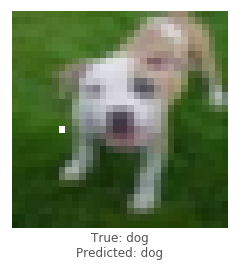

lenet - image 7931 - 575 / 1000


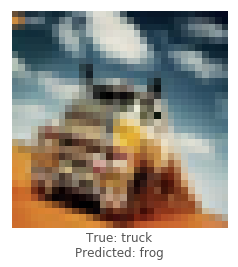

lenet - image 7047 - 576 / 1000


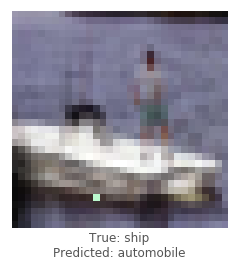

lenet - image 6122 - 577 / 1000


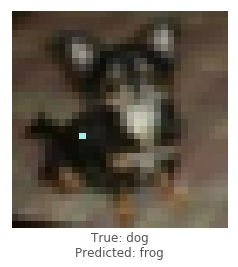

lenet - image 2964 - 578 / 1000


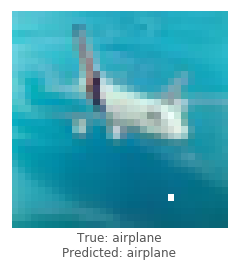

lenet - image 1028 - 579 / 1000


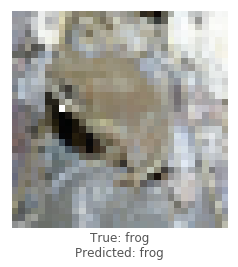

lenet - image 3036 - 580 / 1000


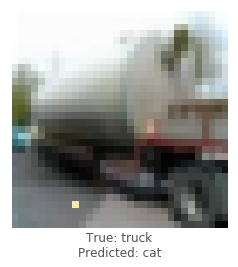

lenet - image 768 - 581 / 1000


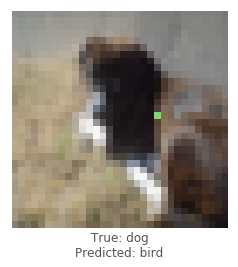

lenet - image 2896 - 582 / 1000


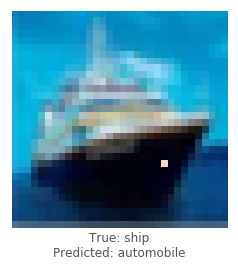

lenet - image 4824 - 583 / 1000


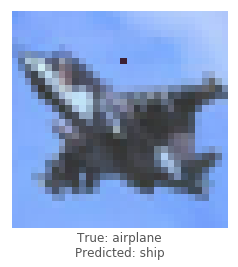

lenet - image 8390 - 584 / 1000


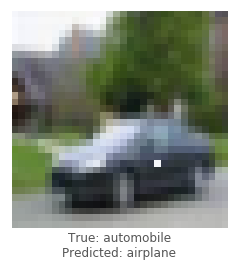

lenet - image 4868 - 585 / 1000


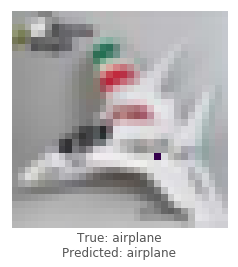

lenet - image 6361 - 586 / 1000


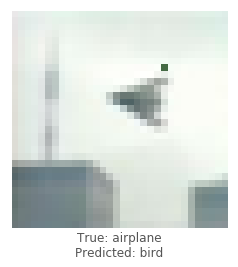

lenet - image 766 - 587 / 1000


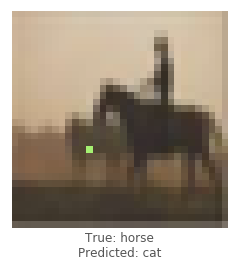

lenet - image 7925 - 588 / 1000


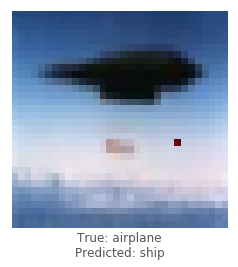

lenet - image 635 - 589 / 1000


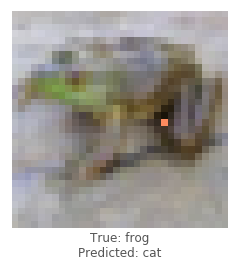

lenet - image 7616 - 590 / 1000


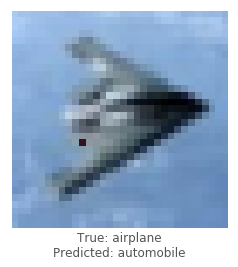

lenet - image 544 - 591 / 1000


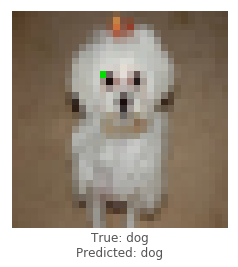

lenet - image 4727 - 592 / 1000


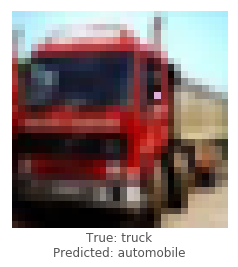

lenet - image 3037 - 593 / 1000


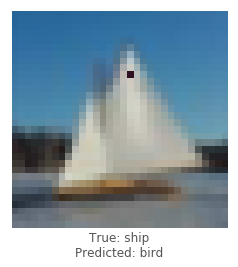

lenet - image 3869 - 594 / 1000


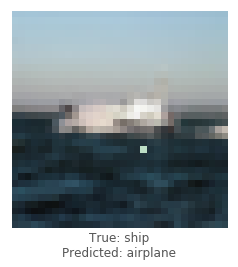

lenet - image 2830 - 595 / 1000


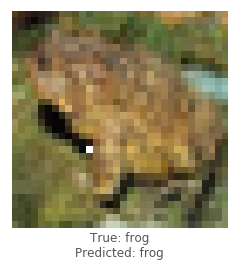

lenet - image 2229 - 596 / 1000


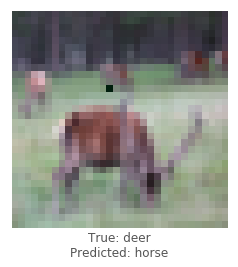

lenet - image 2501 - 597 / 1000


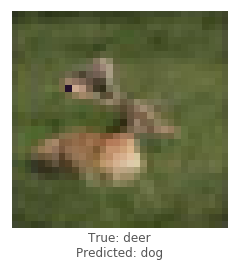

lenet - image 4653 - 598 / 1000


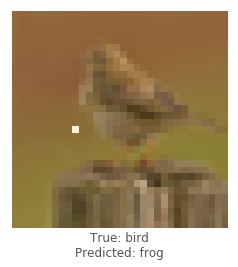

lenet - image 53 - 599 / 1000


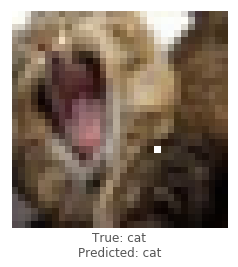

lenet - image 8328 - 600 / 1000


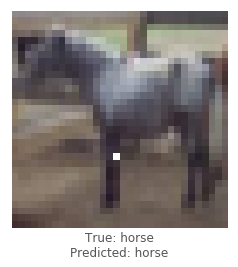

lenet - image 2433 - 601 / 1000


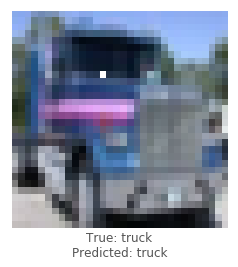

lenet - image 1604 - 602 / 1000


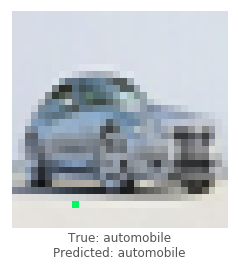

lenet - image 1234 - 603 / 1000


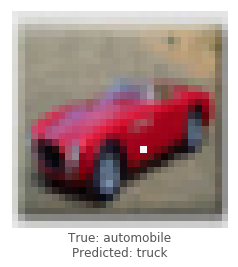

lenet - image 4732 - 604 / 1000


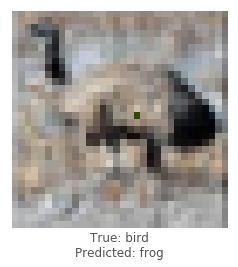

lenet - image 9344 - 605 / 1000


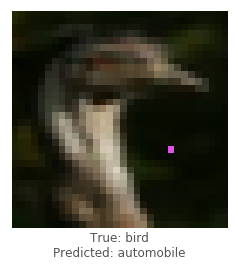

lenet - image 8273 - 606 / 1000


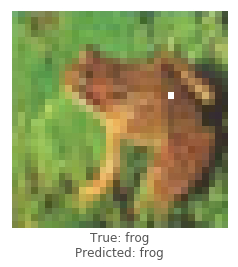

lenet - image 7836 - 607 / 1000


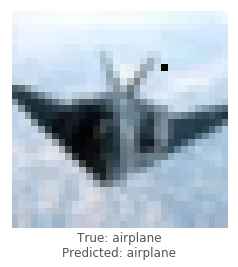

lenet - image 6156 - 608 / 1000


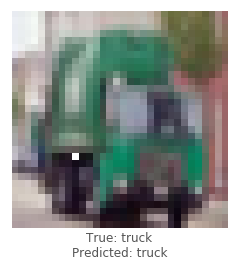

lenet - image 4488 - 609 / 1000


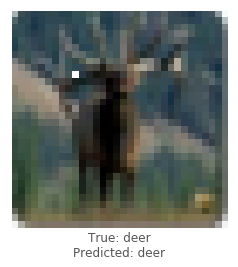

lenet - image 5602 - 610 / 1000


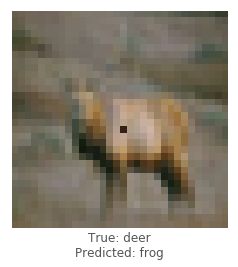

lenet - image 383 - 611 / 1000


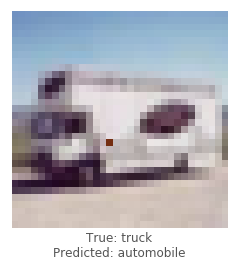

lenet - image 3768 - 612 / 1000


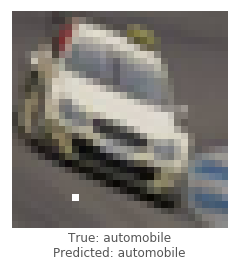

lenet - image 2047 - 613 / 1000


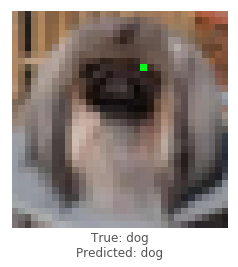

lenet - image 3517 - 614 / 1000


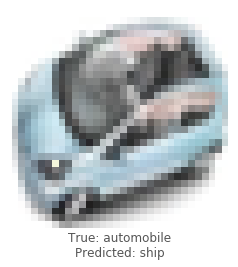

lenet - image 6263 - 615 / 1000


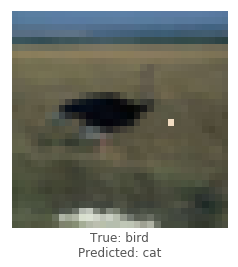

lenet - image 110 - 616 / 1000


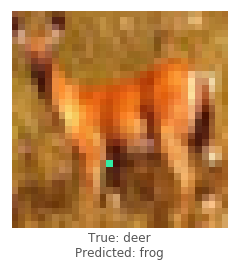

lenet - image 3795 - 617 / 1000


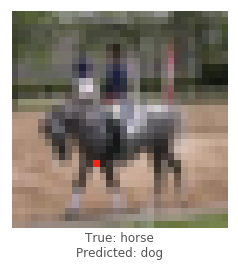

lenet - image 4245 - 618 / 1000


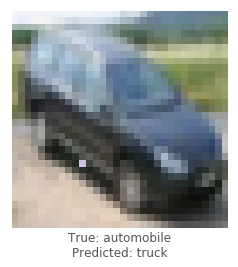

lenet - image 6506 - 619 / 1000


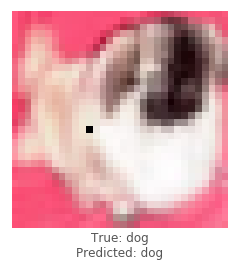

lenet - image 8675 - 620 / 1000


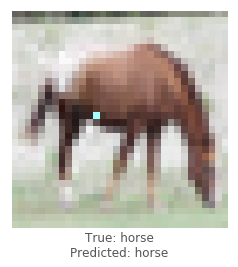

lenet - image 7539 - 621 / 1000


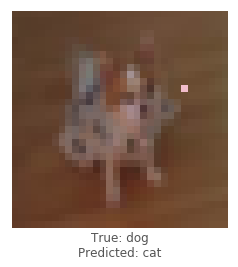

lenet - image 1776 - 622 / 1000


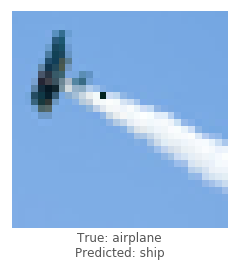

lenet - image 7593 - 623 / 1000


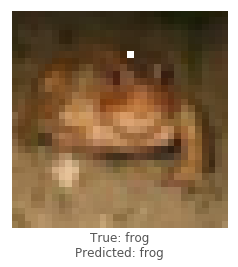

lenet - image 7886 - 624 / 1000


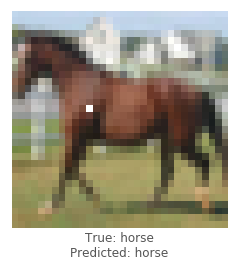

lenet - image 8975 - 625 / 1000


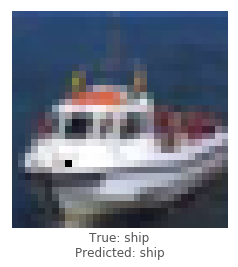

lenet - image 9345 - 626 / 1000


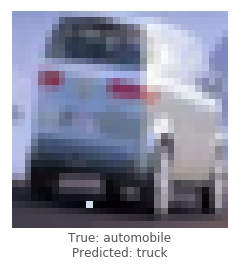

lenet - image 512 - 627 / 1000


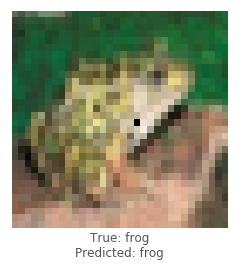

lenet - image 3385 - 628 / 1000


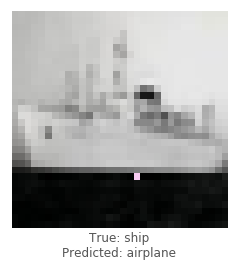

lenet - image 3452 - 629 / 1000


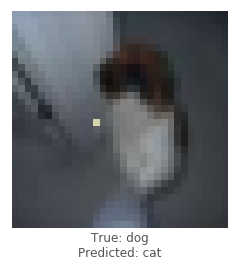

lenet - image 4351 - 630 / 1000


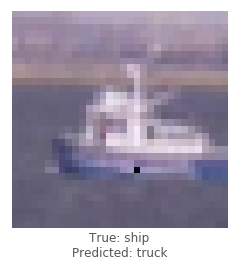

lenet - image 5722 - 631 / 1000


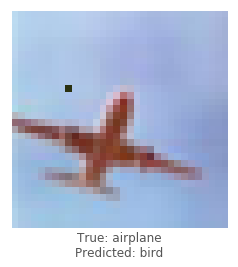

lenet - image 6482 - 632 / 1000


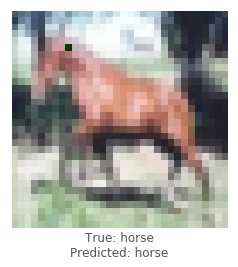

lenet - image 7376 - 633 / 1000


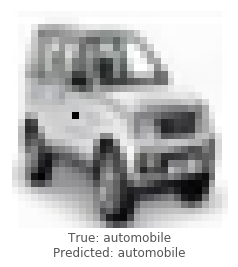

lenet - image 5366 - 634 / 1000


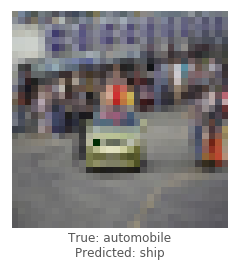

lenet - image 2148 - 635 / 1000


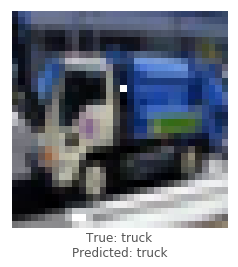

lenet - image 712 - 636 / 1000


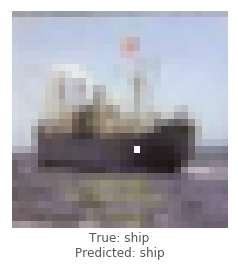

lenet - image 8810 - 637 / 1000


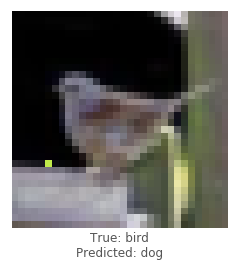

lenet - image 8341 - 638 / 1000


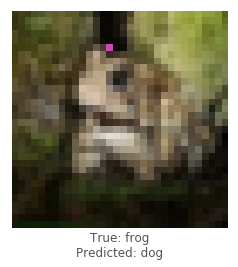

lenet - image 4480 - 639 / 1000


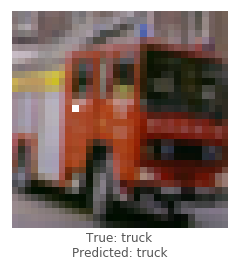

lenet - image 5032 - 640 / 1000


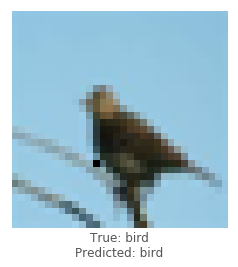

lenet - image 6436 - 641 / 1000


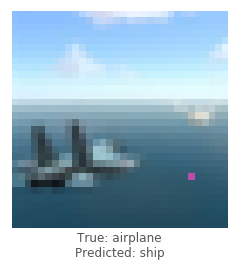

lenet - image 362 - 642 / 1000


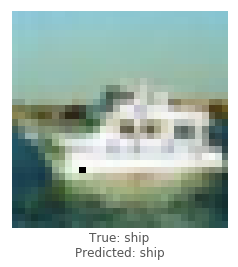

lenet - image 4831 - 643 / 1000


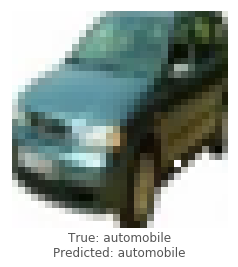

lenet - image 8359 - 644 / 1000


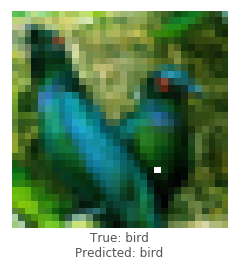

lenet - image 842 - 645 / 1000


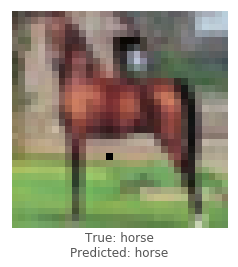

lenet - image 4007 - 646 / 1000


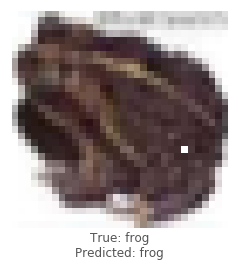

lenet - image 9769 - 647 / 1000


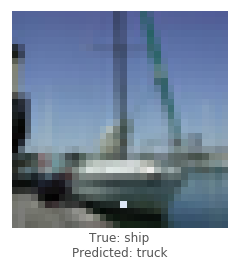

lenet - image 5836 - 648 / 1000


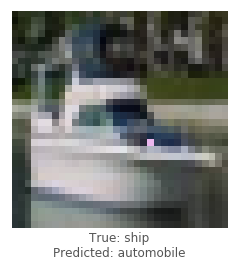

lenet - image 3612 - 649 / 1000


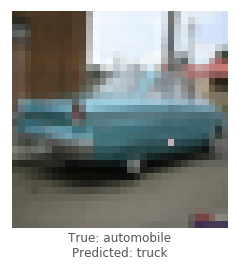

lenet - image 6113 - 650 / 1000


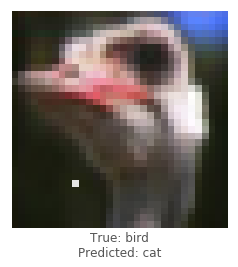

lenet - image 1551 - 651 / 1000


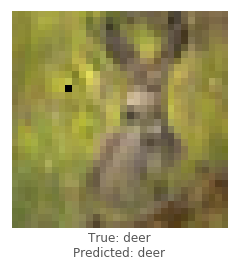

lenet - image 1609 - 652 / 1000


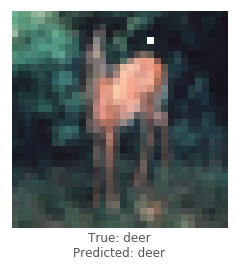

lenet - image 174 - 653 / 1000


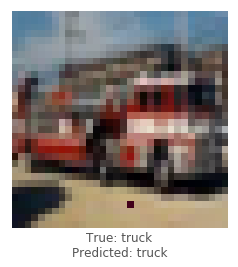

lenet - image 7885 - 654 / 1000


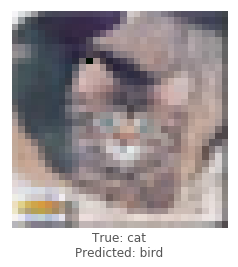

lenet - image 8762 - 655 / 1000


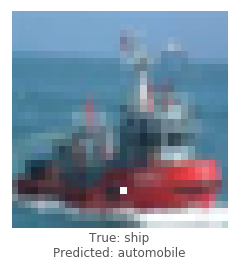

lenet - image 8483 - 656 / 1000


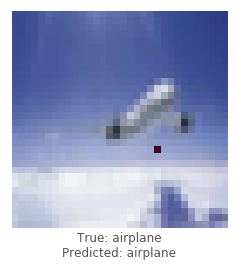

lenet - image 7259 - 657 / 1000


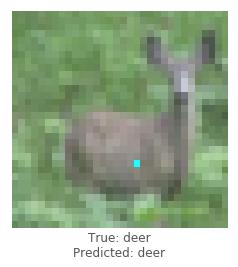

lenet - image 7485 - 658 / 1000


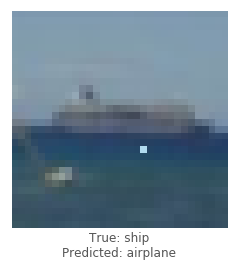

lenet - image 1552 - 659 / 1000


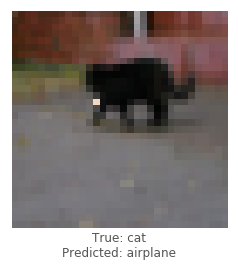

lenet - image 1944 - 660 / 1000


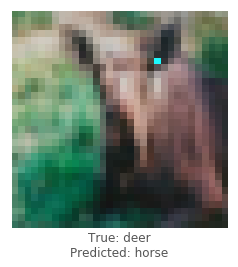

lenet - image 2366 - 661 / 1000


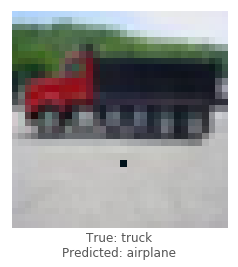

lenet - image 8355 - 662 / 1000


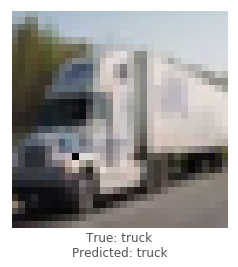

lenet - image 3930 - 663 / 1000


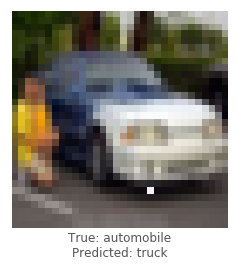

lenet - image 7926 - 664 / 1000


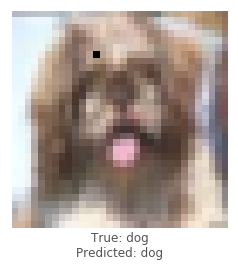

lenet - image 6043 - 665 / 1000


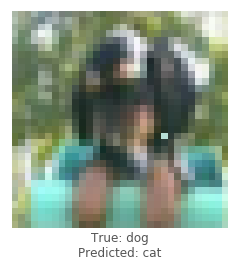

lenet - image 8172 - 666 / 1000


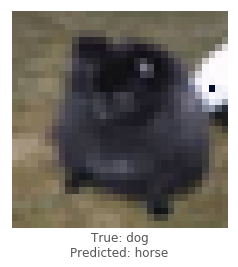

lenet - image 517 - 667 / 1000


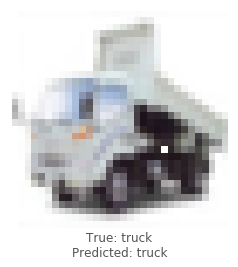

lenet - image 2956 - 668 / 1000


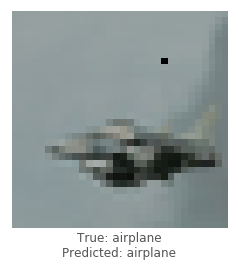

lenet - image 918 - 669 / 1000


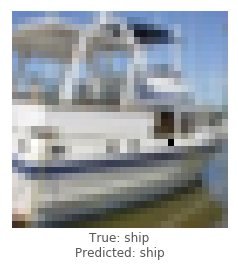

lenet - image 7379 - 670 / 1000


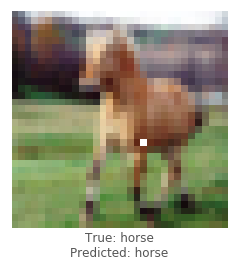

lenet - image 594 - 671 / 1000


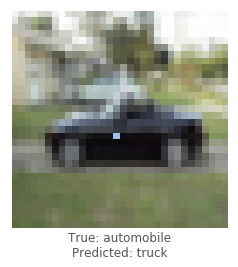

lenet - image 5610 - 672 / 1000


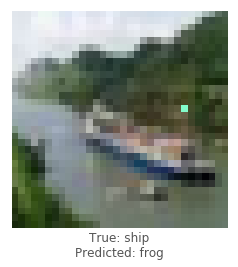

lenet - image 8887 - 673 / 1000


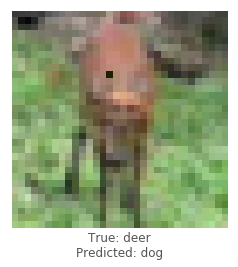

lenet - image 6752 - 674 / 1000


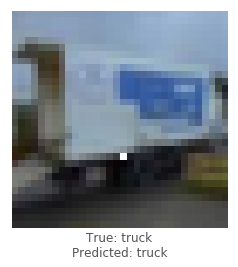

lenet - image 2739 - 675 / 1000


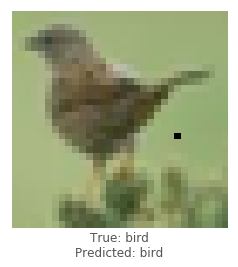

lenet - image 9931 - 676 / 1000


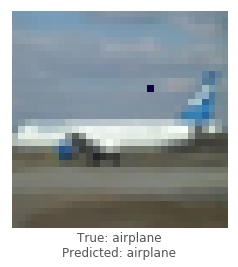

lenet - image 5265 - 677 / 1000


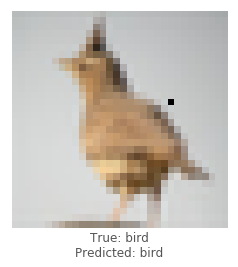

lenet - image 6426 - 678 / 1000


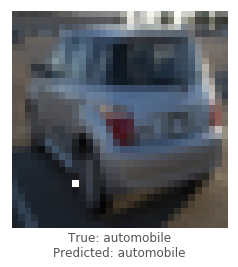

lenet - image 2091 - 679 / 1000


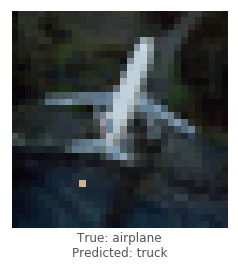

lenet - image 8324 - 680 / 1000


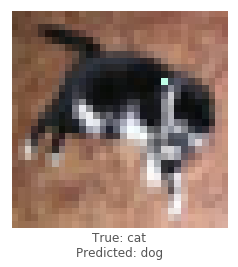

lenet - image 6015 - 681 / 1000


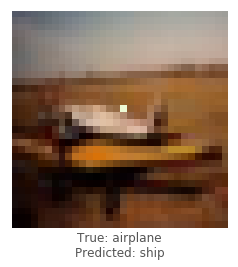

lenet - image 8859 - 682 / 1000


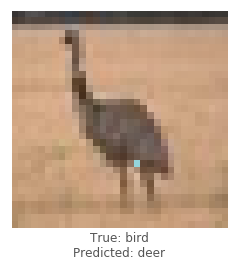

lenet - image 884 - 683 / 1000


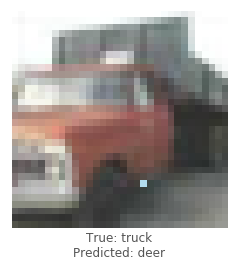

lenet - image 2889 - 684 / 1000


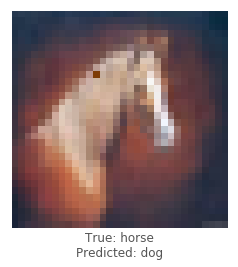

lenet - image 8015 - 685 / 1000


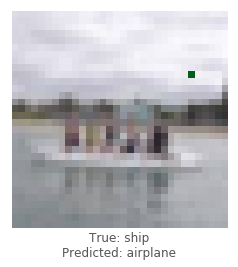

lenet - image 1172 - 686 / 1000


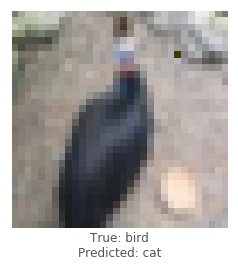

lenet - image 4685 - 687 / 1000


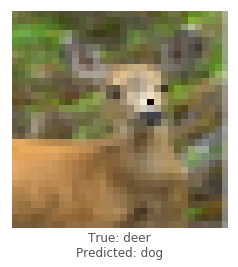

lenet - image 7046 - 688 / 1000


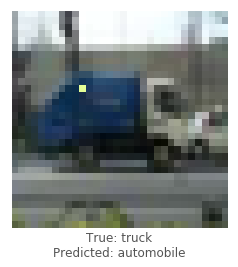

lenet - image 8133 - 689 / 1000


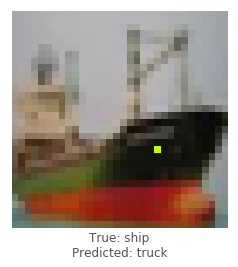

lenet - image 8106 - 690 / 1000


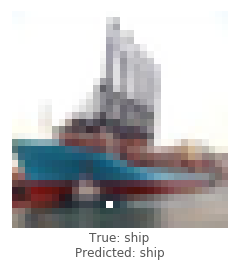

lenet - image 6604 - 691 / 1000


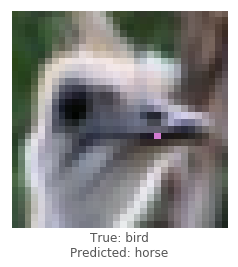

lenet - image 3018 - 692 / 1000


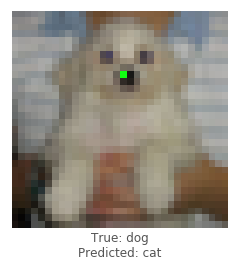

lenet - image 3859 - 693 / 1000


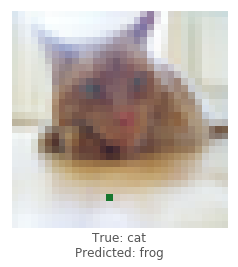

lenet - image 6442 - 694 / 1000


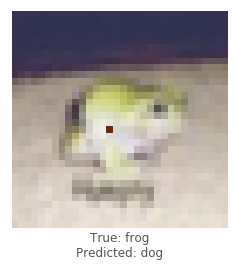

lenet - image 2277 - 695 / 1000


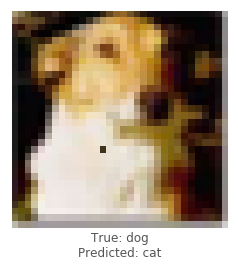

lenet - image 6274 - 696 / 1000


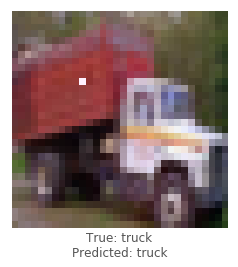

lenet - image 538 - 697 / 1000


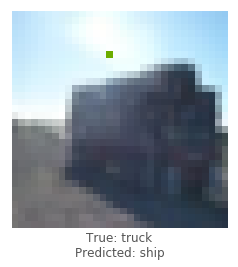

lenet - image 8258 - 698 / 1000


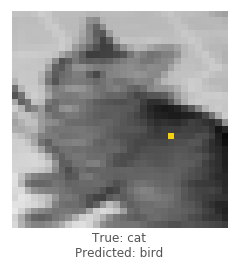

lenet - image 173 - 699 / 1000


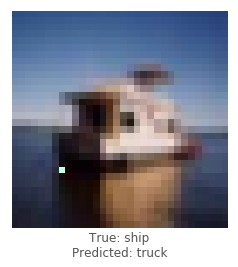

lenet - image 6916 - 700 / 1000


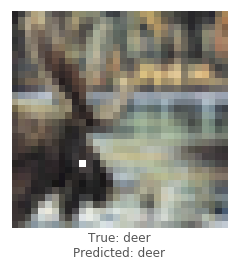

lenet - image 184 - 701 / 1000


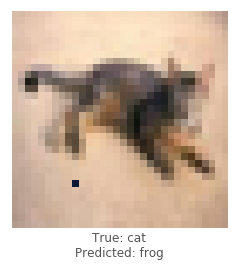

lenet - image 3087 - 702 / 1000


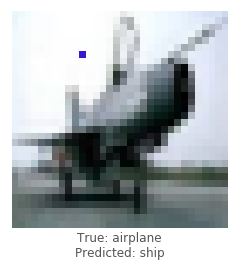

lenet - image 3894 - 703 / 1000


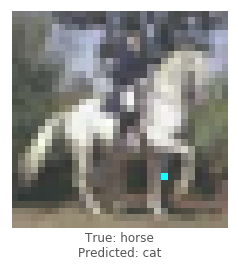

lenet - image 2488 - 704 / 1000


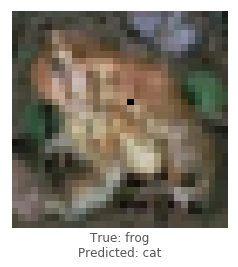

lenet - image 3482 - 705 / 1000


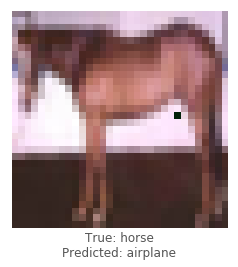

lenet - image 1365 - 706 / 1000


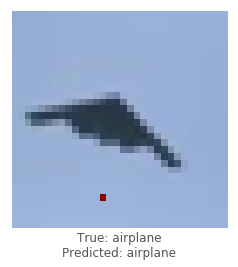

lenet - image 14 - 707 / 1000


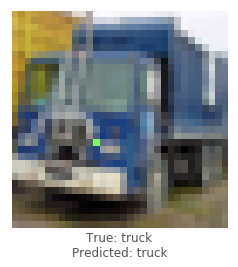

lenet - image 5725 - 708 / 1000


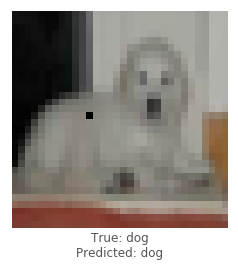

lenet - image 1830 - 709 / 1000


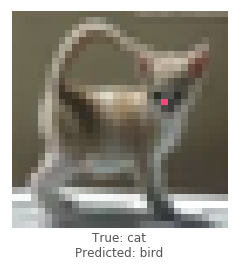

lenet - image 5738 - 710 / 1000


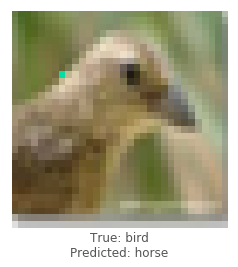

lenet - image 9125 - 711 / 1000


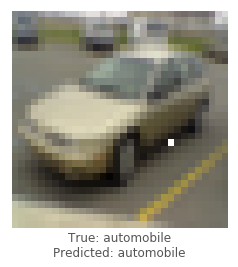

lenet - image 1496 - 712 / 1000


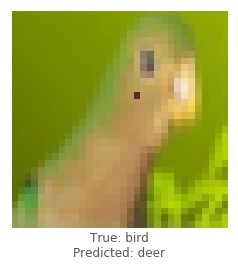

lenet - image 8569 - 713 / 1000


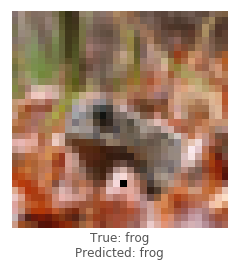

lenet - image 4297 - 714 / 1000


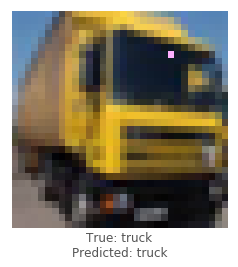

lenet - image 5381 - 715 / 1000


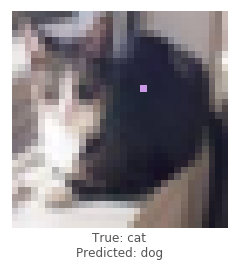

lenet - image 2043 - 716 / 1000


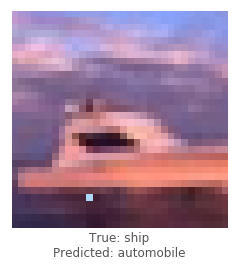

lenet - image 6824 - 717 / 1000


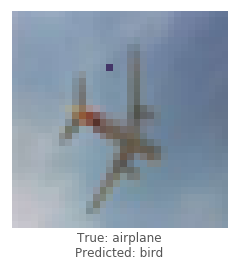

lenet - image 8908 - 718 / 1000


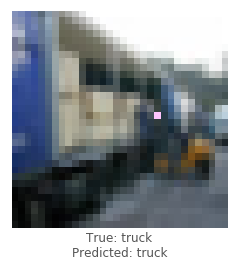

lenet - image 160 - 719 / 1000


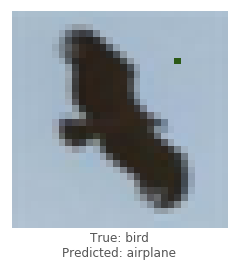

lenet - image 9142 - 720 / 1000


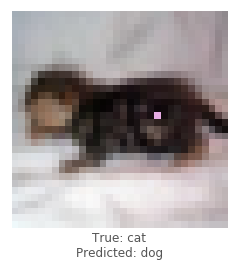

lenet - image 5766 - 721 / 1000


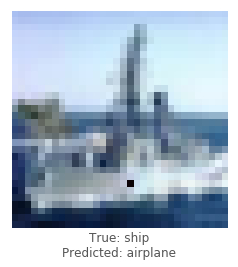

lenet - image 9974 - 722 / 1000


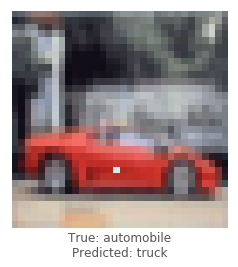

lenet - image 9466 - 723 / 1000


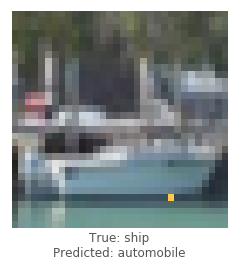

lenet - image 6421 - 724 / 1000


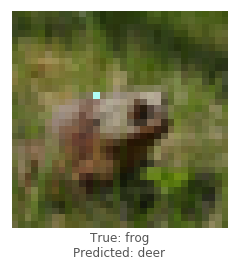

lenet - image 817 - 725 / 1000


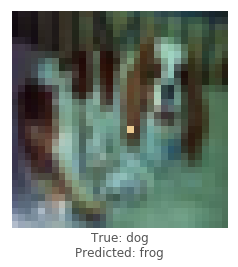

lenet - image 2356 - 726 / 1000


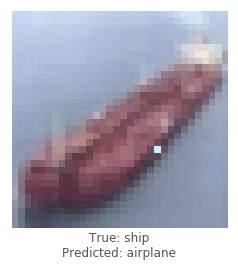

lenet - image 8657 - 727 / 1000


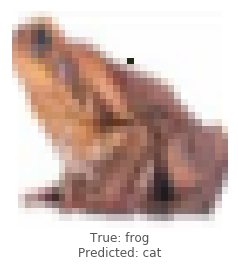

lenet - image 354 - 728 / 1000


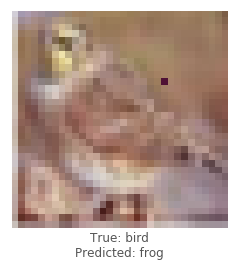

lenet - image 1778 - 729 / 1000


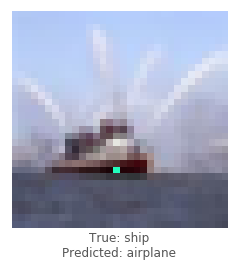

lenet - image 2161 - 730 / 1000


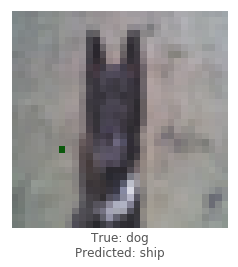

lenet - image 8665 - 731 / 1000


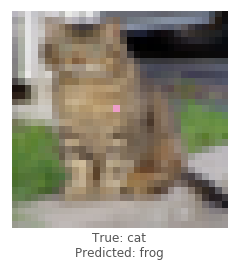

lenet - image 8097 - 732 / 1000


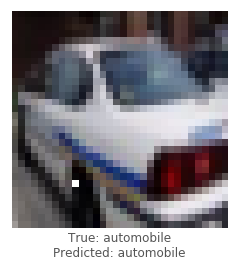

lenet - image 774 - 733 / 1000


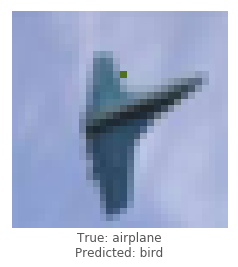

lenet - image 1653 - 734 / 1000


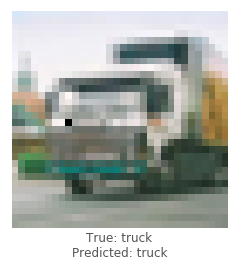

lenet - image 2213 - 735 / 1000


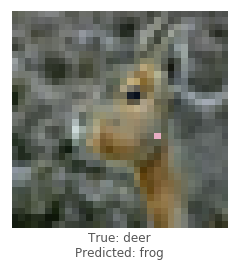

lenet - image 9079 - 736 / 1000


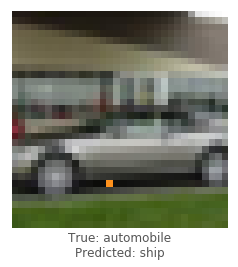

lenet - image 2556 - 737 / 1000


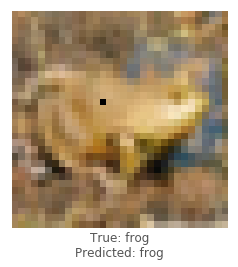

lenet - image 533 - 738 / 1000


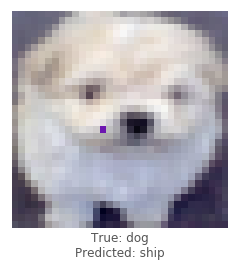

lenet - image 6395 - 739 / 1000


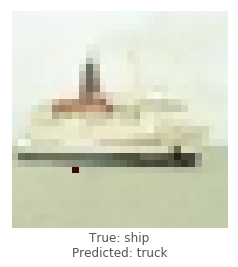

lenet - image 3913 - 740 / 1000


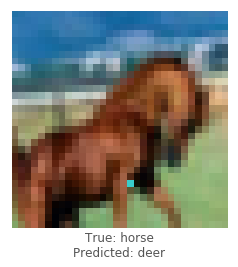

lenet - image 9293 - 741 / 1000


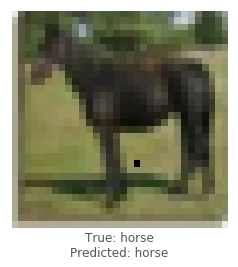

lenet - image 7826 - 742 / 1000


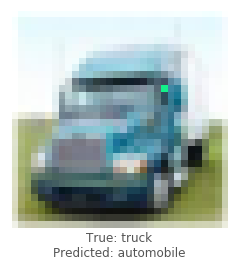

lenet - image 7236 - 743 / 1000


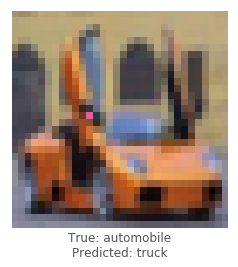

lenet - image 2536 - 744 / 1000


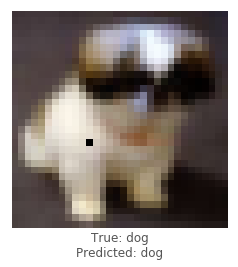

lenet - image 3932 - 745 / 1000


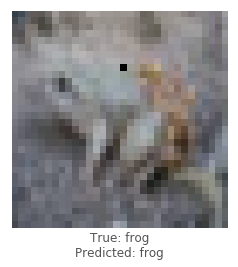

lenet - image 2917 - 746 / 1000


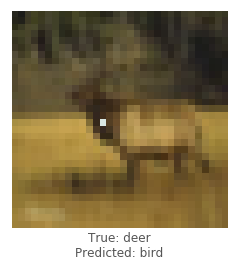

lenet - image 9480 - 747 / 1000


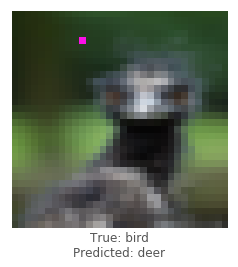

lenet - image 4515 - 748 / 1000


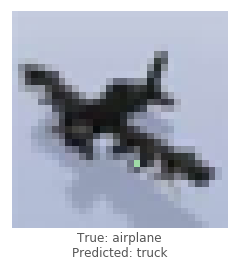

lenet - image 4122 - 749 / 1000


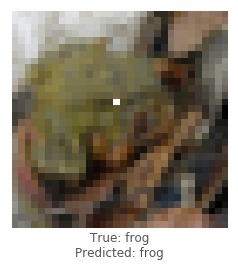

lenet - image 6080 - 750 / 1000


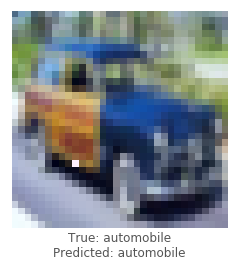

lenet - image 4080 - 751 / 1000


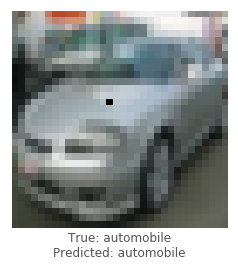

lenet - image 8068 - 752 / 1000


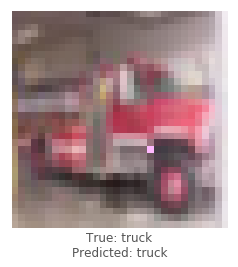

lenet - image 2169 - 753 / 1000


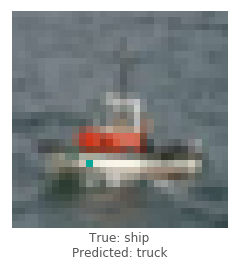

lenet - image 2268 - 754 / 1000


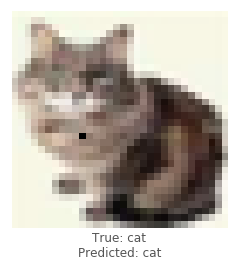

lenet - image 7623 - 755 / 1000


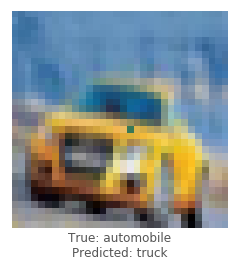

lenet - image 5090 - 756 / 1000


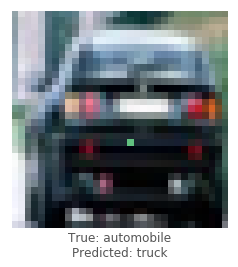

lenet - image 410 - 757 / 1000


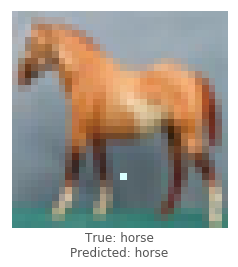

lenet - image 6404 - 758 / 1000


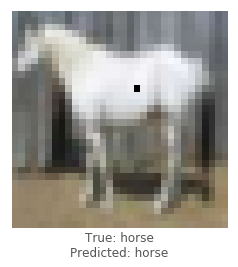

lenet - image 9008 - 759 / 1000


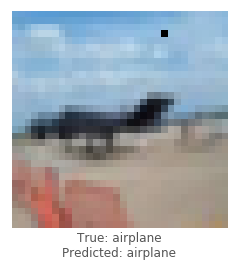

lenet - image 7227 - 760 / 1000


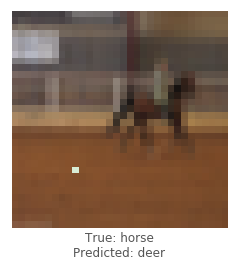

lenet - image 9175 - 761 / 1000


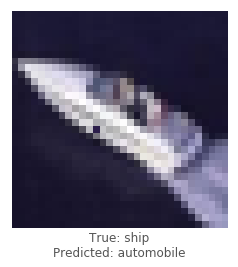

lenet - image 3227 - 762 / 1000


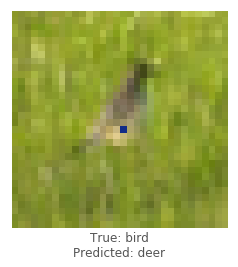

lenet - image 8261 - 763 / 1000


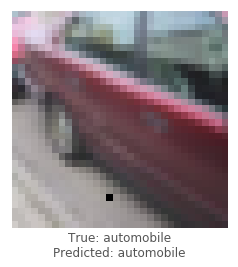

lenet - image 2264 - 764 / 1000


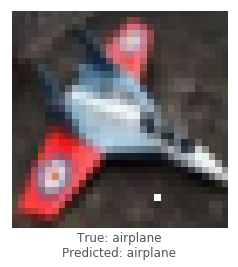

lenet - image 7696 - 765 / 1000


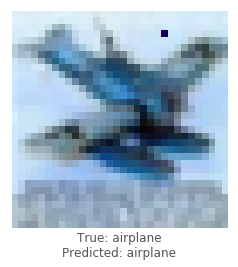

lenet - image 4908 - 766 / 1000


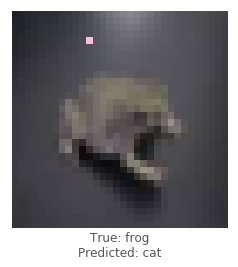

lenet - image 7050 - 767 / 1000


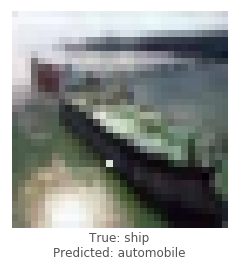

lenet - image 2295 - 768 / 1000


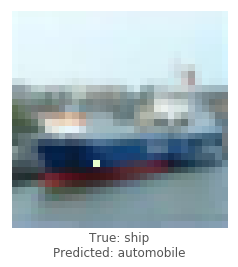

lenet - image 7636 - 769 / 1000


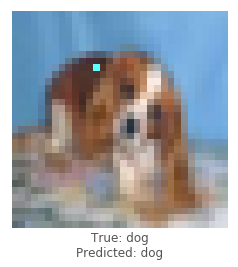

lenet - image 8008 - 770 / 1000


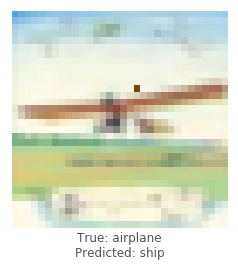

lenet - image 5594 - 771 / 1000


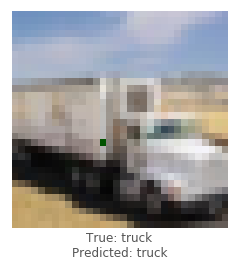

lenet - image 8523 - 772 / 1000


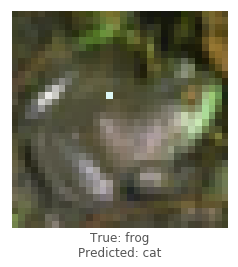

lenet - image 1638 - 773 / 1000


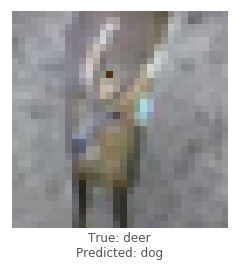

lenet - image 7773 - 774 / 1000


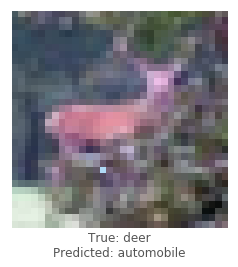

lenet - image 9392 - 775 / 1000


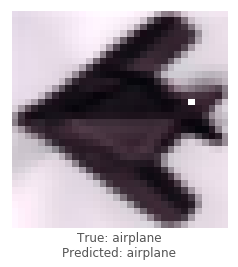

lenet - image 1119 - 776 / 1000


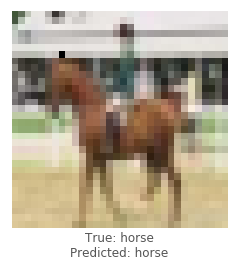

lenet - image 9377 - 777 / 1000


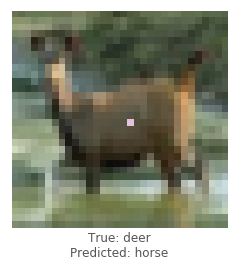

lenet - image 8564 - 778 / 1000


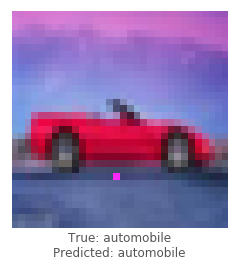

lenet - image 5937 - 779 / 1000


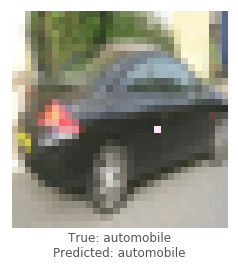

lenet - image 122 - 780 / 1000


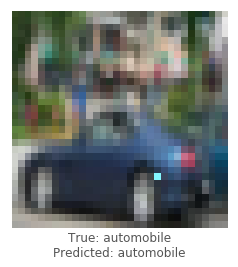

lenet - image 2158 - 781 / 1000


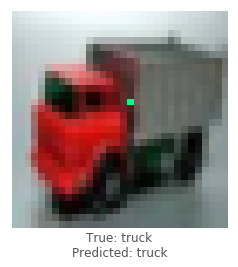

lenet - image 6119 - 782 / 1000


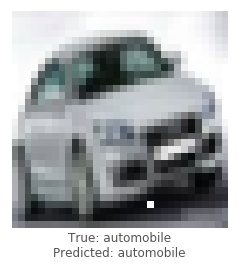

lenet - image 4162 - 783 / 1000


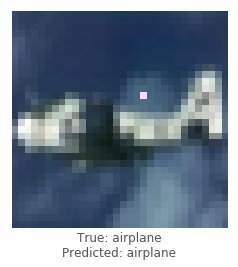

lenet - image 9121 - 784 / 1000


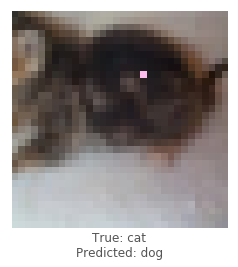

lenet - image 976 - 785 / 1000


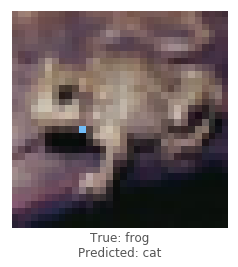

lenet - image 3442 - 786 / 1000


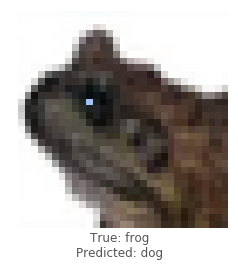

lenet - image 942 - 787 / 1000


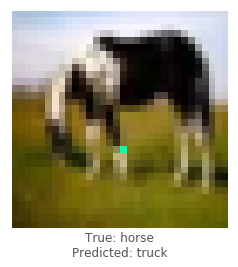

lenet - image 6278 - 788 / 1000


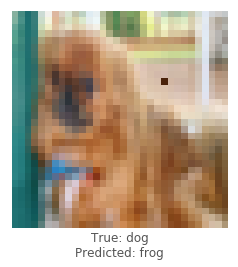

lenet - image 8464 - 789 / 1000


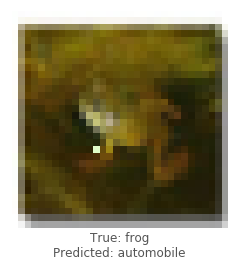

lenet - image 3238 - 790 / 1000


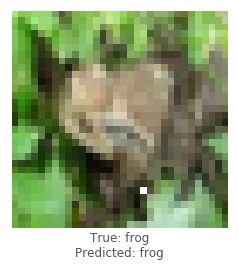

lenet - image 1377 - 791 / 1000


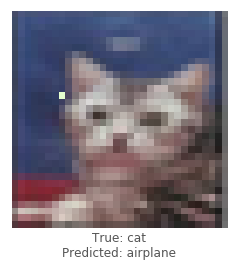

lenet - image 2631 - 792 / 1000


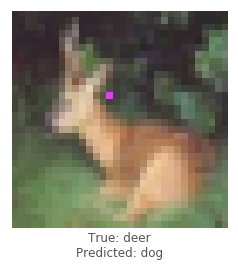

lenet - image 6641 - 793 / 1000


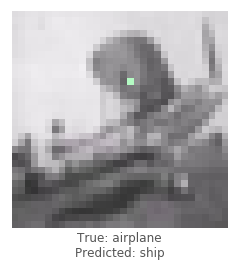

lenet - image 7912 - 794 / 1000


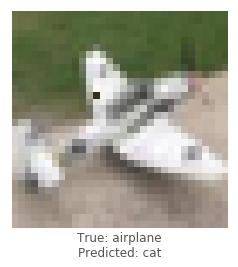

lenet - image 6335 - 795 / 1000


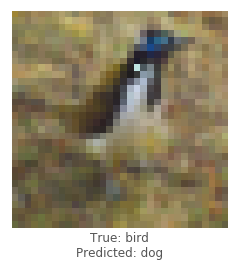

lenet - image 3969 - 796 / 1000


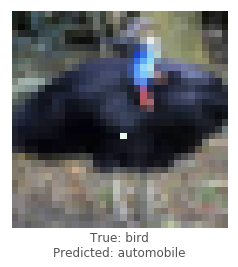

lenet - image 8223 - 797 / 1000


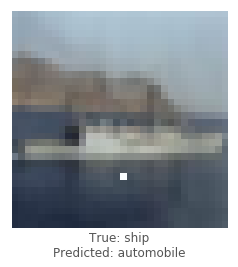

lenet - image 9185 - 798 / 1000


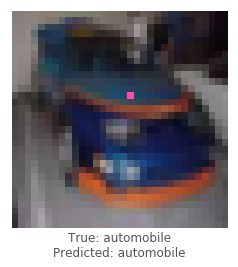

lenet - image 5286 - 799 / 1000


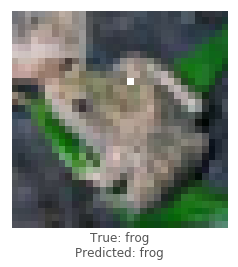

lenet - image 8228 - 800 / 1000


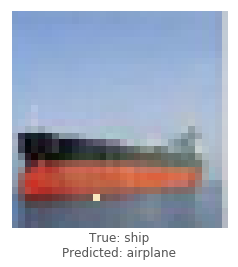

lenet - image 6060 - 801 / 1000


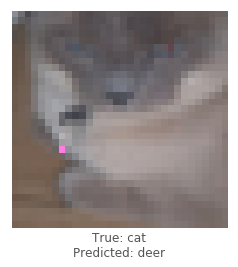

lenet - image 4475 - 802 / 1000


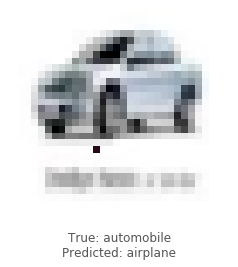

lenet - image 6542 - 803 / 1000


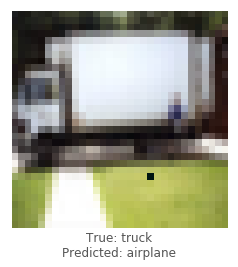

lenet - image 5187 - 804 / 1000


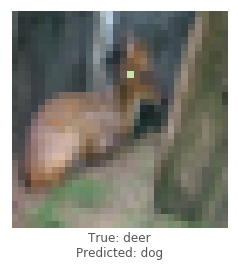

lenet - image 8992 - 805 / 1000


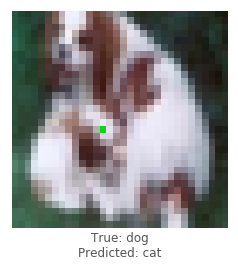

lenet - image 6707 - 806 / 1000


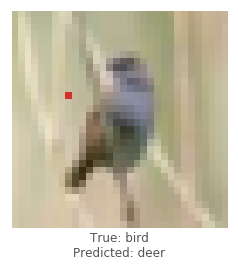

lenet - image 778 - 807 / 1000


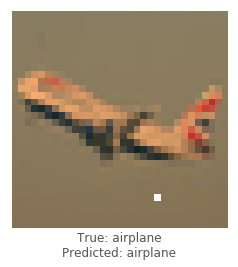

lenet - image 6267 - 808 / 1000


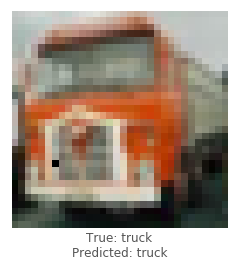

lenet - image 8795 - 809 / 1000


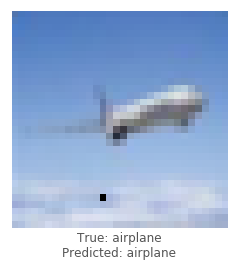

lenet - image 6600 - 810 / 1000


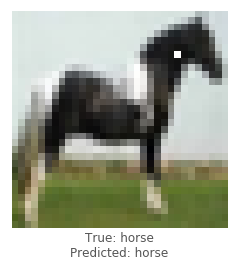

lenet - image 936 - 811 / 1000


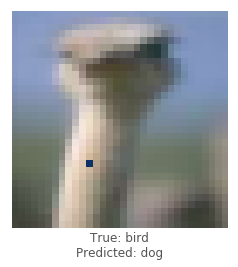

lenet - image 2149 - 812 / 1000


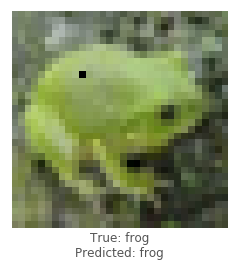

lenet - image 2541 - 813 / 1000


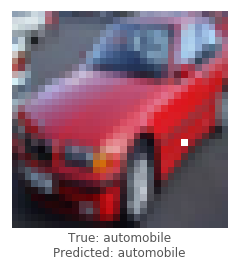

lenet - image 5446 - 814 / 1000


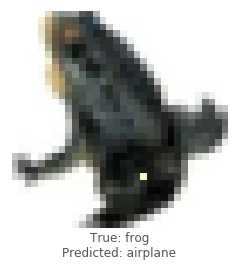

lenet - image 1360 - 815 / 1000


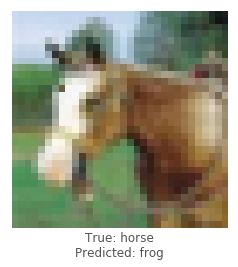

lenet - image 9290 - 816 / 1000


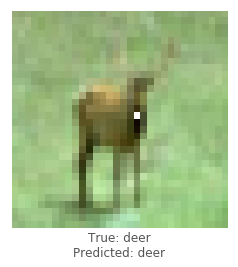

lenet - image 6851 - 817 / 1000


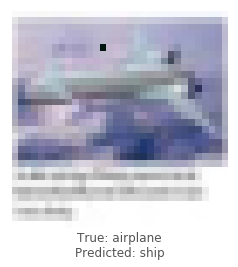

lenet - image 5798 - 818 / 1000


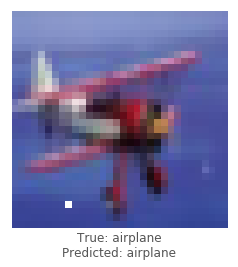

lenet - image 8959 - 819 / 1000


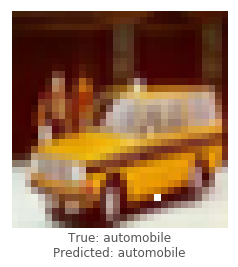

lenet - image 1626 - 820 / 1000


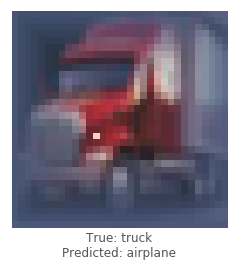

lenet - image 5382 - 821 / 1000


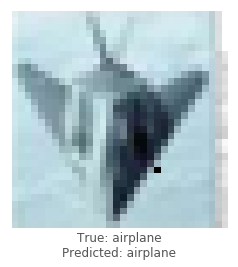

lenet - image 4529 - 822 / 1000


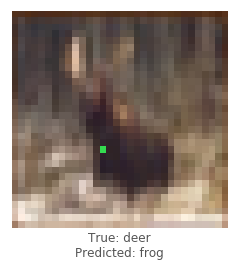

lenet - image 7628 - 823 / 1000


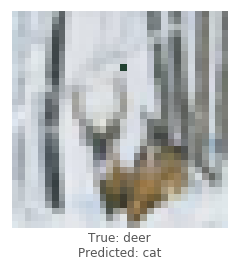

lenet - image 542 - 824 / 1000


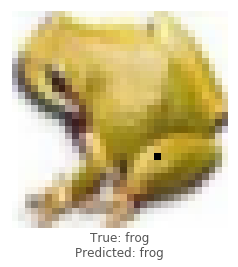

lenet - image 7585 - 825 / 1000


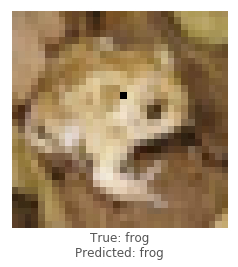

lenet - image 3963 - 826 / 1000


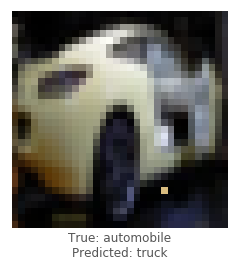

lenet - image 1452 - 827 / 1000


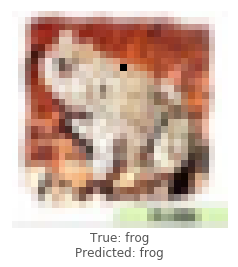

lenet - image 6296 - 828 / 1000


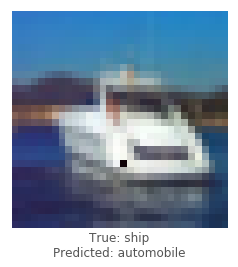

lenet - image 6868 - 829 / 1000


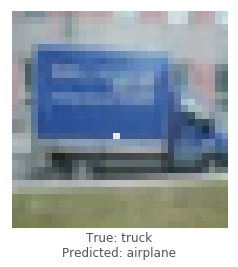

lenet - image 9073 - 830 / 1000


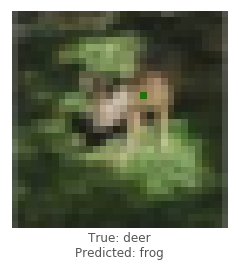

lenet - image 8013 - 831 / 1000


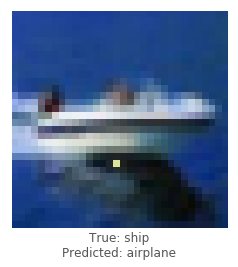

lenet - image 5677 - 832 / 1000


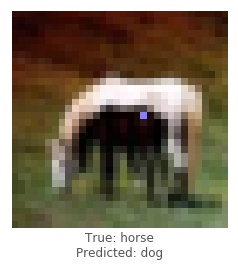

lenet - image 8391 - 833 / 1000


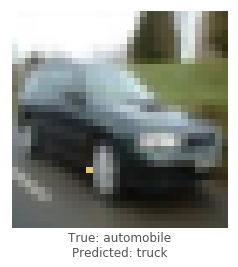

lenet - image 206 - 834 / 1000


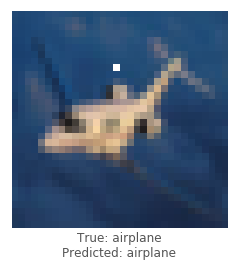

lenet - image 7587 - 835 / 1000


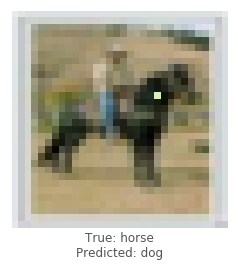

lenet - image 3973 - 836 / 1000


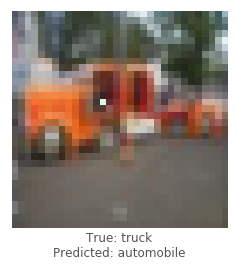

lenet - image 3429 - 837 / 1000


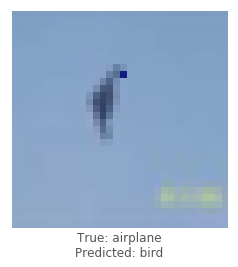

lenet - image 3745 - 838 / 1000


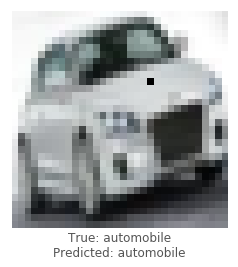

lenet - image 755 - 839 / 1000


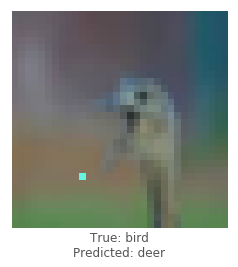

lenet - image 3175 - 840 / 1000


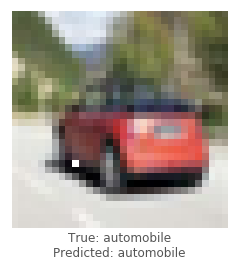

lenet - image 7599 - 841 / 1000


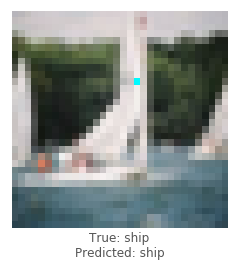

lenet - image 151 - 842 / 1000


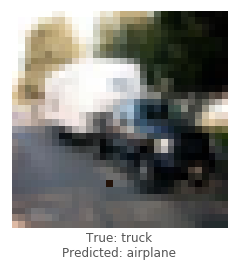

lenet - image 9356 - 843 / 1000


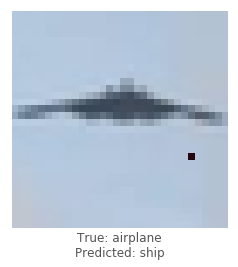

lenet - image 5600 - 844 / 1000


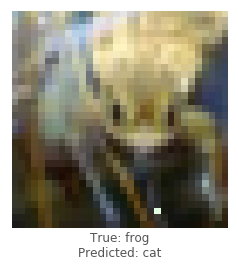

lenet - image 5612 - 845 / 1000


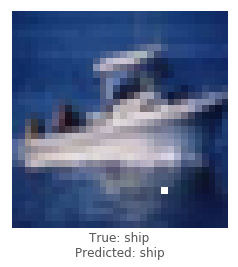

lenet - image 5439 - 846 / 1000


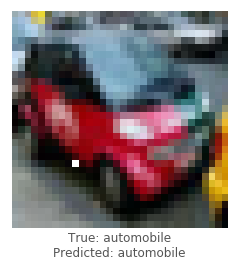

lenet - image 7218 - 847 / 1000


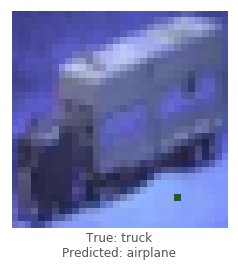

lenet - image 5615 - 848 / 1000


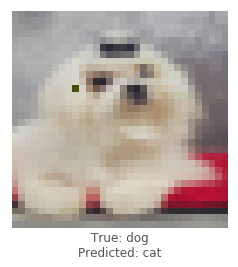

lenet - image 6121 - 849 / 1000


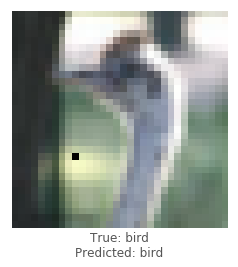

lenet - image 4267 - 850 / 1000


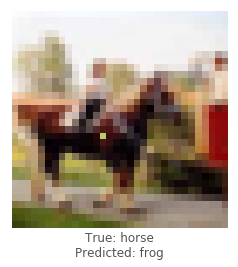

lenet - image 5489 - 851 / 1000


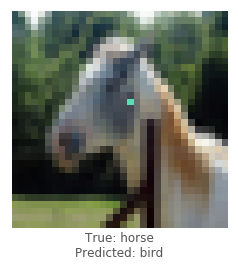

lenet - image 5253 - 852 / 1000


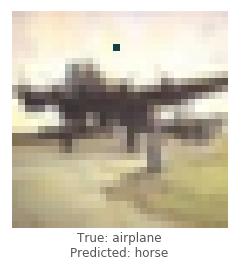

lenet - image 566 - 853 / 1000


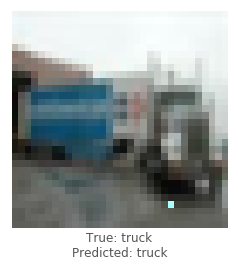

lenet - image 626 - 854 / 1000


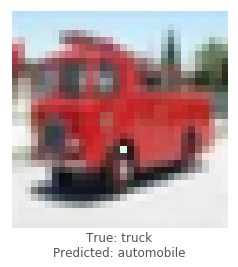

lenet - image 8698 - 855 / 1000


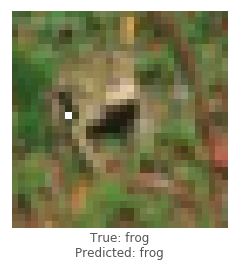

lenet - image 8724 - 856 / 1000


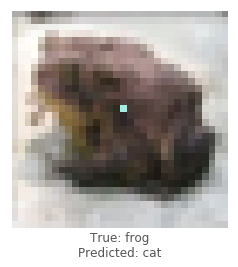

lenet - image 2046 - 857 / 1000


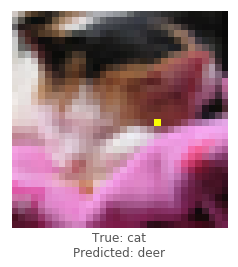

lenet - image 167 - 858 / 1000


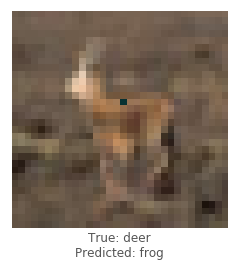

lenet - image 4807 - 859 / 1000


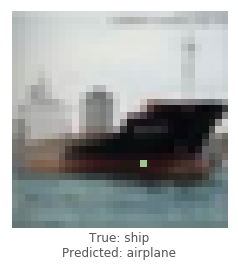

lenet - image 6918 - 860 / 1000


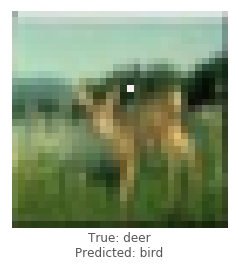

lenet - image 2761 - 861 / 1000


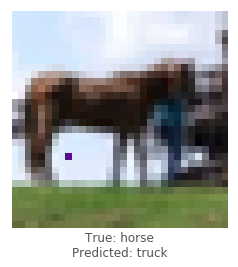

lenet - image 3328 - 862 / 1000


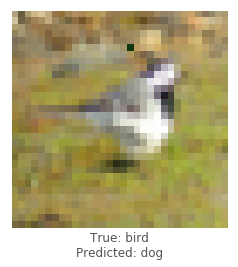

lenet - image 9802 - 863 / 1000


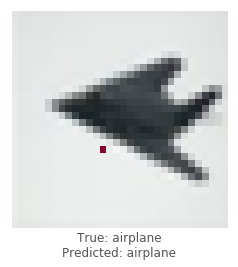

lenet - image 4059 - 864 / 1000


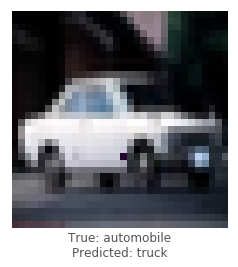

lenet - image 5304 - 865 / 1000


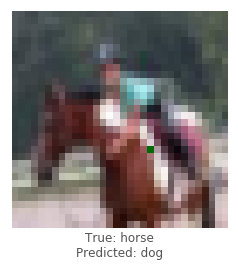

lenet - image 7042 - 866 / 1000


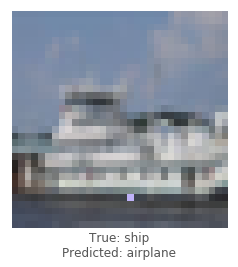

lenet - image 3597 - 867 / 1000


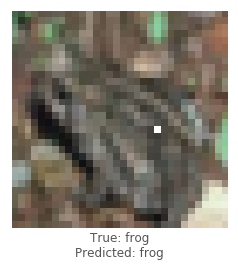

lenet - image 1500 - 868 / 1000


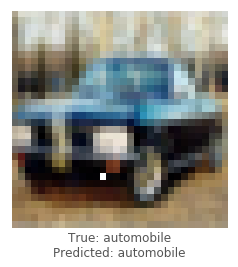

lenet - image 2813 - 869 / 1000


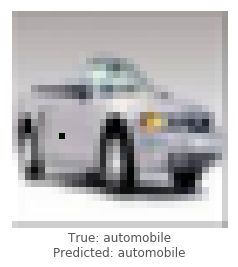

lenet - image 6059 - 870 / 1000


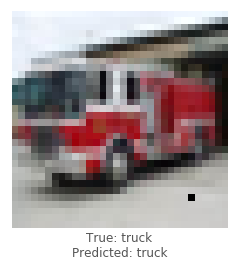

lenet - image 3210 - 871 / 1000


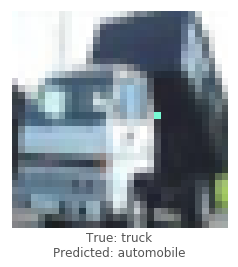

lenet - image 4406 - 872 / 1000


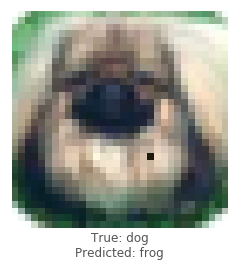

lenet - image 9833 - 873 / 1000


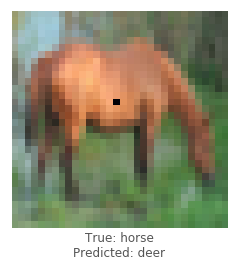

lenet - image 3954 - 874 / 1000


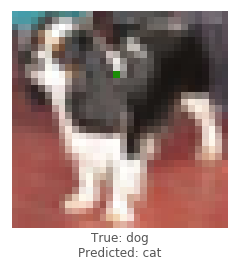

lenet - image 7447 - 875 / 1000


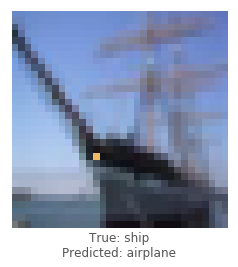

lenet - image 7888 - 876 / 1000


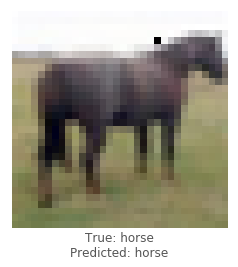

lenet - image 7755 - 877 / 1000


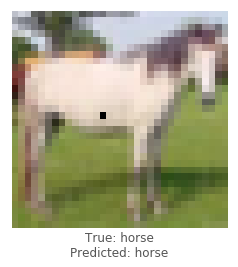

lenet - image 6673 - 878 / 1000


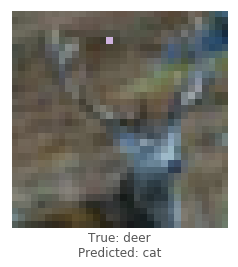

lenet - image 581 - 879 / 1000


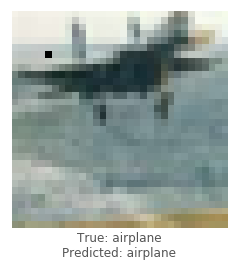

lenet - image 3060 - 880 / 1000


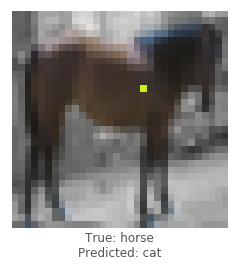

lenet - image 4467 - 881 / 1000


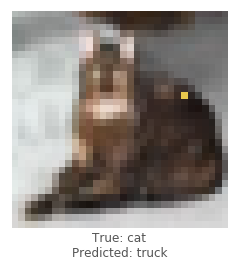

lenet - image 7426 - 882 / 1000


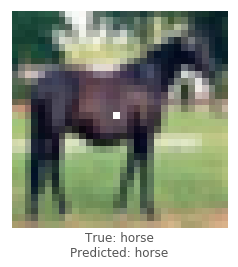

lenet - image 5104 - 883 / 1000


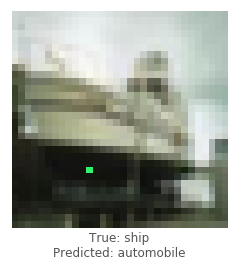

lenet - image 6535 - 884 / 1000


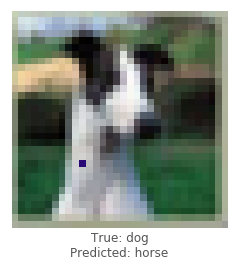

lenet - image 3093 - 885 / 1000


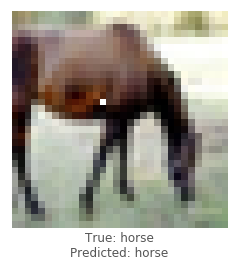

lenet - image 9442 - 886 / 1000


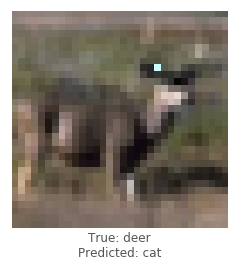

lenet - image 588 - 887 / 1000


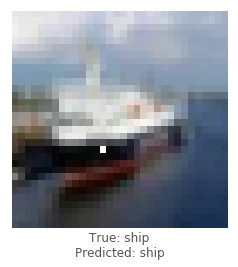

lenet - image 8160 - 888 / 1000


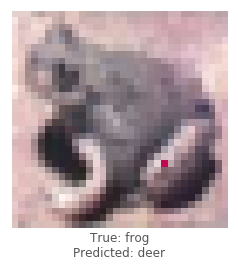

lenet - image 7565 - 889 / 1000


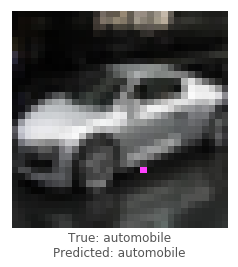

lenet - image 935 - 890 / 1000


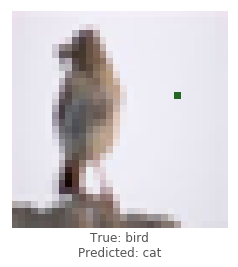

lenet - image 9897 - 891 / 1000


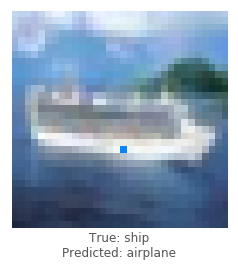

lenet - image 8596 - 892 / 1000


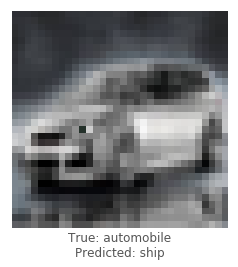

lenet - image 5551 - 893 / 1000


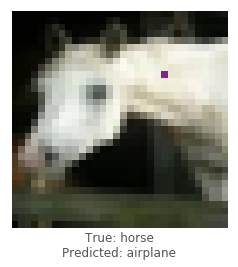

lenet - image 2247 - 894 / 1000


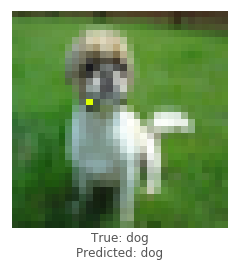

lenet - image 9413 - 895 / 1000


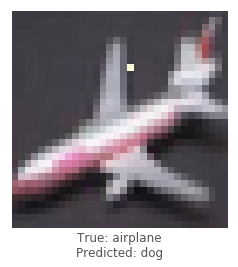

lenet - image 2943 - 896 / 1000


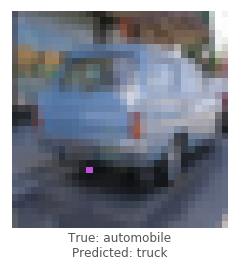

lenet - image 8100 - 897 / 1000


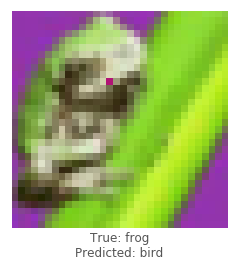

lenet - image 6927 - 898 / 1000


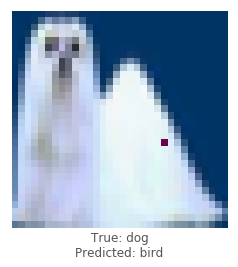

lenet - image 8709 - 899 / 1000


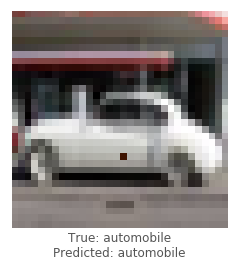

lenet - image 3685 - 900 / 1000


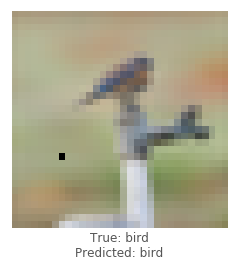

lenet - image 5483 - 901 / 1000


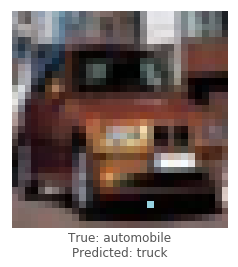

lenet - image 1310 - 902 / 1000


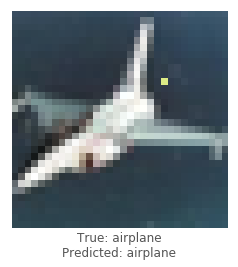

lenet - image 3640 - 903 / 1000


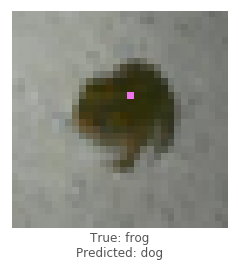

lenet - image 4756 - 904 / 1000


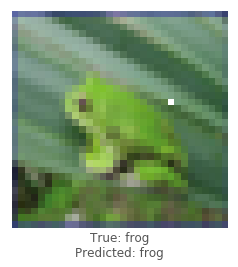

lenet - image 178 - 905 / 1000


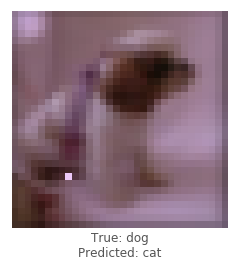

lenet - image 9472 - 906 / 1000


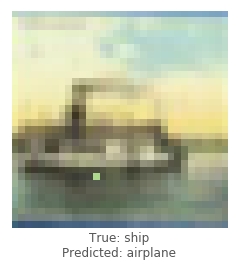

lenet - image 1428 - 907 / 1000


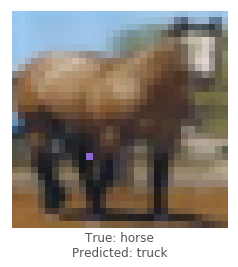

lenet - image 1711 - 908 / 1000


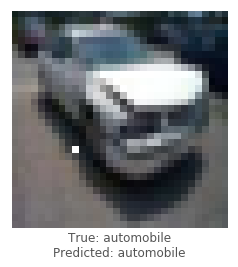

lenet - image 169 - 909 / 1000


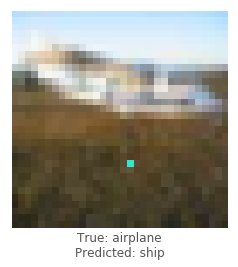

lenet - image 3471 - 910 / 1000


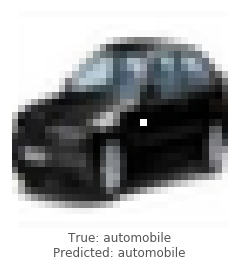

lenet - image 3170 - 911 / 1000


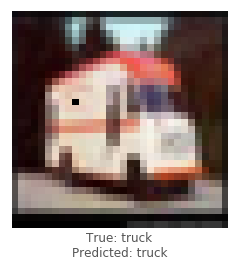

lenet - image 9956 - 912 / 1000


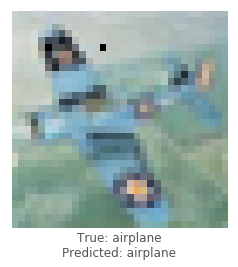

lenet - image 4448 - 913 / 1000


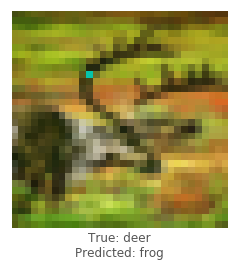

lenet - image 9885 - 914 / 1000


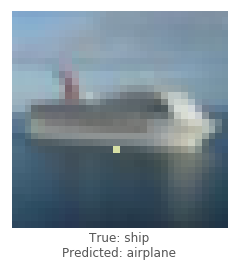

lenet - image 5891 - 915 / 1000


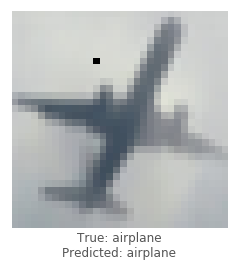

lenet - image 8345 - 916 / 1000


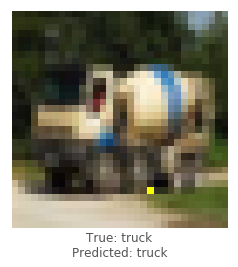

lenet - image 401 - 917 / 1000


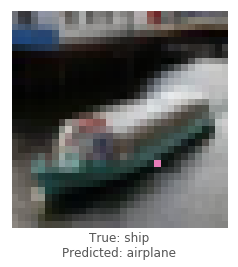

lenet - image 8793 - 918 / 1000


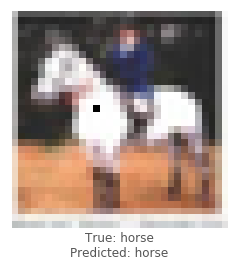

lenet - image 2387 - 919 / 1000


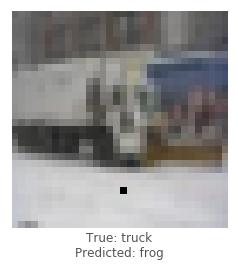

lenet - image 5989 - 920 / 1000


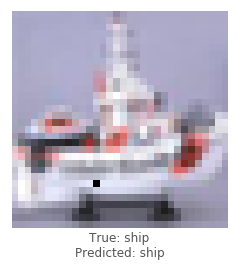

lenet - image 7695 - 921 / 1000


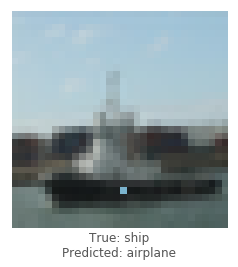

lenet - image 5067 - 922 / 1000


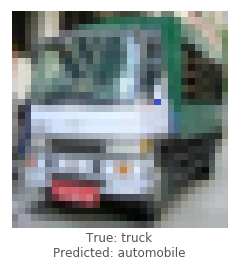

lenet - image 5510 - 923 / 1000


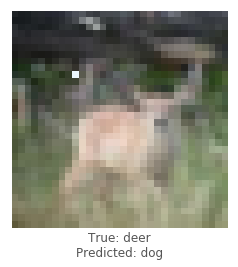

lenet - image 3595 - 924 / 1000


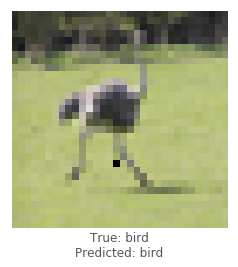

lenet - image 5543 - 925 / 1000


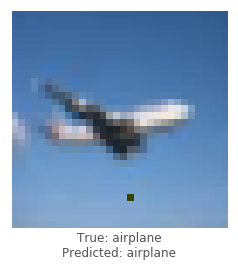

lenet - image 6578 - 926 / 1000


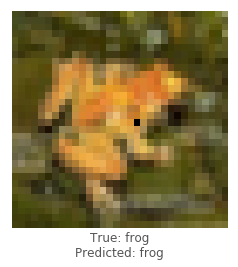

lenet - image 2584 - 927 / 1000


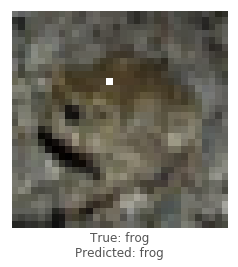

lenet - image 1515 - 928 / 1000


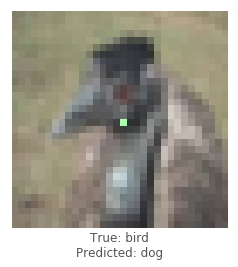

lenet - image 9276 - 929 / 1000


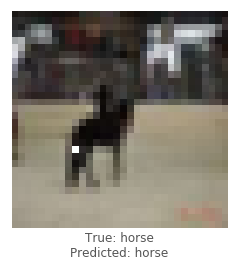

lenet - image 4547 - 930 / 1000


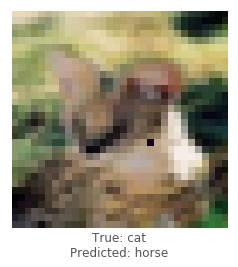

lenet - image 6995 - 931 / 1000


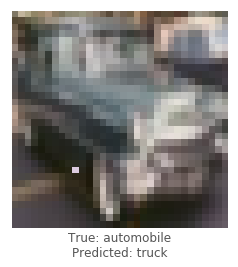

lenet - image 2659 - 932 / 1000


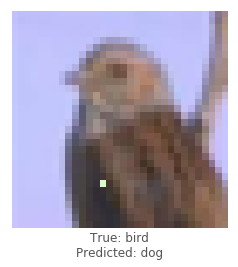

lenet - image 4168 - 933 / 1000


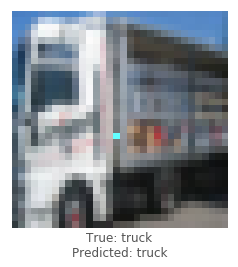

lenet - image 2773 - 934 / 1000


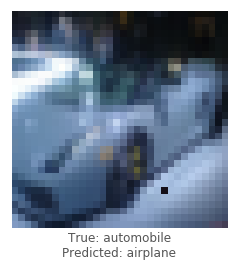

lenet - image 2020 - 935 / 1000


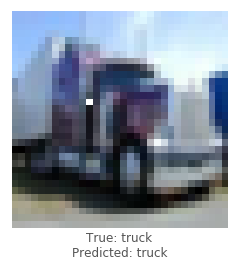

lenet - image 6809 - 936 / 1000


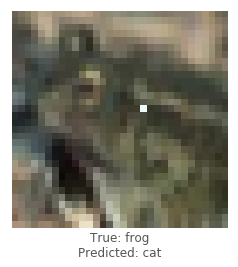

lenet - image 7336 - 937 / 1000


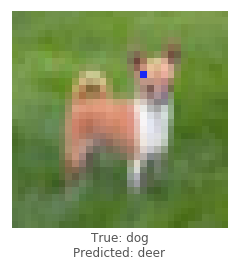

lenet - image 3576 - 938 / 1000


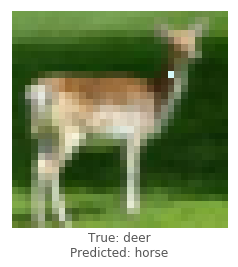

lenet - image 1861 - 939 / 1000


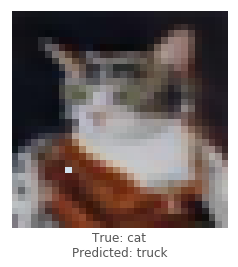

lenet - image 1907 - 940 / 1000


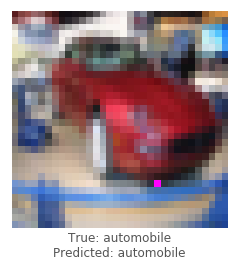

lenet - image 8230 - 941 / 1000


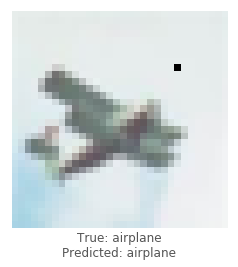

lenet - image 6671 - 942 / 1000


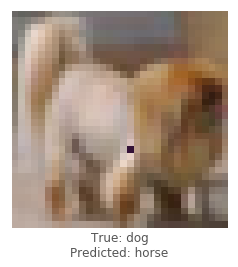

lenet - image 9487 - 943 / 1000


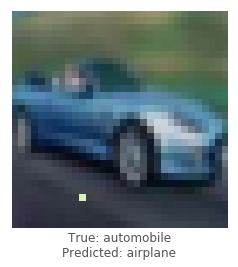

lenet - image 8928 - 944 / 1000


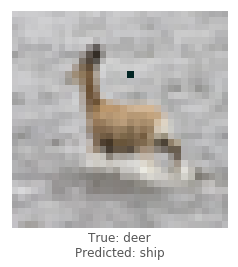

lenet - image 7965 - 945 / 1000


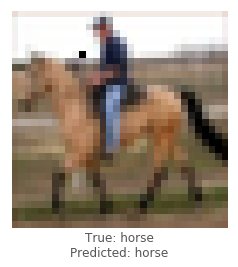

lenet - image 8227 - 946 / 1000


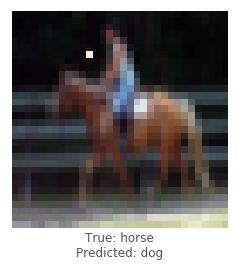

lenet - image 3454 - 947 / 1000


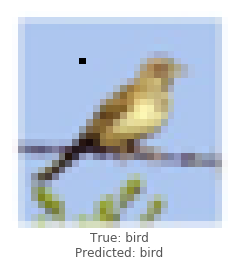

lenet - image 4424 - 948 / 1000


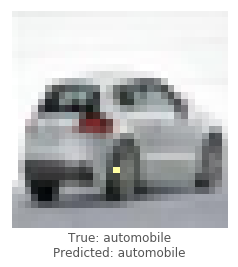

lenet - image 7626 - 949 / 1000


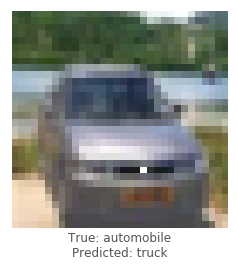

lenet - image 7340 - 950 / 1000


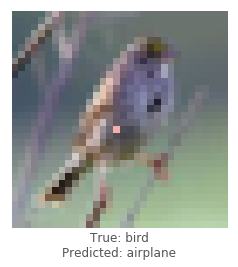

lenet - image 3386 - 951 / 1000


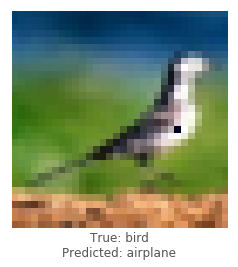

lenet - image 5080 - 952 / 1000


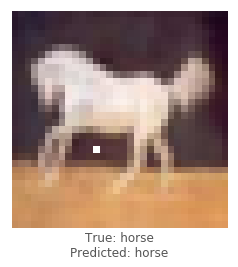

lenet - image 6107 - 953 / 1000


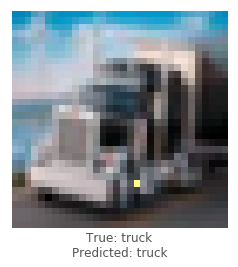

lenet - image 3843 - 954 / 1000


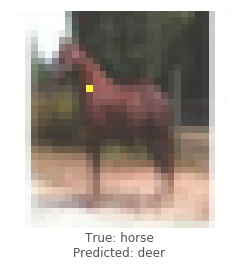

lenet - image 364 - 955 / 1000


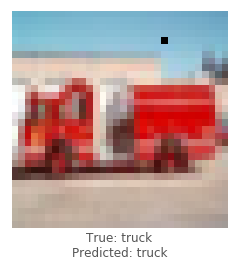

lenet - image 1991 - 956 / 1000


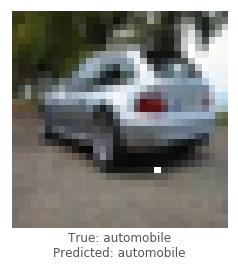

lenet - image 8640 - 957 / 1000


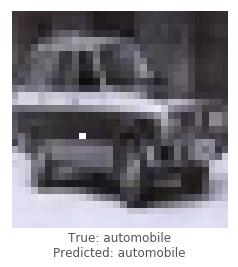

lenet - image 5065 - 958 / 1000


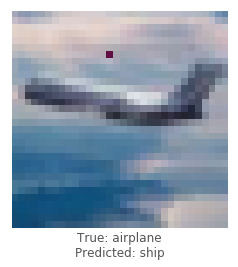

lenet - image 4534 - 959 / 1000


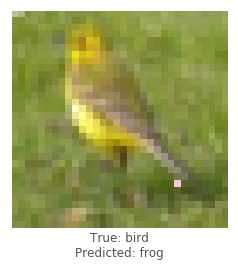

lenet - image 8663 - 960 / 1000


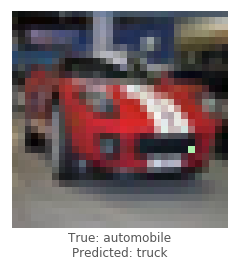

lenet - image 4538 - 961 / 1000


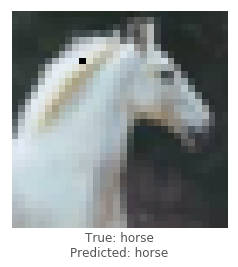

lenet - image 6019 - 962 / 1000


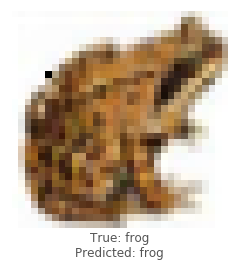

lenet - image 6874 - 963 / 1000


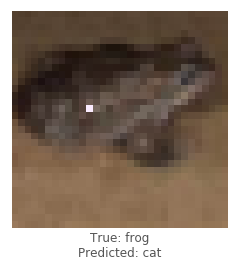

lenet - image 9007 - 964 / 1000


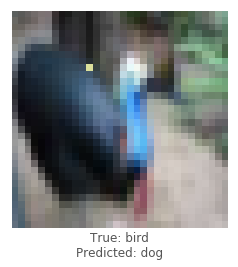

lenet - image 3118 - 965 / 1000


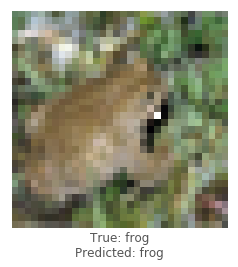

lenet - image 4399 - 966 / 1000


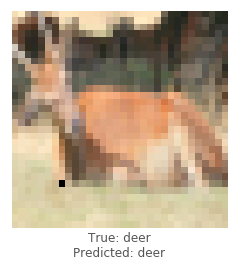

lenet - image 2031 - 967 / 1000


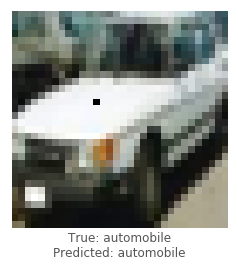

lenet - image 9811 - 968 / 1000


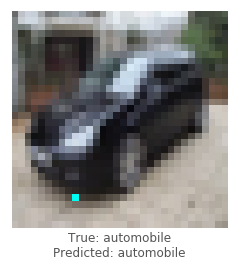

lenet - image 7456 - 969 / 1000


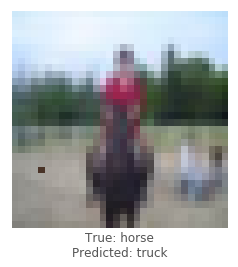

lenet - image 7211 - 970 / 1000


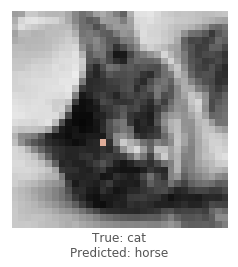

lenet - image 108 - 971 / 1000


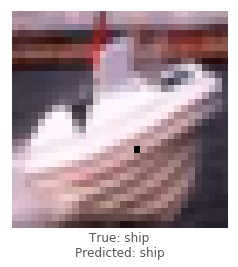

lenet - image 9608 - 972 / 1000


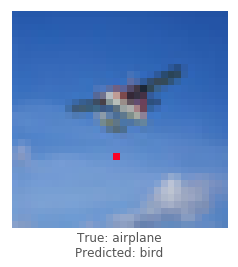

lenet - image 2367 - 973 / 1000


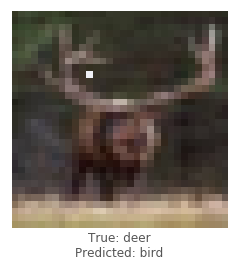

lenet - image 5938 - 974 / 1000


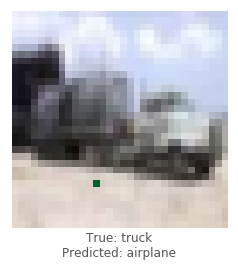

lenet - image 3968 - 975 / 1000


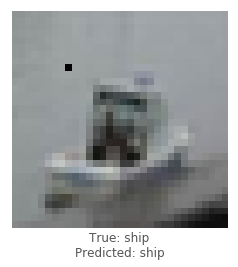

lenet - image 7763 - 976 / 1000


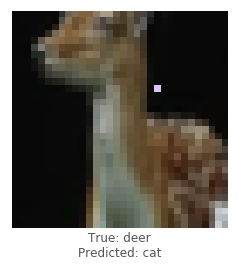

lenet - image 1411 - 977 / 1000


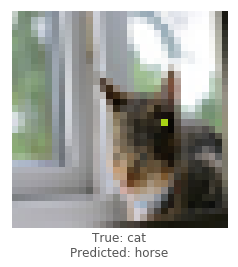

lenet - image 9022 - 978 / 1000


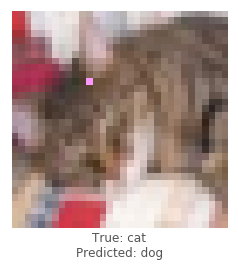

lenet - image 2587 - 979 / 1000


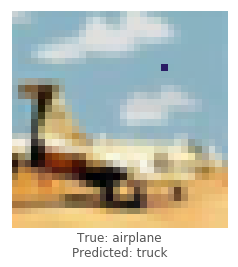

lenet - image 536 - 980 / 1000


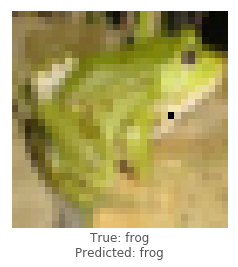

lenet - image 4306 - 981 / 1000


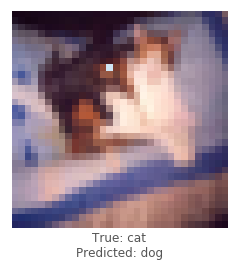

lenet - image 2725 - 982 / 1000


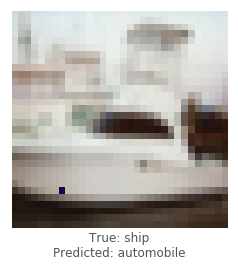

lenet - image 5954 - 983 / 1000


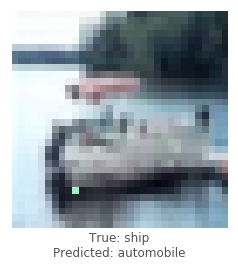

lenet - image 5926 - 984 / 1000


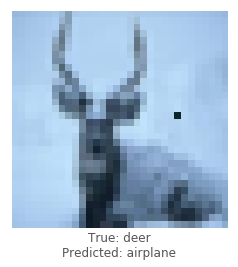

lenet - image 6331 - 985 / 1000


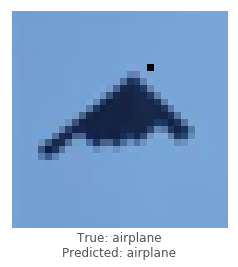

lenet - image 617 - 986 / 1000


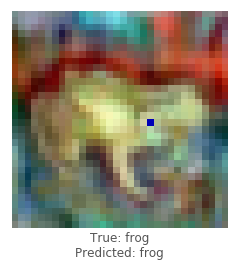

lenet - image 4568 - 987 / 1000


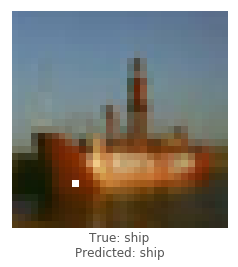

lenet - image 5770 - 988 / 1000


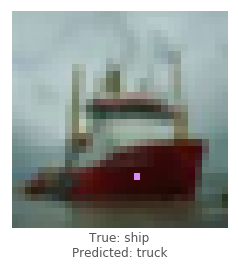

lenet - image 1442 - 989 / 1000


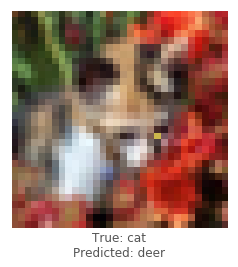

lenet - image 8203 - 990 / 1000


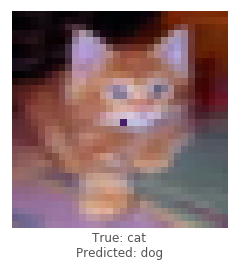

lenet - image 4753 - 991 / 1000


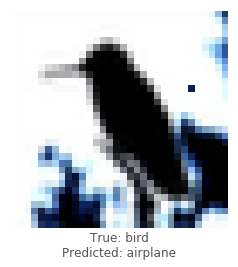

lenet - image 9191 - 992 / 1000


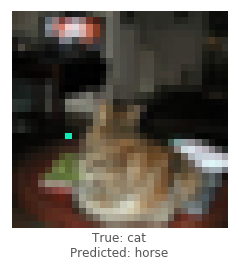

lenet - image 7486 - 993 / 1000


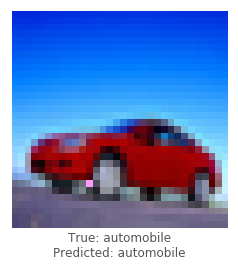

lenet - image 1844 - 994 / 1000


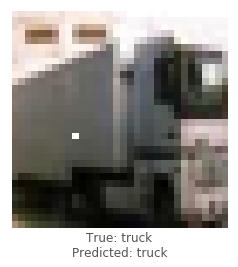

lenet - image 6321 - 995 / 1000


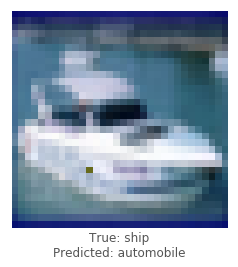

lenet - image 3553 - 996 / 1000


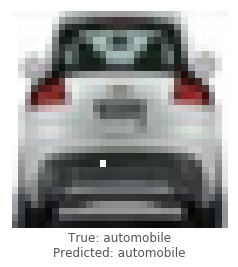

lenet - image 3538 - 997 / 1000


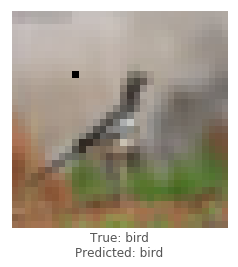

lenet - image 5963 - 998 / 1000


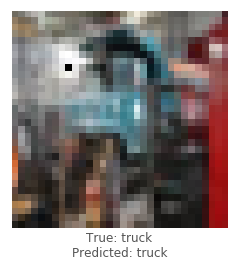

lenet - image 1970 - 999 / 1000


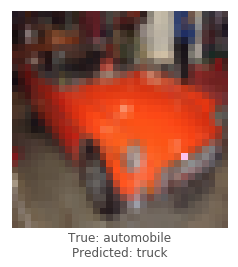

lenet - image 6758 - 1000 / 1000


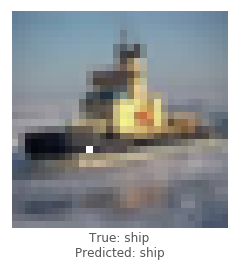

In [31]:
models = [lenet]
untargeted = attack_all(models, samples=1000, pixels=[1], targeted=False)

In [ ]:
# targeted = attack_all(models, samples=10, targeted=True)

### Attack Statistics

Print the final results! 

In [ ]:
# Load the result
# untargeted, targeted = helper.load_results()

In [ ]:
# columns = ['model', 'pixels', 'image', 'true', 'predicted', 'success', 'cdiff', 'prior_probs', 'predicted_probs', 'perturbation']
# untargeted_results = pd.DataFrame(untargeted, columns=columns)
# targeted_results = pd.DataFrame(targeted, columns=columns)

#### Untargeted

In [ ]:
helper.attack_stats(untargeted_results, models, network_stats)

#### Targeted

In [ ]:
# helper.attack_stats(targeted_results, models, network_stats)

### Show some successful attacks

Plot 9 random successful attack images

In [ ]:
print('Untargeted Attack')
helper.visualize_attack(untargeted_results, class_names)

In [ ]:
# print('Targeted Attack')
# helper.visualize_attack(targeted_results, class_names)

In [16]:
n_elements = ["112", "224", "336"]
for model in models:
    for n_element in n_elements:
        directory = model.name + "_reconstruction/one_pixel/" + n_element + "/"
        for img_file in os.listdir(directory):
            img_num = re.findall("([\d]+)",img_file)[0]
            img = Image.open(directory + img_file, 'r')
            img = np.asarray(img)
            probs = model.predict_one(img);
            predicted_class = np.argmax(predicted_probs)
            file = open(model.name + '_reconstruction_prediction.csv', 'a')
            with file:
                writer = csv.writer(file)
                writer.writerow([img_num, model.name, class_names[predicted_class], probs])

## Conclusions

It appears that the accuracy of a model is not strongly correlated with the chance of performing a successful attack on an image. Perhaps surprisingly, the purely convolutional model is the most resistant CNN to these types of attacks. In addition, the capsule network CapsNet has the lowest attack success rate out of all the models, although it is still vulnerable to attack.

[Part 2](1_one-pixel-attack-cifar10.ipynb)

## Credits
 -  This implemenation is based off of the original paper describing the one pixel attack: https://arxiv.org/abs/1710.08864
 - Base code for iPython notebook: https://github.com/09rohanchopra/cifar10
 - Keras Cifar10 models: https://github.com/BIGBALLON/cifar-10-cnn
 - Scipy's differential evolution implementation: https://docs.scipy.org/doc/scipy-0.17.0/reference/generated/scipy.optimize.differential_evolution.html
 - State of the art: https://github.com/RedditSota/state-of-the-art-result-for-machine-learning-problems
 - CapsNet Keras: https://github.com/XifengGuo/CapsNet-Keras
 - CapsNet with Cifar: https://github.com/theblackcat102/dynamic-routing-capsule-cifar